### PreProcess data
Loaded in as "psi" from personal directory.

In [ ]:
import datetime
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import mean_squared_error
from scipy.stats import linregress
import math

# Pre-processing
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

psi = np.load(r"C:\Users\danie\OneDrive\Desktop\work_torch\long_run_310k.npy")
lead = 1

trainN = int(250000)
valN = int(50000)

psi = psi[:,1,:]

print(psi.shape)
mean_psi = np.mean(psi, axis=0, keepdims=True)
std_psi = np.std(psi, axis=0, keepdims=True)
psi = (psi - mean_psi) / std_psi

psi_train_input = torch.tensor(psi[0:trainN, :], dtype=torch.float32)
psi_train_label =  torch.tensor(psi[lead:trainN+lead, :], dtype=torch.float32)

# Make sure input and label lengths match
assert psi_train_input.shape[0] == psi_train_label.shape[0], "Input and label length mismatch"

#shuffle and map indices
valid_indices = np.arange(0, trainN - lead)
np.random.seed(42)  # Optional for reproducibility
shuffled_indices = np.random.permutation(valid_indices)
psi_train_input = torch.tensor(psi[shuffled_indices, :], dtype=torch.float32)
psi_train_label = torch.tensor(psi[shuffled_indices + lead, :], dtype=torch.float32)


# t = shuffled_indices[0]
psi = psi[:, :]
print(psi.shape)
# print(torch.allclose(psi_train_input[0], torch.tensor(psi[t])))
# print(torch.allclose(psi_train_label[0], torch.tensor(psi[t + 1])))

psi_val_input = torch.tensor(psi[trainN:trainN+valN], dtype=torch.float32)
psi_val_label = torch.tensor(psi[trainN+lead:trainN+valN+lead], dtype=torch.float32)


print(psi_train_input.shape)
print(psi_train_label.shape)
print(psi_val_input.shape)
print(psi_val_label.shape)

(309700, 75)
(309700, 75)
torch.Size([249999, 75])
torch.Size([249999, 75])
torch.Size([50000, 75])
torch.Size([50000, 75])


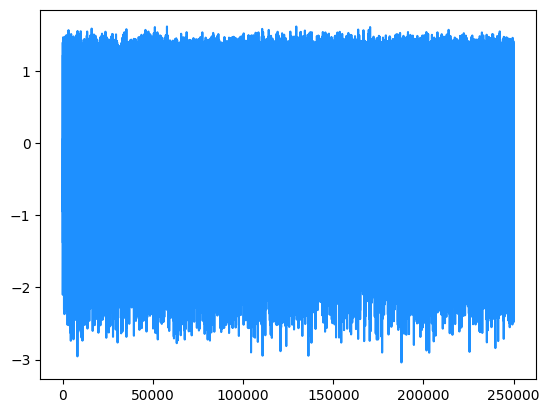

In [2]:
plt.plot(psi_train_input[0:trainN, 63], color ='dodgerblue', label='Input')

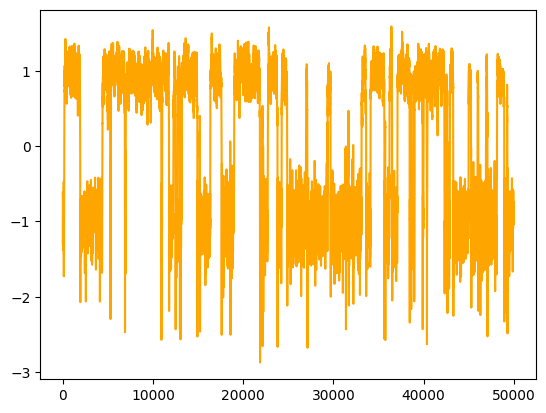

In [3]:
plt.plot(psi_val_input[0:valN, 63], color='orange', label='Validation Input')

### Define Model Architecture

In [4]:
# Define the encoder (MLP)
class Encoder(nn.Module):
    def __init__(self, condition_dim, latent_dim):
        super(Encoder, self).__init__()
        self.fc1 = nn.Linear(condition_dim, 512)  # Input layer (2 + 2) -> Hidden layer (128)
        self.fc2 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc3 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc4 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc5 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc6 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc_mu = nn.Linear(512, latent_dim)  # Hidden layer (128) -> Latent space (2)
        self.fc_logvar = nn.Linear(512, latent_dim)  # Hidden layer (128) -> Log variance (2)

    def forward(self, x):
        x = torch.relu(self.fc1(x))  # Activation function for hidden layer
        x = torch.relu(self.fc2(x)) + x
        x = torch.relu(self.fc3(x)) + x
        x = torch.relu(self.fc4(x)) + x
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

# Define the decoder (MLP)
class Decoder(nn.Module):
    def __init__(self, latent_dim, output_dim, condition_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(latent_dim + condition_dim, 512)  # Input layer (2 + 2) -> Hidden layer (128)
        self.fc2 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc3 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc4 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc5 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc6 = nn.Linear(512, 512)  # Hidden layer (128) -> Hidden layer (128)
        self.fc_output = nn.Linear(512, output_dim)  # Hidden layer (128) -> Output layer (2)

    def forward(self, z, condition):
        z = torch.cat((z, condition), dim=1)  # Concatenate latent vector and condition
        z = torch.relu(self.fc1(z))  # Activation function for hidden layer
        z = torch.relu(self.fc2(z)) + z
        z = torch.relu(self.fc3(z)) + z
        z = torch.relu(self.fc4(z)) + z
        output = self.fc_output(z)
        return output

# Define the VAE model
class ConditionalVAE(nn.Module):
    def __init__(self, input_dim, latent_dim, output_dim, condition_dim):
        super(ConditionalVAE, self).__init__()
        self.encoder = Encoder(input_dim, latent_dim)
        self.decoder = Decoder(latent_dim, output_dim, condition_dim)

    def encode(self, x):
        mu, logvar = self.encoder(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z

    def decode(self, z, condition):
        return self.decoder(z, condition)

    def forward(self, x, condition):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        output = self.decode(z, condition)
        return output, mu, logvar

input_dim = 75
output_dim = 75
latent_dim = 32
condition_dim = 50
batch_size = 1024
num_epochs = 100

### Initialize Model and Set Folder Path

In [5]:
import datetime
import os


# Initialize the model, optimizer, and loss function
model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim)
model = model.cuda()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S.%f")
folder = f"model_at_{timestamp}"
model_weights_path = f'{folder}/model_weights_pytorch.pth'
os.makedirs(folder)

# Train the Model
Make sure to set the configurations if you want to use TVD and CCDF metrics.

Epoch 1, 
          Reconstrunction Loss: 344.1016845703125,
          KL Divergence Loss: 203.59506225585938
Validation Batch 49, 
        Reconstrunction Loss: 2814.42822265625,
        KL Divergence Loss: 2164.837158203125


Mini Inference at Epoch 0: 100%|██████████| 5000/5000 [00:01<00:00, 2542.85it/s]


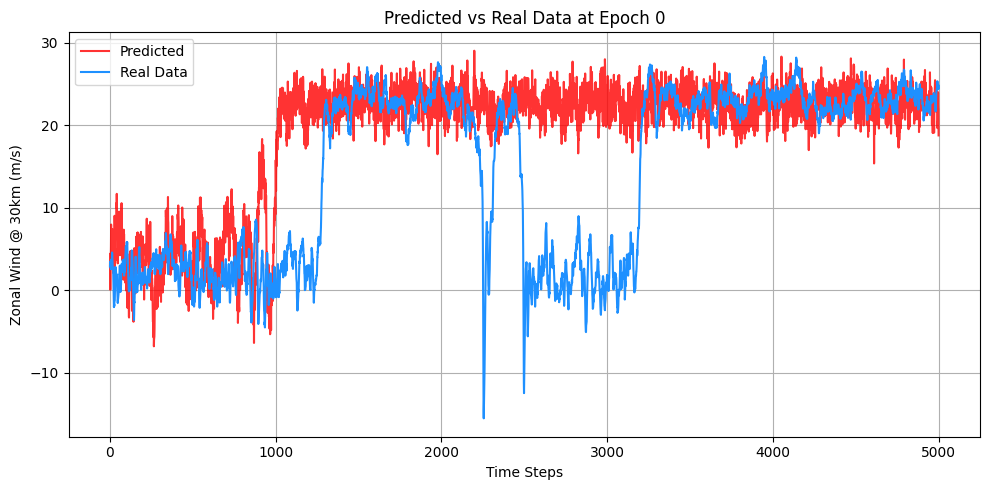

Epoch 2, 
          Reconstrunction Loss: 226.863037109375,
          KL Divergence Loss: 95.5121841430664
Validation Batch 49, 
        Reconstrunction Loss: 2112.16943359375,
        KL Divergence Loss: 1043.6141357421875


Mini Inference at Epoch 1: 100%|██████████| 5000/5000 [00:01<00:00, 2638.63it/s]


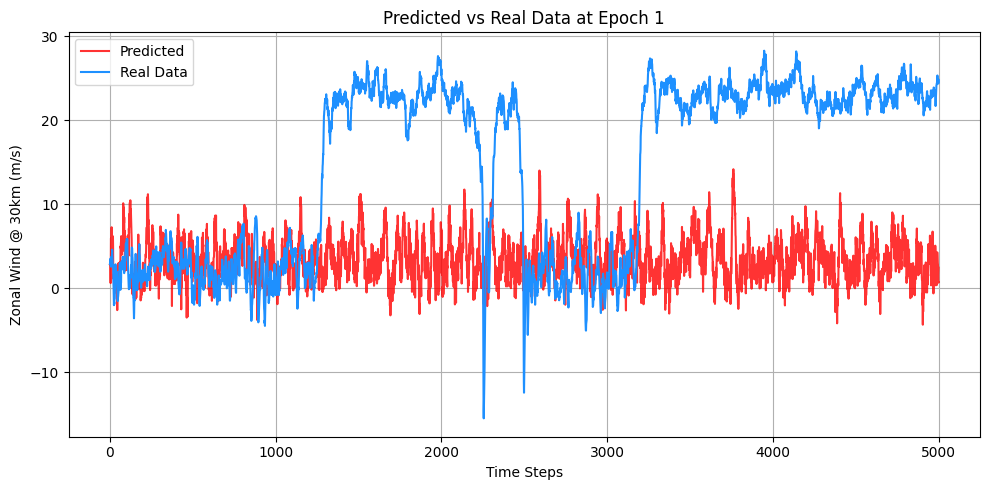

Epoch 3, 
          Reconstrunction Loss: 173.03941345214844,
          KL Divergence Loss: 59.82765579223633
Validation Batch 49, 
        Reconstrunction Loss: 1885.8173828125,
        KL Divergence Loss: 662.8167724609375


Mini Inference at Epoch 2: 100%|██████████| 5000/5000 [00:01<00:00, 2653.87it/s]


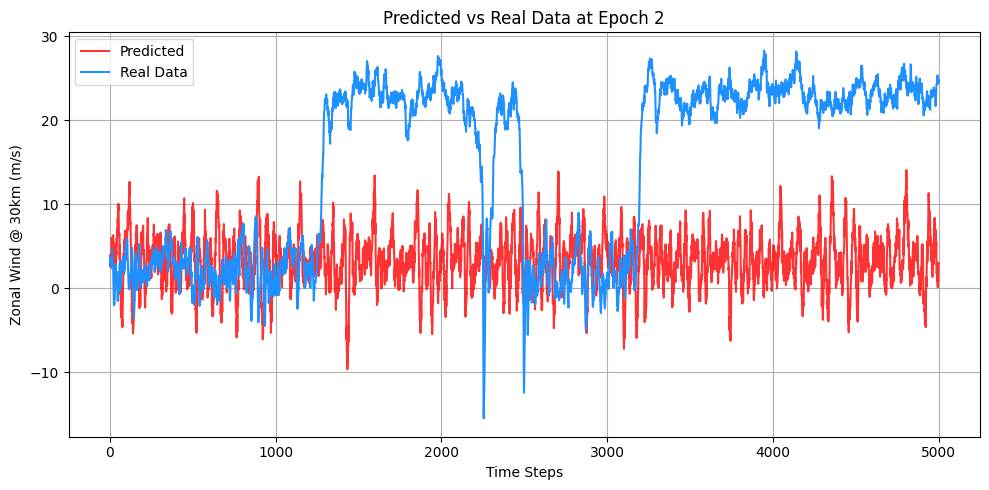

Epoch 4, 
          Reconstrunction Loss: 134.48704528808594,
          KL Divergence Loss: 42.098514556884766
Validation Batch 49, 
        Reconstrunction Loss: 1760.3009033203125,
        KL Divergence Loss: 469.9644775390625


Mini Inference at Epoch 3: 100%|██████████| 5000/5000 [00:01<00:00, 2573.64it/s]


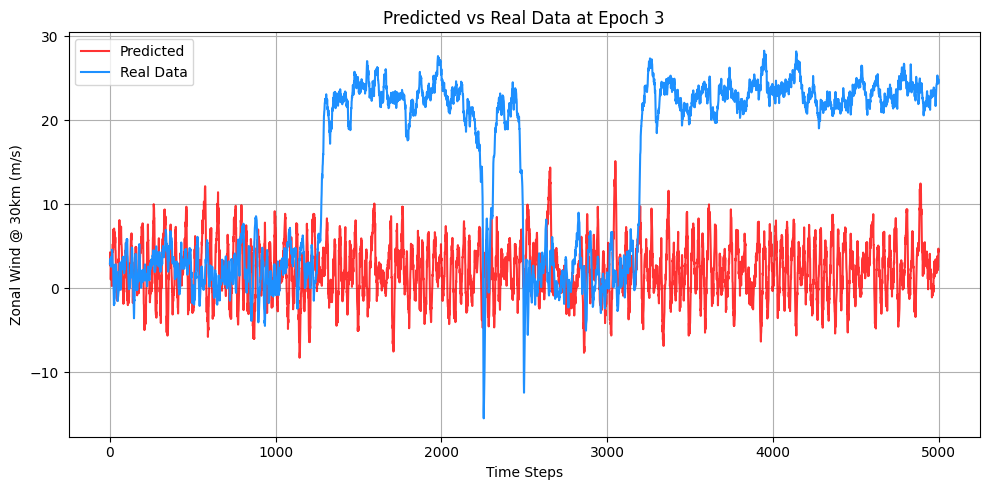

Epoch 5, 
          Reconstrunction Loss: 105.7554931640625,
          KL Divergence Loss: 31.435792922973633
Validation Batch 49, 
        Reconstrunction Loss: 1797.208740234375,
        KL Divergence Loss: 352.349609375


Mini Inference at Epoch 4: 100%|██████████| 5000/5000 [00:01<00:00, 2564.31it/s]


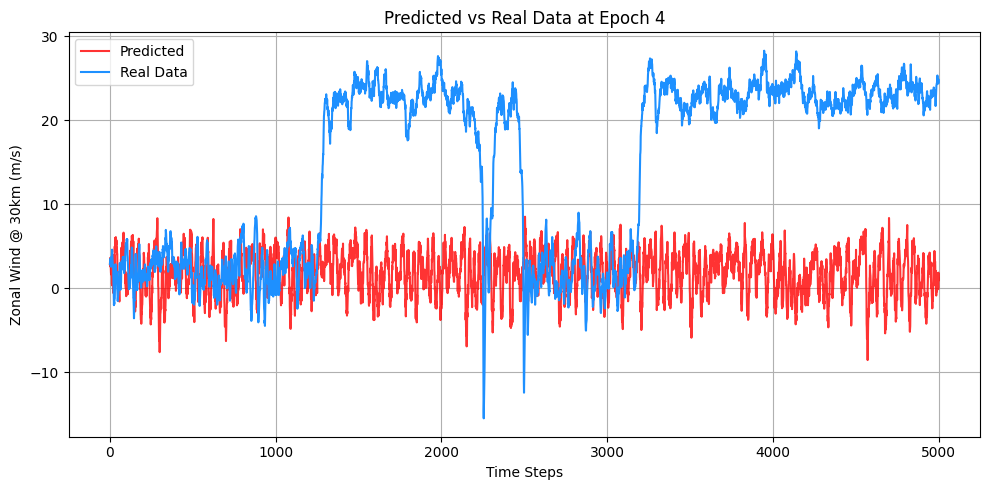

Epoch 6, 
          Reconstrunction Loss: 94.69015502929688,
          KL Divergence Loss: 24.343175888061523
Validation Batch 49, 
        Reconstrunction Loss: 1832.217529296875,
        KL Divergence Loss: 272.9765625


Mini Inference at Epoch 5: 100%|██████████| 5000/5000 [00:01<00:00, 2677.49it/s]


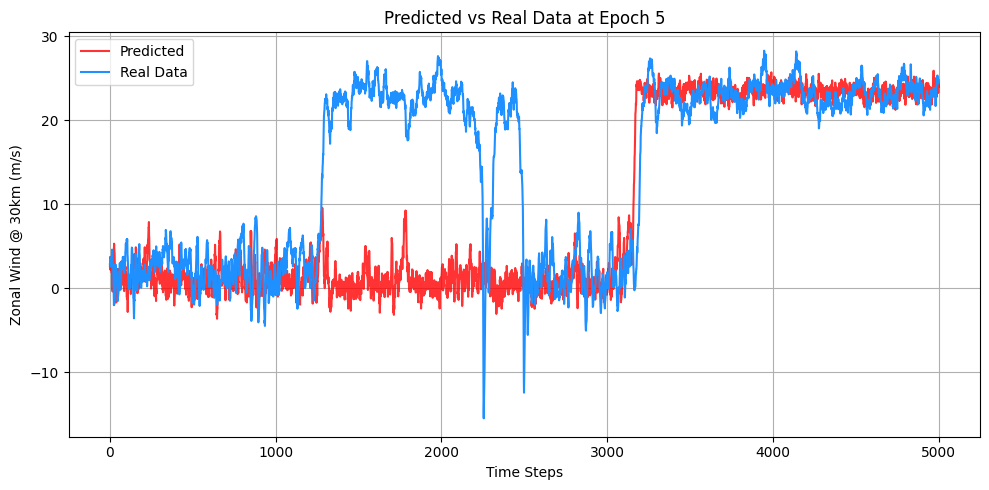

Epoch 7, 
          Reconstrunction Loss: 79.53732299804688,
          KL Divergence Loss: 19.264448165893555
Validation Batch 49, 
        Reconstrunction Loss: 1859.1951904296875,
        KL Divergence Loss: 216.60980224609375


Mini Inference at Epoch 6: 100%|██████████| 5000/5000 [00:02<00:00, 2483.85it/s]


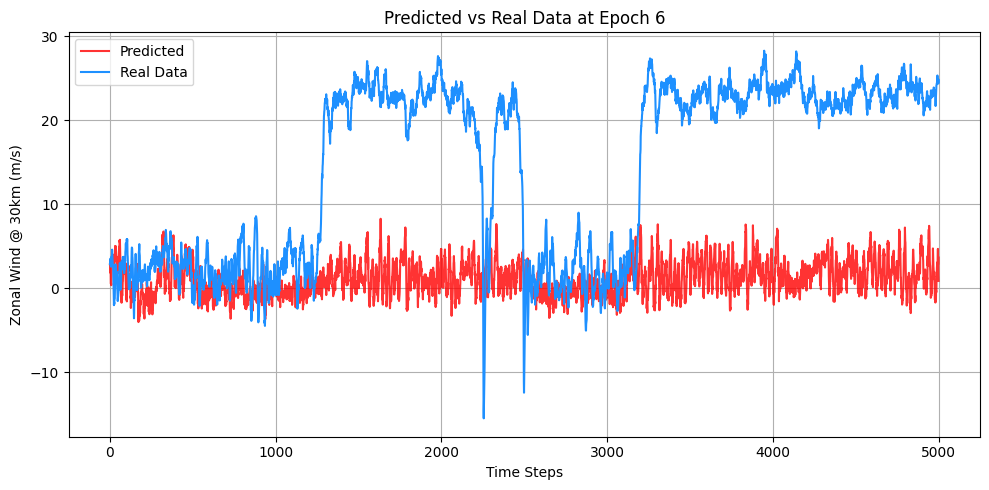

Epoch 8, 
          Reconstrunction Loss: 73.78106689453125,
          KL Divergence Loss: 15.490743637084961
Validation Batch 49, 
        Reconstrunction Loss: 1924.248291015625,
        KL Divergence Loss: 174.1021728515625


Mini Inference at Epoch 7: 100%|██████████| 5000/5000 [00:01<00:00, 2590.71it/s]


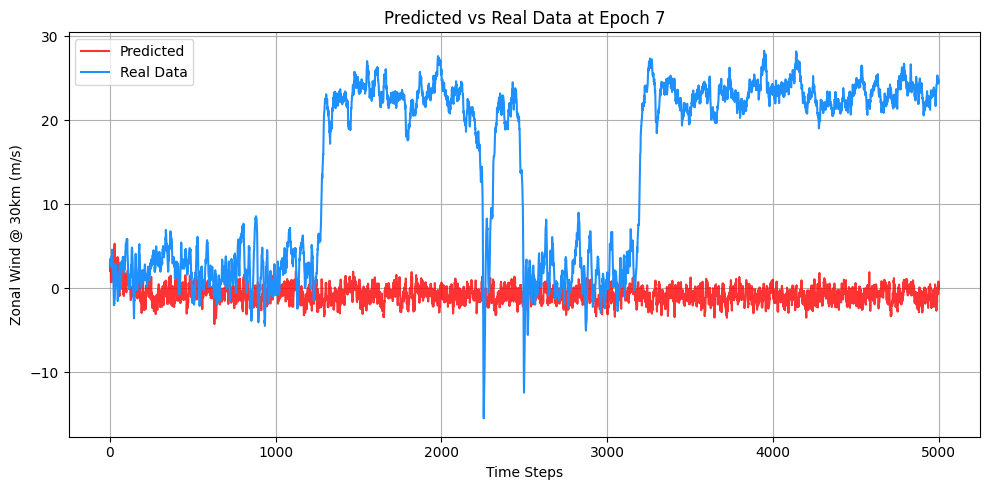

Epoch 9, 
          Reconstrunction Loss: 67.52778625488281,
          KL Divergence Loss: 12.595446586608887
Validation Batch 49, 
        Reconstrunction Loss: 2017.5269775390625,
        KL Divergence Loss: 141.1255645751953


Mini Inference at Epoch 8: 100%|██████████| 5000/5000 [00:01<00:00, 2622.88it/s]


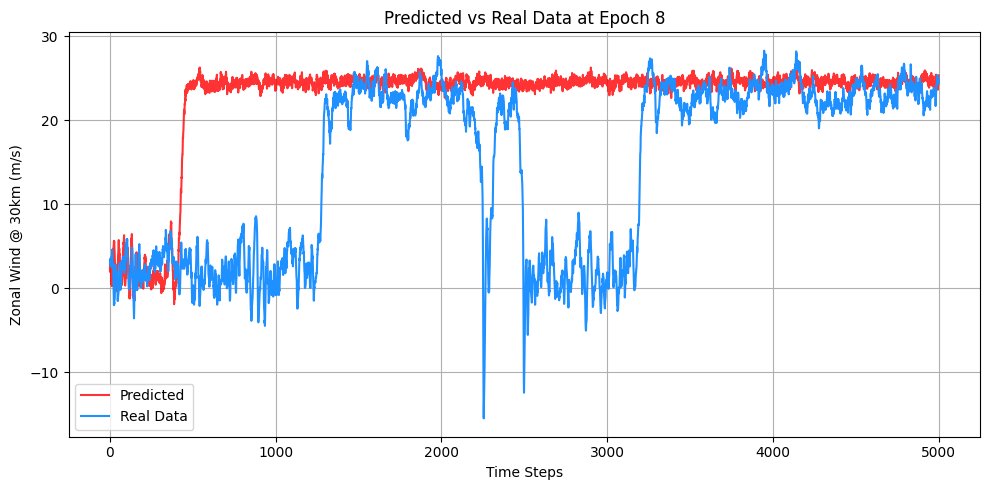

Epoch 10, 
          Reconstrunction Loss: 64.76546478271484,
          KL Divergence Loss: 10.311983108520508
Validation Batch 49, 
        Reconstrunction Loss: 1989.06884765625,
        KL Divergence Loss: 114.93287658691406


Mini Inference at Epoch 9: 100%|██████████| 5000/5000 [00:01<00:00, 2657.40it/s]


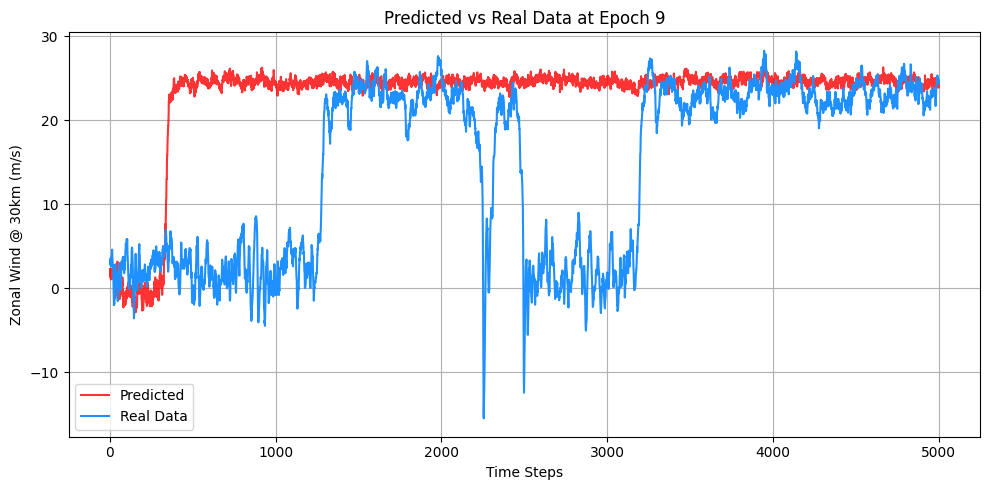

Epoch 11, 
          Reconstrunction Loss: 59.692718505859375,
          KL Divergence Loss: 8.453598022460938
Validation Batch 49, 
        Reconstrunction Loss: 2029.8529052734375,
        KL Divergence Loss: 94.01702880859375


Mini Inference at Epoch 10: 100%|██████████| 5000/5000 [00:01<00:00, 2643.10it/s]


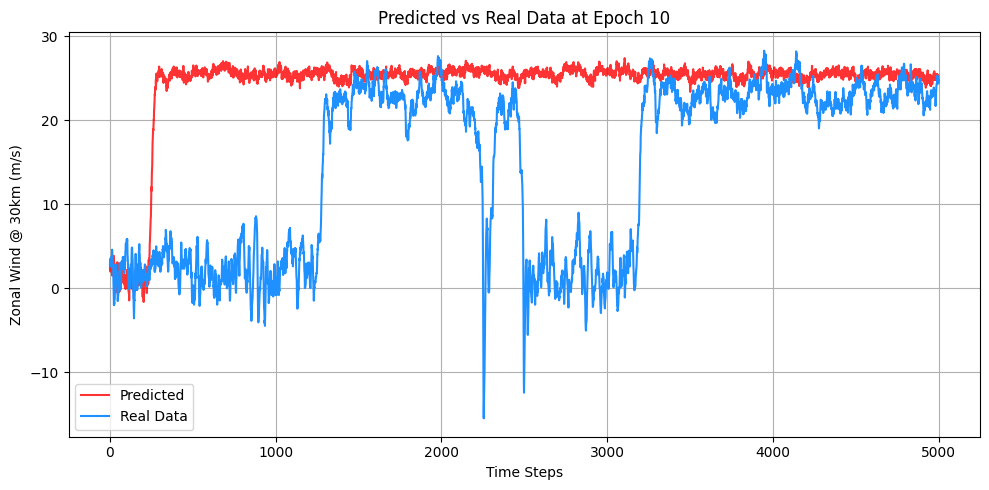

Epoch 12, 
          Reconstrunction Loss: 55.073997497558594,
          KL Divergence Loss: 6.946502685546875
Validation Batch 49, 
        Reconstrunction Loss: 2002.5465087890625,
        KL Divergence Loss: 77.15889739990234


Mini Inference at Epoch 11: 100%|██████████| 5000/5000 [00:02<00:00, 2345.07it/s]


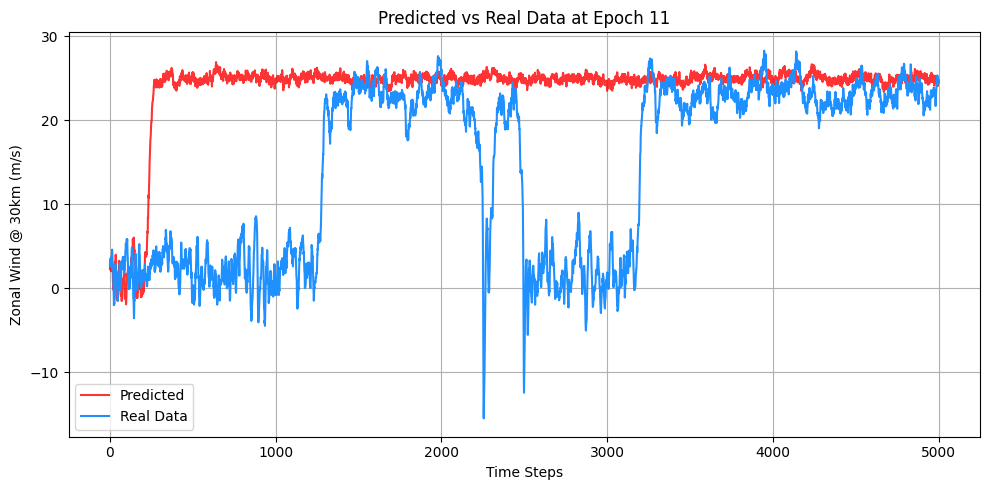

Epoch 13, 
          Reconstrunction Loss: 51.55992126464844,
          KL Divergence Loss: 5.725734710693359
Validation Batch 49, 
        Reconstrunction Loss: 2059.131103515625,
        KL Divergence Loss: 63.28662872314453


Mini Inference at Epoch 12: 100%|██████████| 5000/5000 [00:01<00:00, 2592.65it/s]


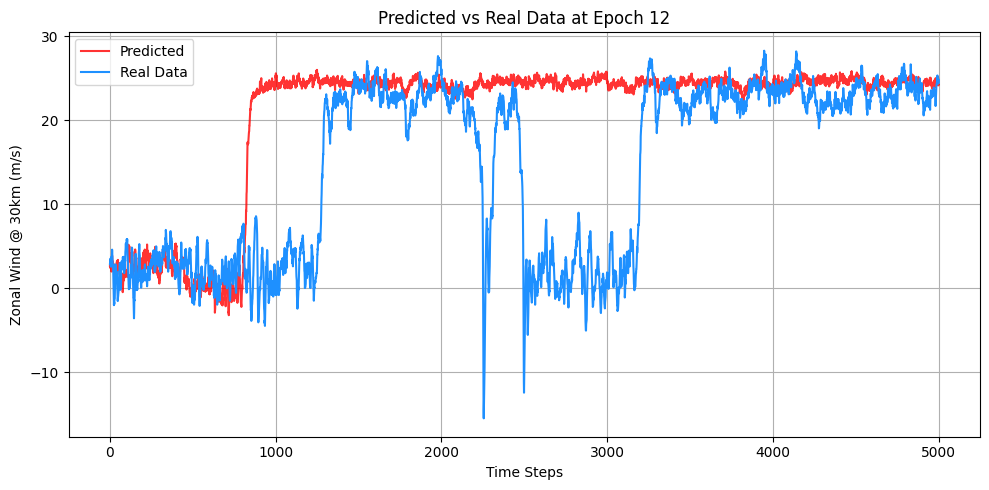

Epoch 14, 
          Reconstrunction Loss: 49.305702209472656,
          KL Divergence Loss: 4.685431003570557
Validation Batch 49, 
        Reconstrunction Loss: 2038.4571533203125,
        KL Divergence Loss: 51.82859420776367


Mini Inference at Epoch 13: 100%|██████████| 5000/5000 [00:01<00:00, 2589.01it/s]


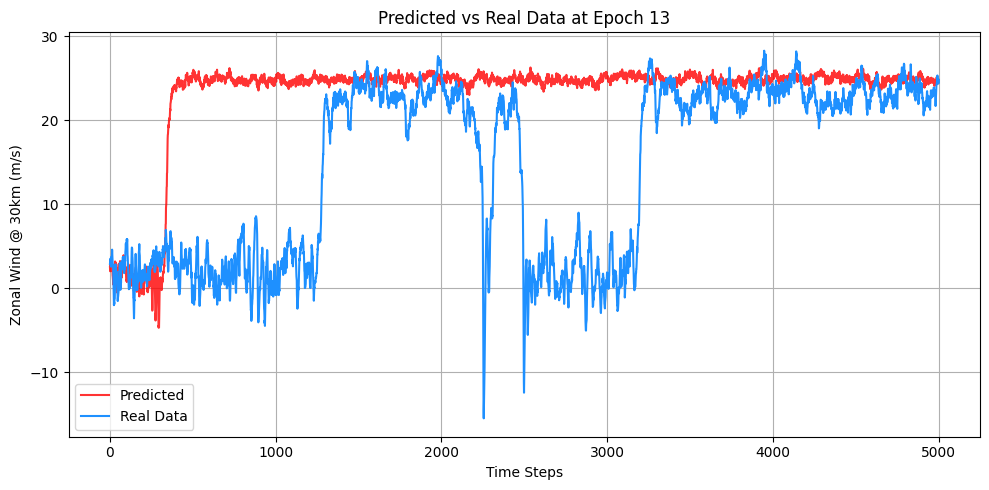

Epoch 15, 
          Reconstrunction Loss: 49.435768127441406,
          KL Divergence Loss: 3.7983932495117188
Validation Batch 49, 
        Reconstrunction Loss: 1993.2999267578125,
        KL Divergence Loss: 42.31028747558594


Mini Inference at Epoch 14: 100%|██████████| 5000/5000 [00:01<00:00, 2500.07it/s]


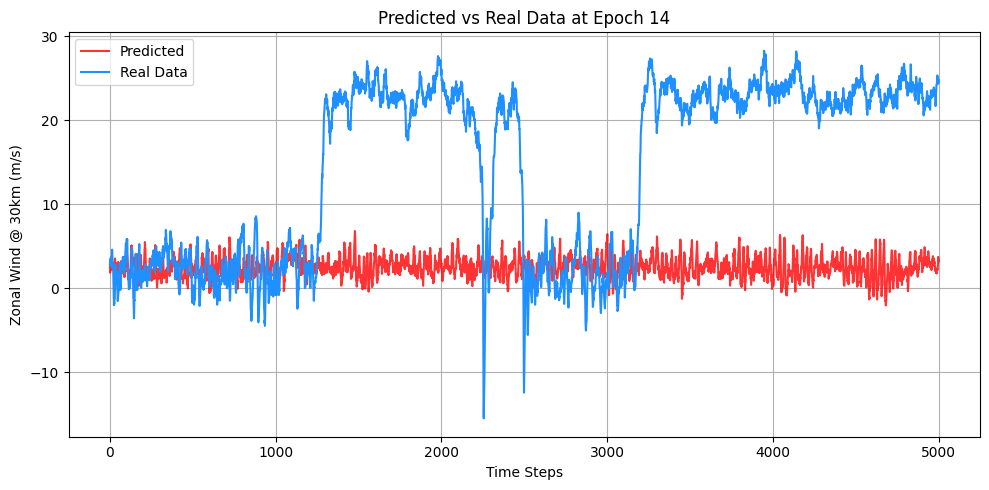

Epoch 16, 
          Reconstrunction Loss: 46.117828369140625,
          KL Divergence Loss: 3.0616893768310547
Validation Batch 49, 
        Reconstrunction Loss: 2044.896484375,
        KL Divergence Loss: 34.63020324707031


Mini Inference at Epoch 15: 100%|██████████| 5000/5000 [00:01<00:00, 2644.28it/s]


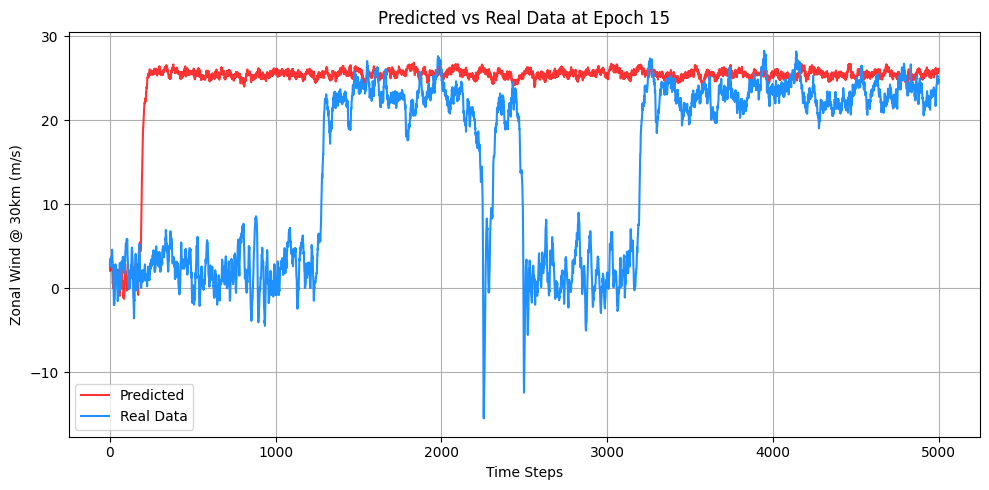

Epoch 17, 
          Reconstrunction Loss: 44.328529357910156,
          KL Divergence Loss: 2.50376296043396
Validation Batch 49, 
        Reconstrunction Loss: 2056.32666015625,
        KL Divergence Loss: 29.001419067382812


Mini Inference at Epoch 16: 100%|██████████| 5000/5000 [00:01<00:00, 2674.39it/s]


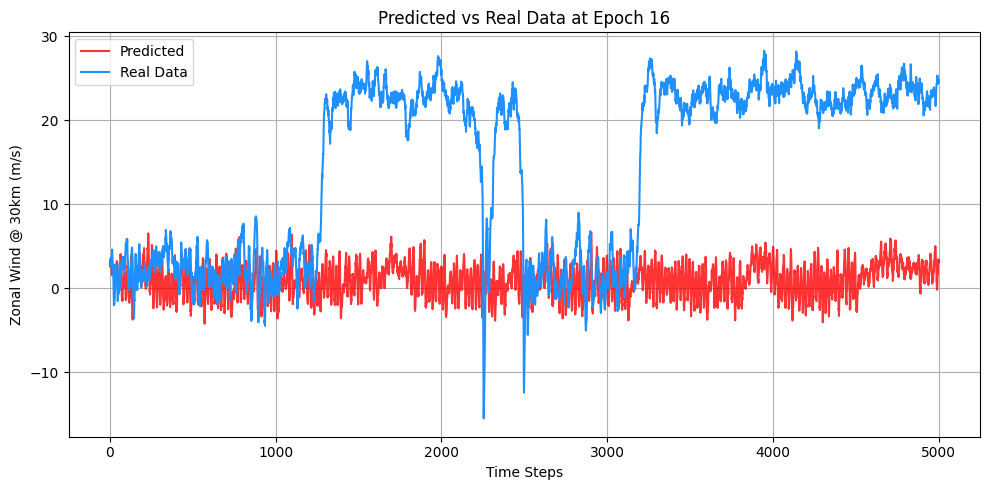

Epoch 18, 
          Reconstrunction Loss: 43.0478401184082,
          KL Divergence Loss: 1.9890332221984863
Validation Batch 49, 
        Reconstrunction Loss: 2036.1556396484375,
        KL Divergence Loss: 22.900699615478516


Mini Inference at Epoch 17: 100%|██████████| 5000/5000 [00:01<00:00, 2592.40it/s]


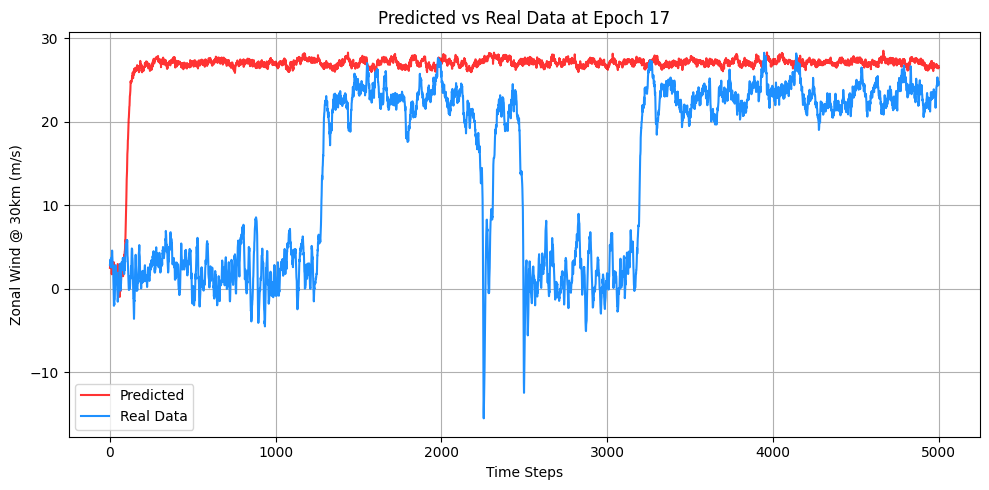

Epoch 19, 
          Reconstrunction Loss: 42.760498046875,
          KL Divergence Loss: 1.6385126113891602
Validation Batch 49, 
        Reconstrunction Loss: 2001.4649658203125,
        KL Divergence Loss: 19.00507354736328


Mini Inference at Epoch 18: 100%|██████████| 5000/5000 [00:01<00:00, 2601.16it/s]


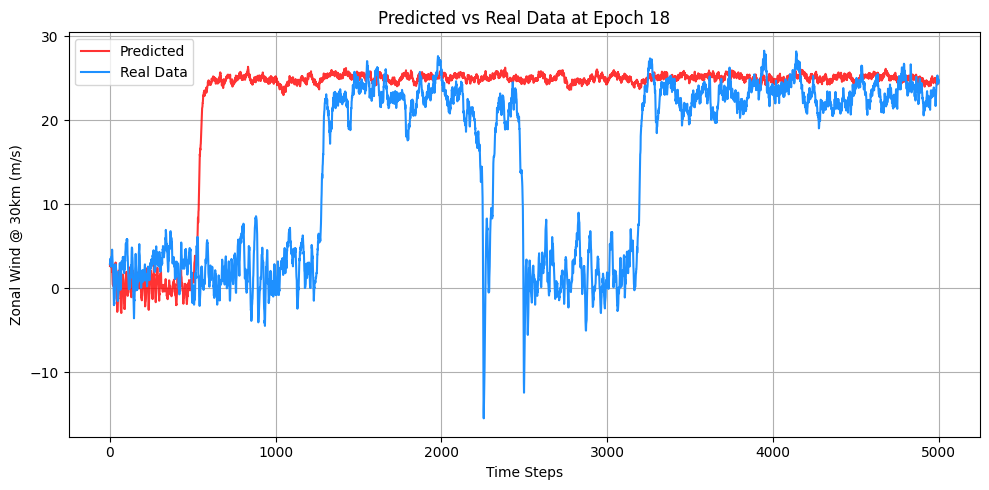

Epoch 20, 
          Reconstrunction Loss: 39.49759292602539,
          KL Divergence Loss: 1.3664159774780273
Validation Batch 49, 
        Reconstrunction Loss: 2070.90478515625,
        KL Divergence Loss: 15.862638473510742


Mini Inference at Epoch 19: 100%|██████████| 5000/5000 [00:01<00:00, 2652.96it/s]


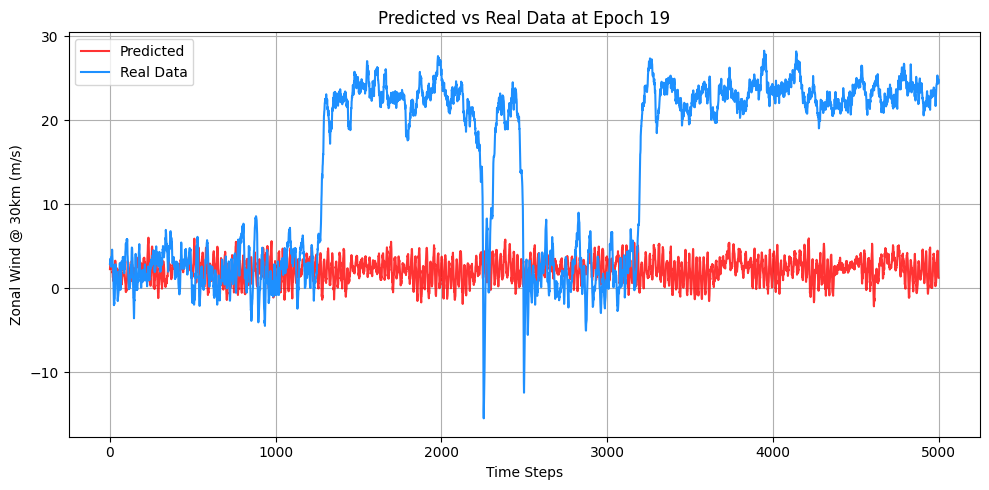

Epoch 21, 
          Reconstrunction Loss: 38.92864227294922,
          KL Divergence Loss: 1.1355431079864502
Validation Batch 49, 
        Reconstrunction Loss: 2000.61767578125,
        KL Divergence Loss: 13.889678955078125


Mini Inference at Epoch 20: 100%|██████████| 5000/5000 [00:01<00:00, 2653.07it/s]


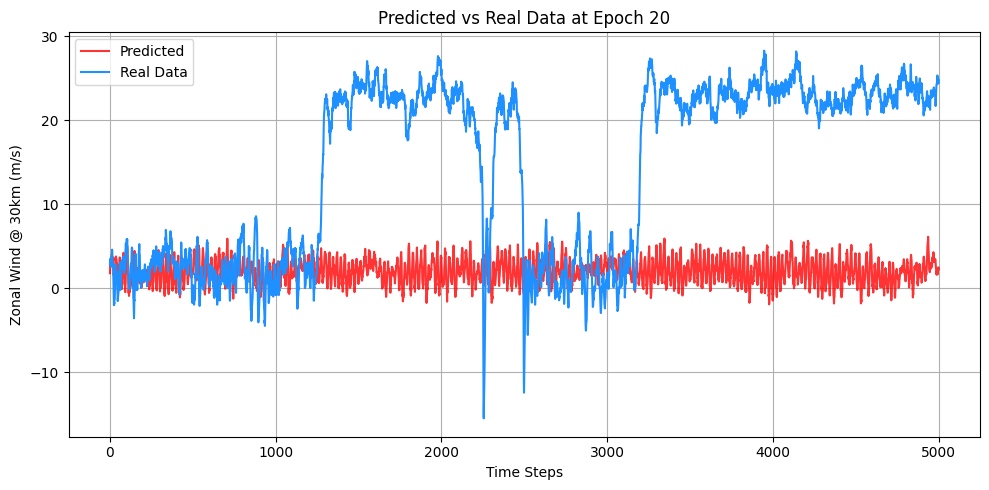

Epoch 22, 
          Reconstrunction Loss: 39.18076705932617,
          KL Divergence Loss: 1.033538818359375
Validation Batch 49, 
        Reconstrunction Loss: 1976.6239013671875,
        KL Divergence Loss: 13.118555068969727


Mini Inference at Epoch 21: 100%|██████████| 5000/5000 [00:02<00:00, 2480.44it/s]


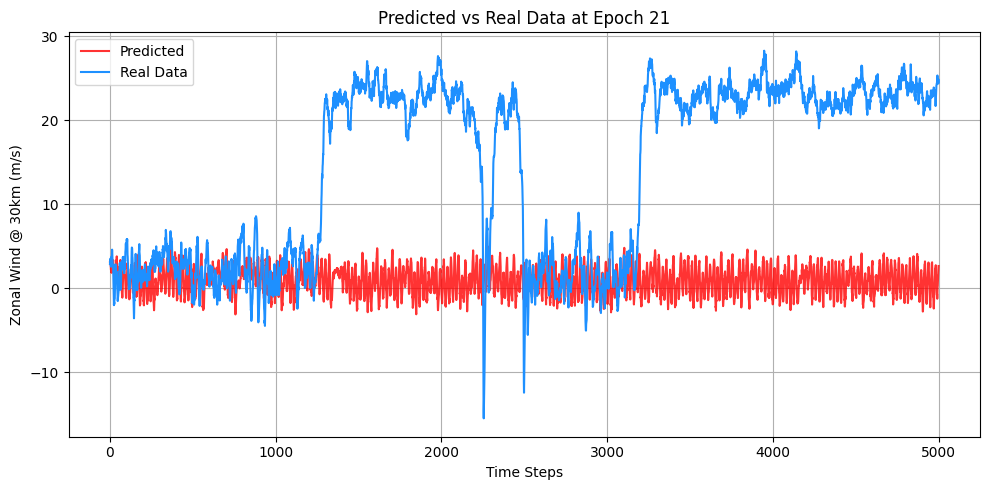

Epoch 23, 
          Reconstrunction Loss: 39.09663009643555,
          KL Divergence Loss: 0.9542436599731445
Validation Batch 49, 
        Reconstrunction Loss: 1971.4296875,
        KL Divergence Loss: 12.402714729309082


Mini Inference at Epoch 22: 100%|██████████| 5000/5000 [00:01<00:00, 2614.96it/s]


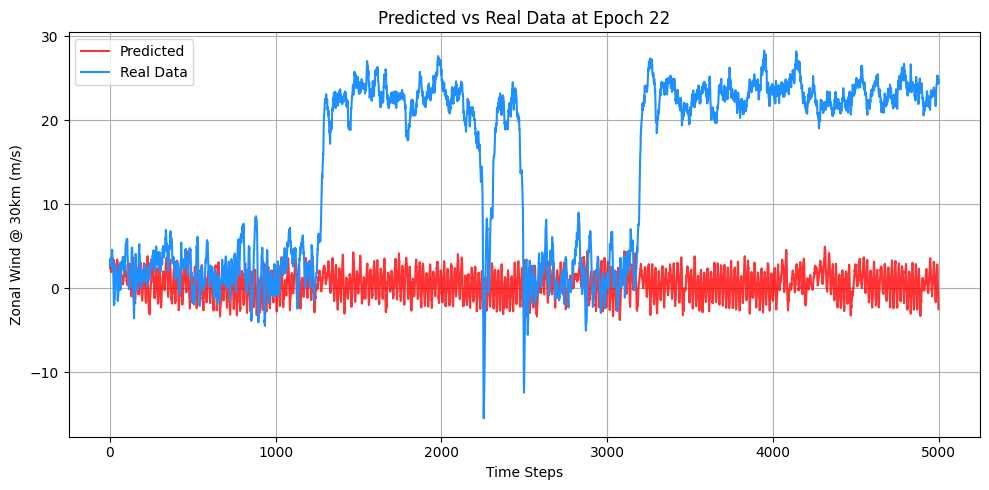

Epoch 24, 
          Reconstrunction Loss: 38.586639404296875,
          KL Divergence Loss: 0.6553424000740051
Validation Batch 49, 
        Reconstrunction Loss: 1998.580322265625,
        KL Divergence Loss: 8.142354965209961


Mini Inference at Epoch 23: 100%|██████████| 5000/5000 [00:01<00:00, 2693.89it/s]


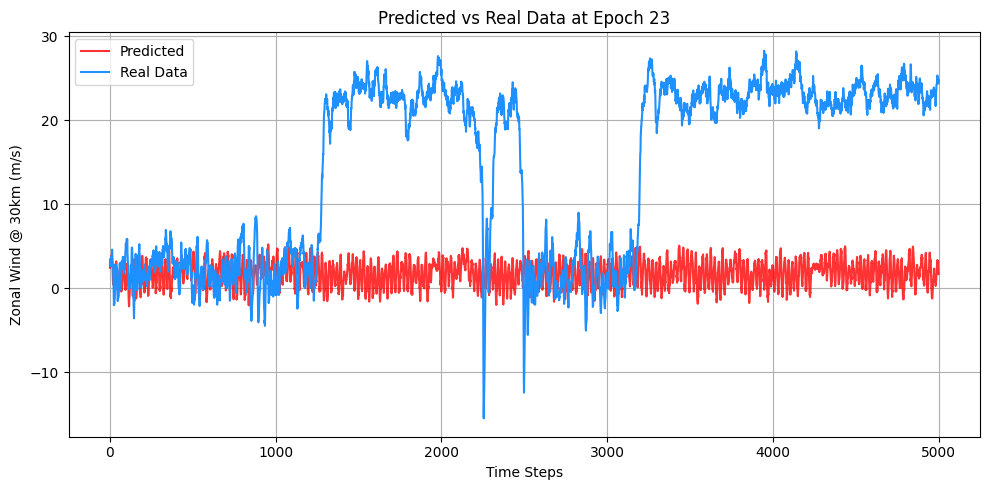

Epoch 25, 
          Reconstrunction Loss: 37.0703125,
          KL Divergence Loss: 0.6466269493103027
Validation Batch 49, 
        Reconstrunction Loss: 2026.3843994140625,
        KL Divergence Loss: 8.719364166259766


Mini Inference at Epoch 24: 100%|██████████| 5000/5000 [00:01<00:00, 2721.66it/s]


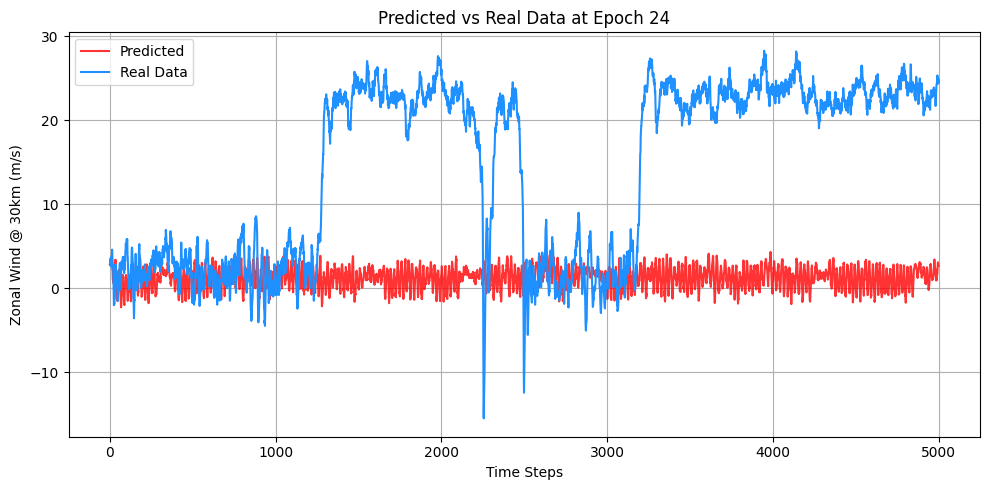

Epoch 26, 
          Reconstrunction Loss: 37.21036148071289,
          KL Divergence Loss: 0.5226368308067322
Validation Batch 49, 
        Reconstrunction Loss: 2008.47802734375,
        KL Divergence Loss: 7.476967811584473


Mini Inference at Epoch 25: 100%|██████████| 5000/5000 [00:01<00:00, 2660.30it/s]


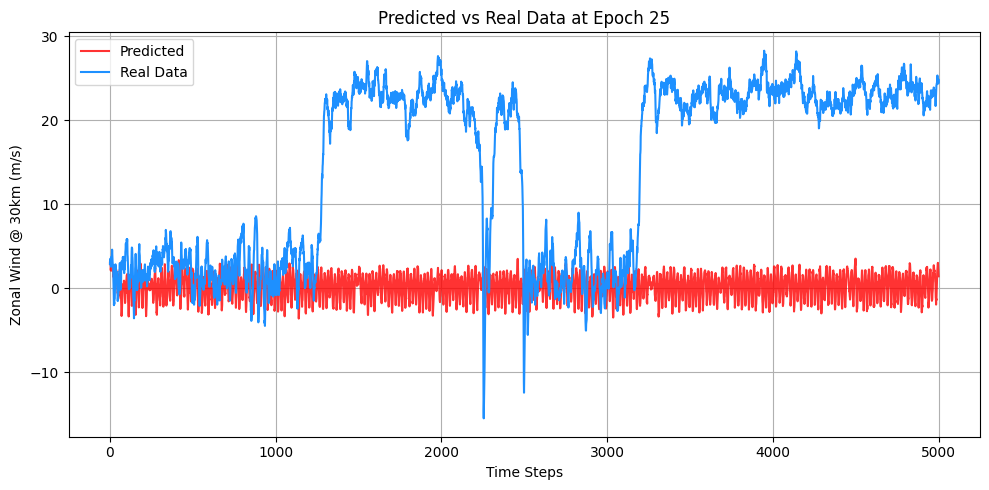

Epoch 27, 
          Reconstrunction Loss: 37.31241989135742,
          KL Divergence Loss: 0.5915263891220093
Validation Batch 49, 
        Reconstrunction Loss: 2044.50830078125,
        KL Divergence Loss: 8.475154876708984


Mini Inference at Epoch 26: 100%|██████████| 5000/5000 [00:01<00:00, 2607.20it/s]


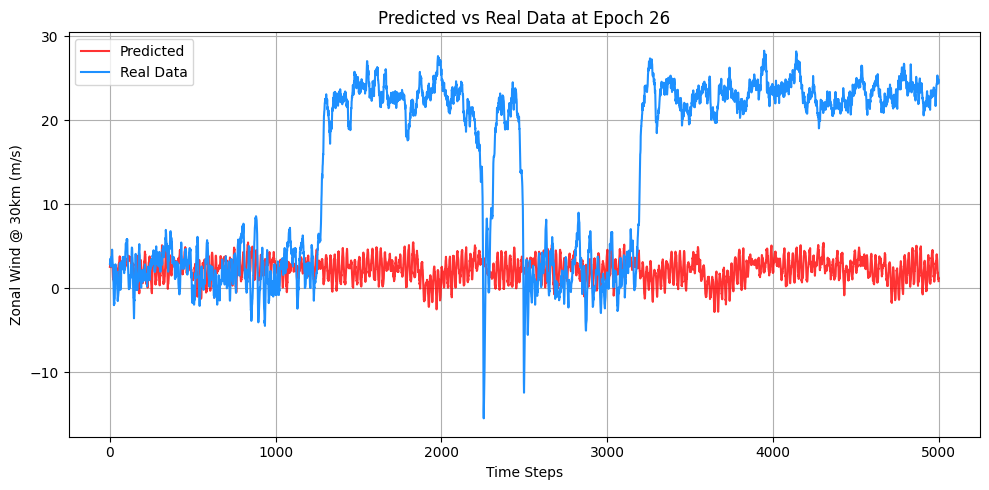

Epoch 28, 
          Reconstrunction Loss: 36.36723327636719,
          KL Divergence Loss: 0.4874953031539917
Validation Batch 49, 
        Reconstrunction Loss: 2017.3531494140625,
        KL Divergence Loss: 6.317940711975098


Mini Inference at Epoch 27: 100%|██████████| 5000/5000 [00:02<00:00, 2491.53it/s]


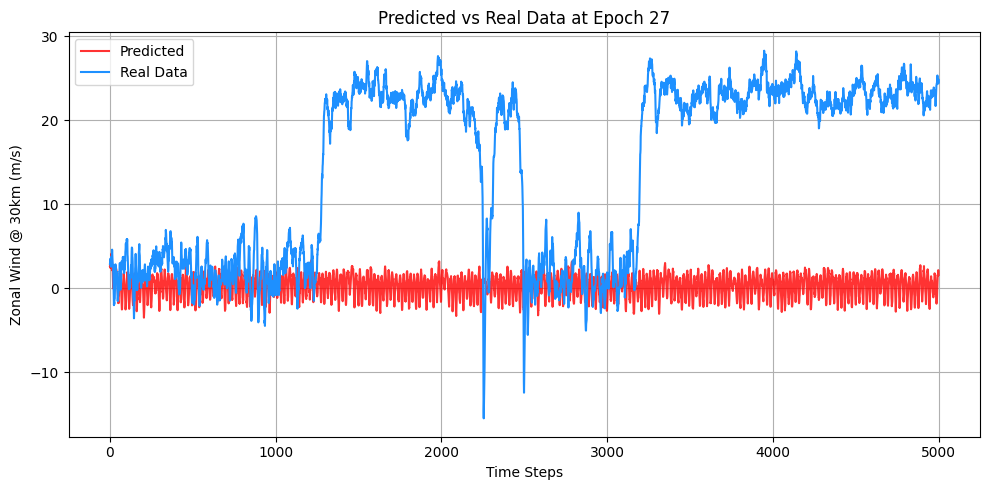

Epoch 29, 
          Reconstrunction Loss: 35.991607666015625,
          KL Divergence Loss: 0.4051561951637268
Validation Batch 49, 
        Reconstrunction Loss: 2020.449462890625,
        KL Divergence Loss: 5.452862739562988


Mini Inference at Epoch 28: 100%|██████████| 5000/5000 [00:02<00:00, 2426.25it/s]


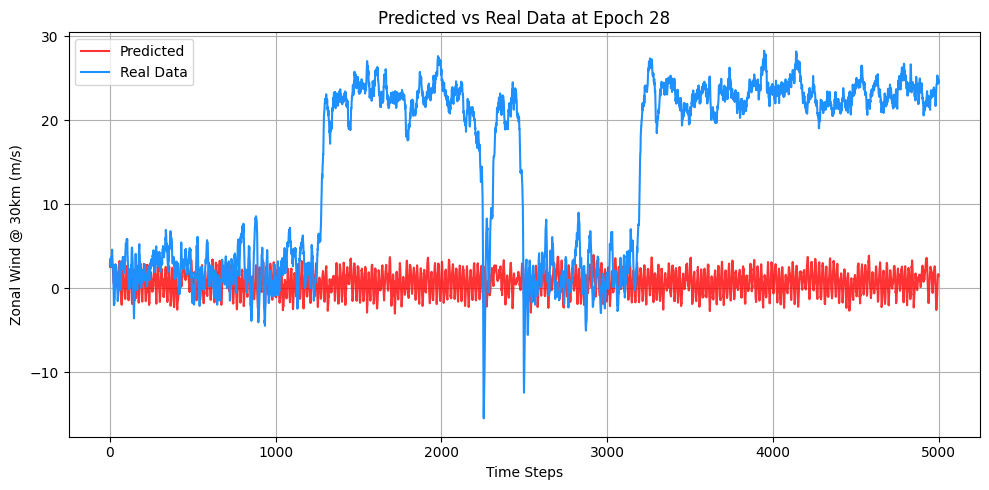

Epoch 30, 
          Reconstrunction Loss: 33.60918045043945,
          KL Divergence Loss: 0.4441610872745514
Validation Batch 49, 
        Reconstrunction Loss: 2018.40869140625,
        KL Divergence Loss: 6.007593154907227


Mini Inference at Epoch 29: 100%|██████████| 5000/5000 [00:03<00:00, 1407.91it/s]


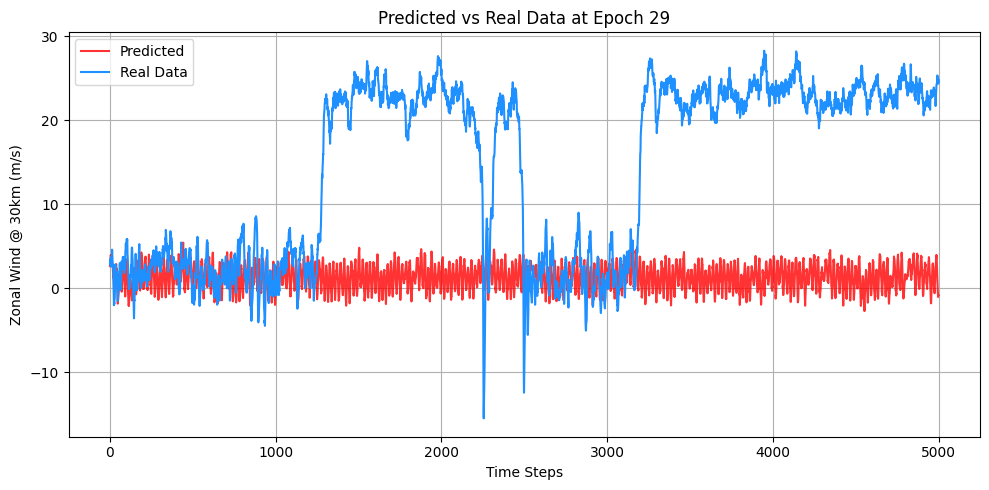

Epoch 31, 
          Reconstrunction Loss: 34.69682312011719,
          KL Divergence Loss: 0.32548579573631287
Validation Batch 49, 
        Reconstrunction Loss: 1974.017578125,
        KL Divergence Loss: 4.311965465545654


Mini Inference at Epoch 30: 100%|██████████| 5000/5000 [00:03<00:00, 1388.10it/s]


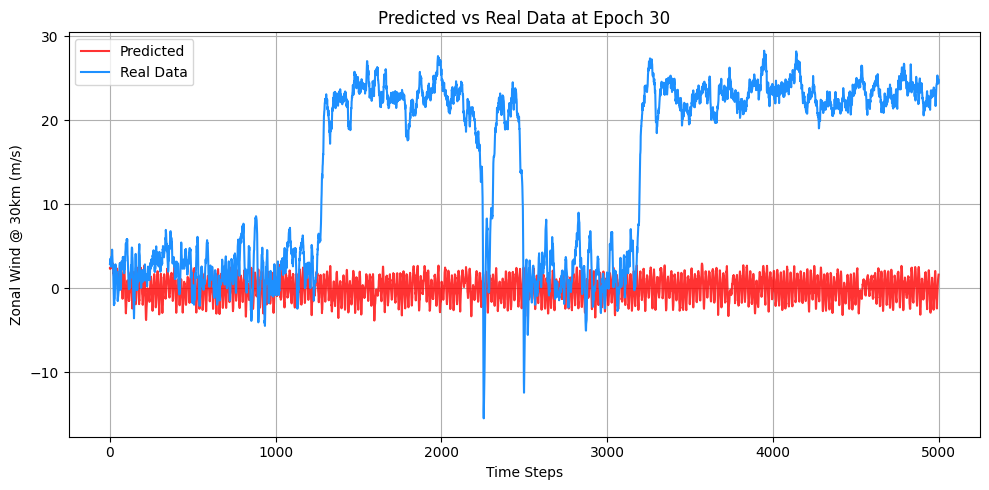

Epoch 32, 
          Reconstrunction Loss: 33.54020690917969,
          KL Divergence Loss: 0.49954718351364136
Validation Batch 49, 
        Reconstrunction Loss: 2038.613525390625,
        KL Divergence Loss: 7.922141075134277


Mini Inference at Epoch 31: 100%|██████████| 5000/5000 [00:03<00:00, 1524.15it/s]


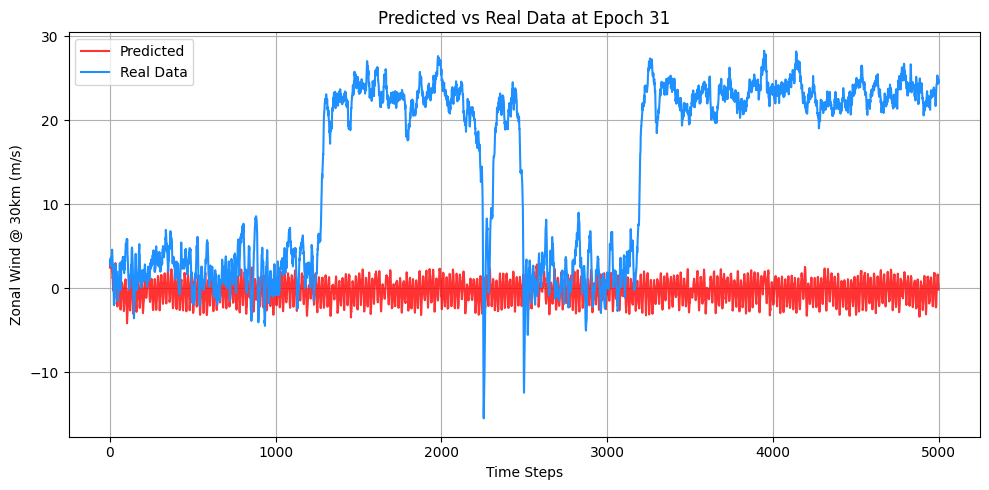

Epoch 33, 
          Reconstrunction Loss: 33.99646759033203,
          KL Divergence Loss: 0.24961748719215393
Validation Batch 49, 
        Reconstrunction Loss: 2069.9912109375,
        KL Divergence Loss: 3.167773485183716


Mini Inference at Epoch 32: 100%|██████████| 5000/5000 [00:03<00:00, 1387.17it/s]


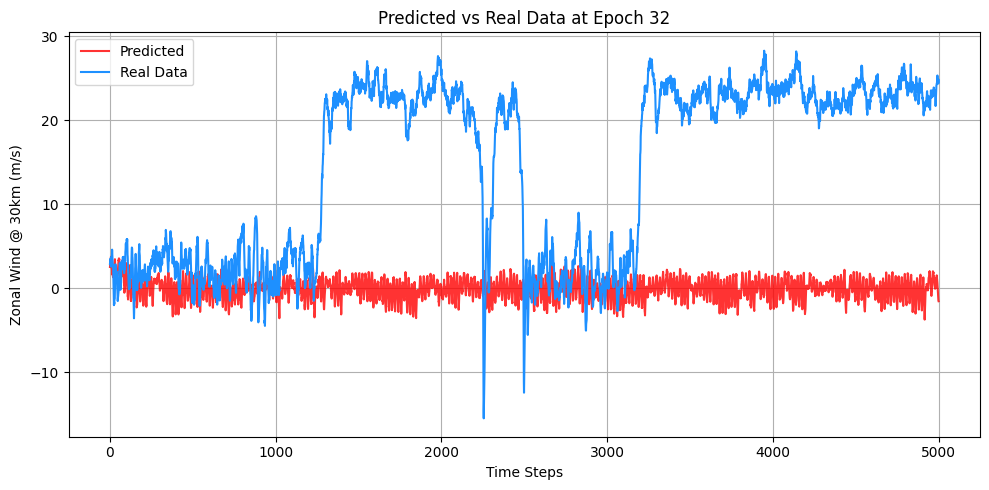

Epoch 34, 
          Reconstrunction Loss: 32.61376190185547,
          KL Divergence Loss: 0.2872943878173828
Validation Batch 49, 
        Reconstrunction Loss: 2058.87451171875,
        KL Divergence Loss: 3.741685152053833


Mini Inference at Epoch 33: 100%|██████████| 5000/5000 [00:03<00:00, 1448.53it/s]


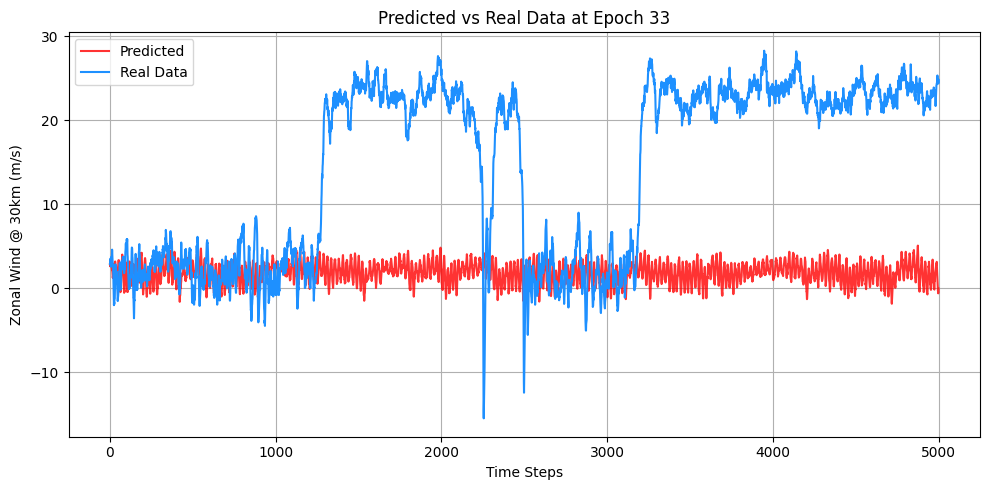

Epoch 35, 
          Reconstrunction Loss: 33.44691467285156,
          KL Divergence Loss: 0.2600969672203064
Validation Batch 49, 
        Reconstrunction Loss: 2023.052490234375,
        KL Divergence Loss: 3.44449520111084


Mini Inference at Epoch 34: 100%|██████████| 5000/5000 [00:03<00:00, 1381.32it/s]


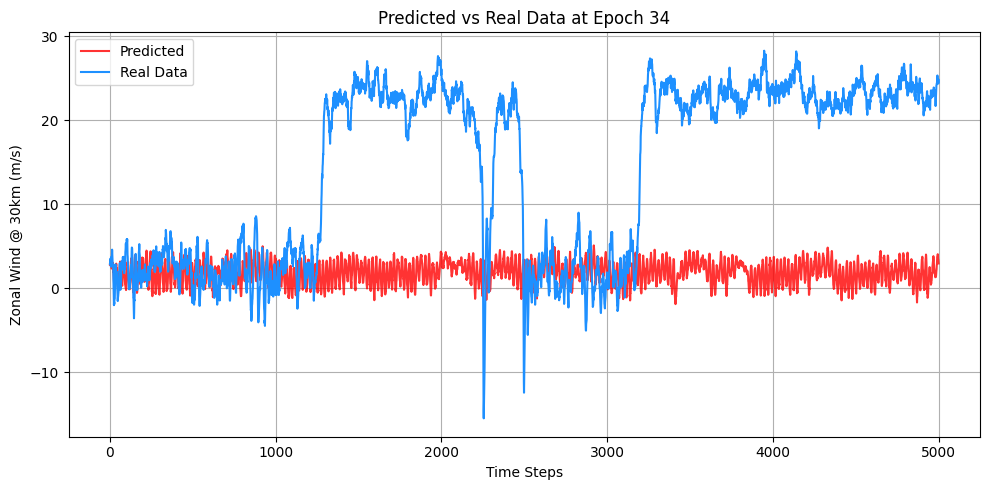

Epoch 36, 
          Reconstrunction Loss: 33.77986145019531,
          KL Divergence Loss: 0.2645317614078522
Validation Batch 49, 
        Reconstrunction Loss: 2033.4464111328125,
        KL Divergence Loss: 3.299654006958008


Mini Inference at Epoch 35: 100%|██████████| 5000/5000 [00:03<00:00, 1387.51it/s]


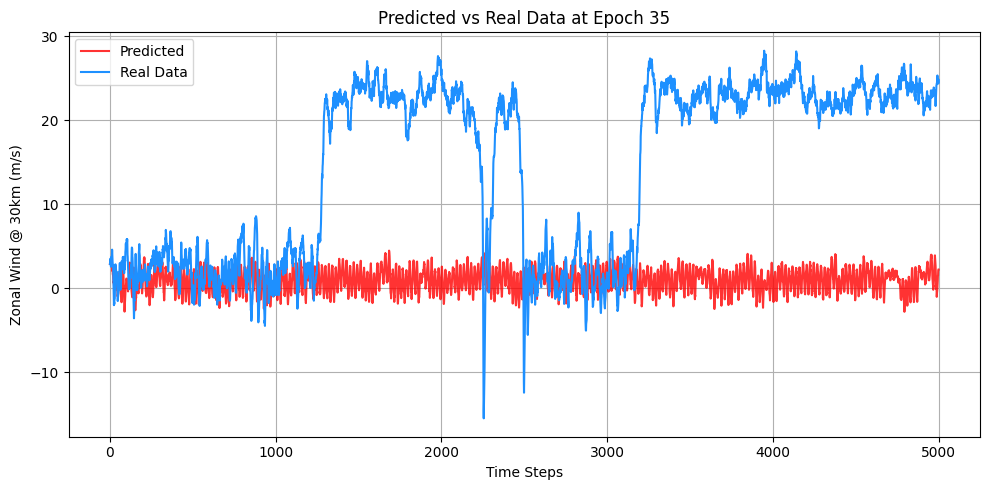

Epoch 37, 
          Reconstrunction Loss: 33.847930908203125,
          KL Divergence Loss: 0.3191223740577698
Validation Batch 49, 
        Reconstrunction Loss: 2049.51318359375,
        KL Divergence Loss: 4.918219566345215


Mini Inference at Epoch 36: 100%|██████████| 5000/5000 [00:03<00:00, 1388.62it/s]


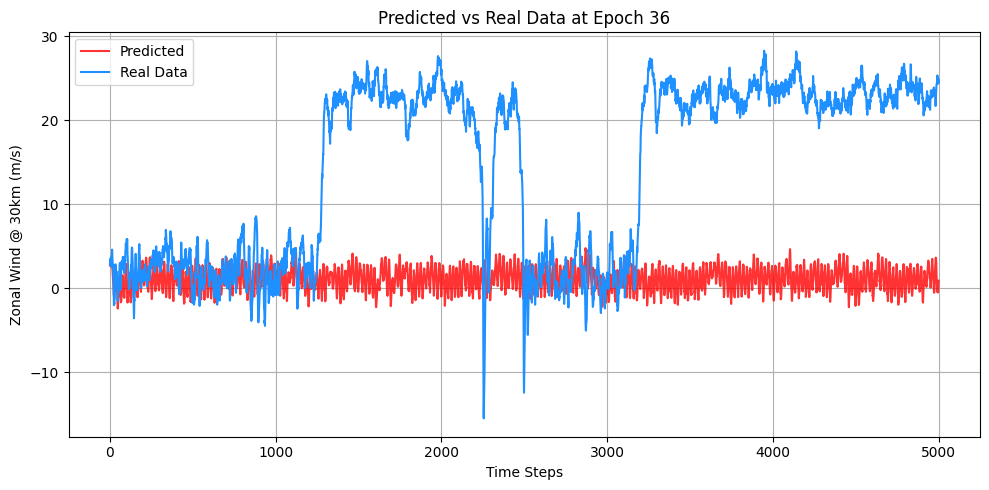

Epoch 38, 
          Reconstrunction Loss: 31.933074951171875,
          KL Divergence Loss: 0.2579282522201538
Validation Batch 49, 
        Reconstrunction Loss: 2032.11181640625,
        KL Divergence Loss: 3.4211697578430176


Mini Inference at Epoch 37: 100%|██████████| 5000/5000 [00:03<00:00, 1373.90it/s]


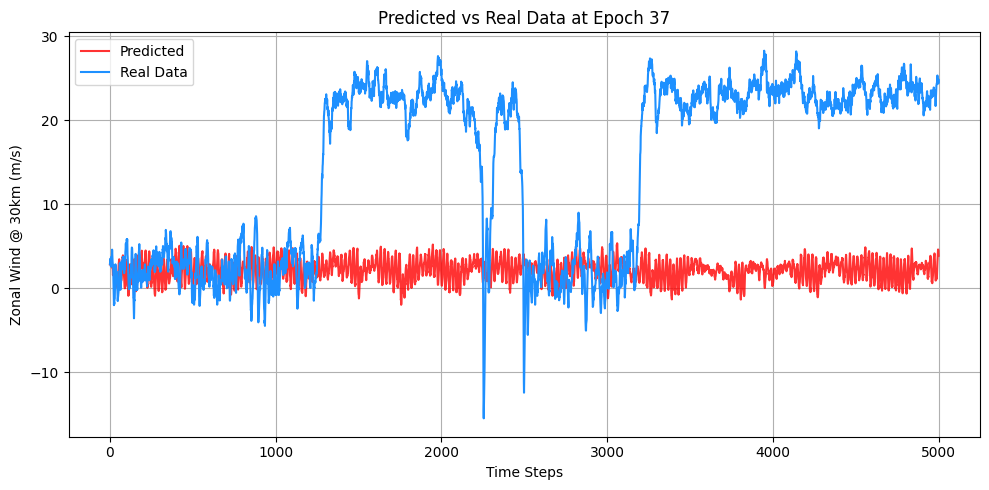

Epoch 39, 
          Reconstrunction Loss: 32.2575569152832,
          KL Divergence Loss: 0.3253059983253479
Validation Batch 49, 
        Reconstrunction Loss: 2029.3575439453125,
        KL Divergence Loss: 4.432681560516357


Mini Inference at Epoch 38: 100%|██████████| 5000/5000 [00:03<00:00, 1399.40it/s]


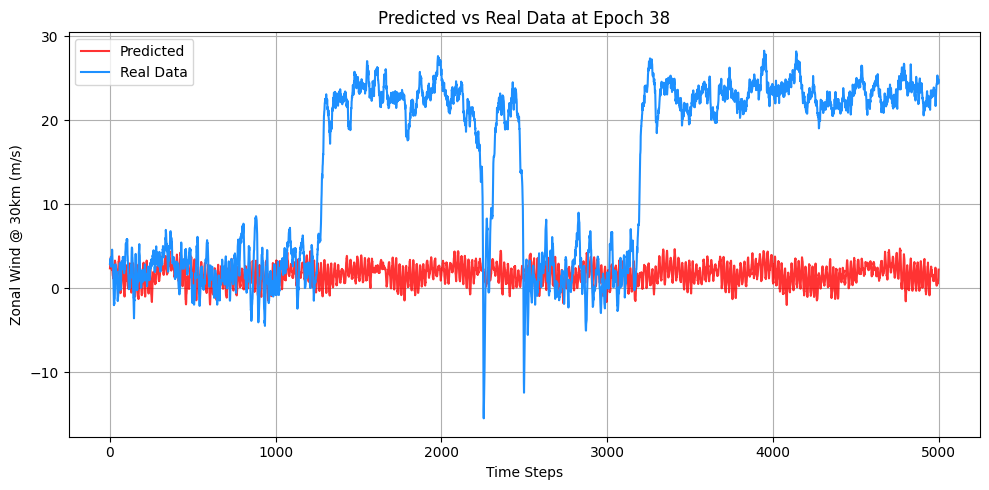

Epoch 40, 
          Reconstrunction Loss: 32.311370849609375,
          KL Divergence Loss: 0.19992564618587494
Validation Batch 49, 
        Reconstrunction Loss: 2011.39501953125,
        KL Divergence Loss: 2.66548228263855


Mini Inference at Epoch 39: 100%|██████████| 5000/5000 [00:03<00:00, 1335.52it/s]


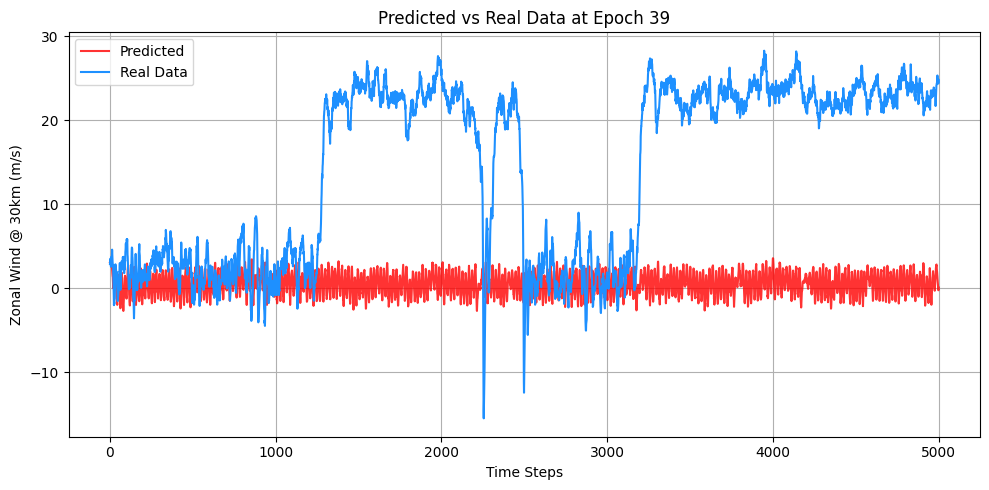

Epoch 41, 
          Reconstrunction Loss: 30.54106903076172,
          KL Divergence Loss: 0.24210713803768158
Validation Batch 49, 
        Reconstrunction Loss: 2021.3155517578125,
        KL Divergence Loss: 3.399275302886963


Mini Inference at Epoch 40: 100%|██████████| 5000/5000 [00:03<00:00, 1400.66it/s]


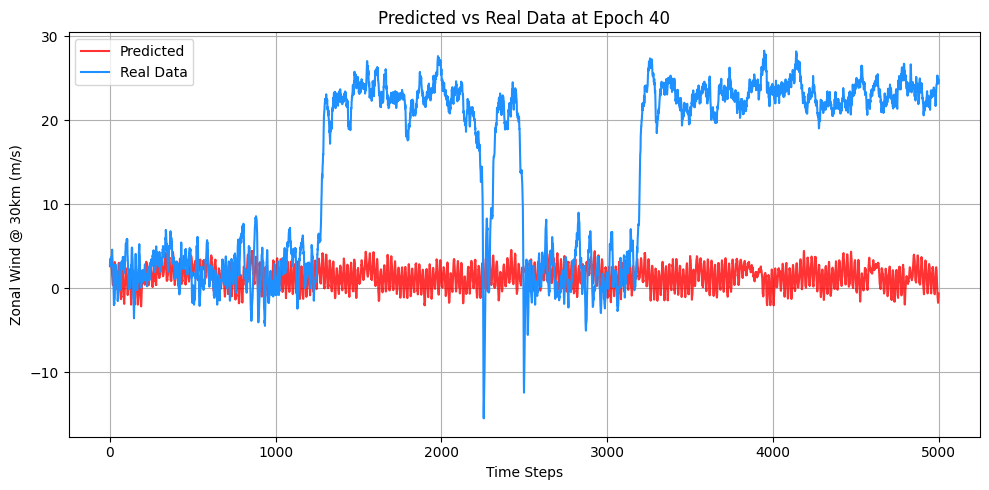

Epoch 42, 
          Reconstrunction Loss: 31.093120574951172,
          KL Divergence Loss: 0.21170449256896973
Validation Batch 49, 
        Reconstrunction Loss: 2058.72509765625,
        KL Divergence Loss: 2.5957531929016113


Mini Inference at Epoch 41: 100%|██████████| 5000/5000 [00:03<00:00, 1341.21it/s]


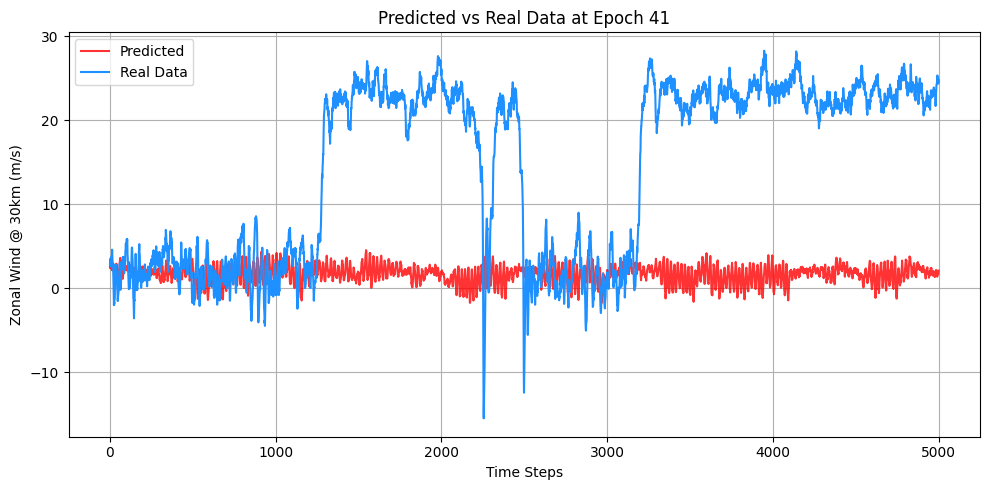

Epoch 43, 
          Reconstrunction Loss: 31.004985809326172,
          KL Divergence Loss: 0.23924890160560608
Validation Batch 49, 
        Reconstrunction Loss: 2035.56884765625,
        KL Divergence Loss: 3.399444580078125


Mini Inference at Epoch 42: 100%|██████████| 5000/5000 [00:03<00:00, 1473.47it/s]


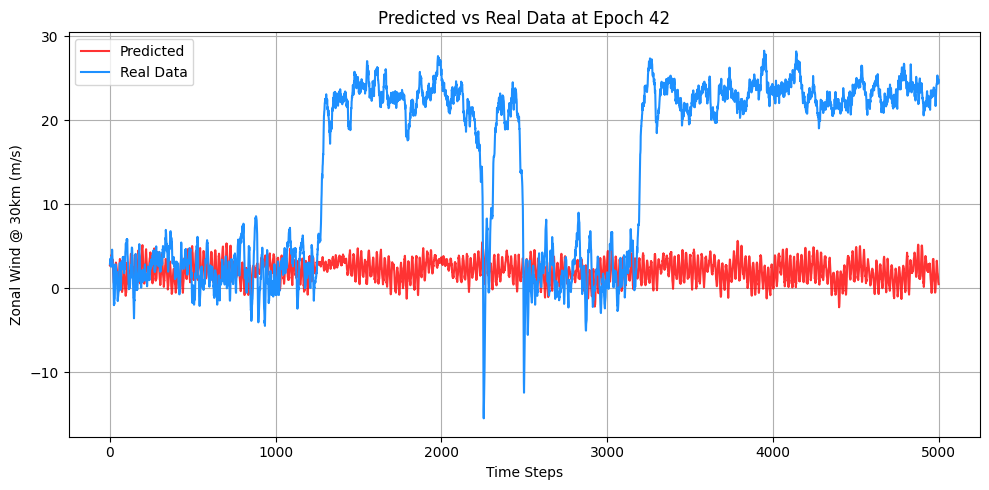

Epoch 44, 
          Reconstrunction Loss: 30.71381378173828,
          KL Divergence Loss: 0.21811433136463165
Validation Batch 49, 
        Reconstrunction Loss: 1996.3369140625,
        KL Divergence Loss: 2.7644155025482178


Mini Inference at Epoch 43: 100%|██████████| 5000/5000 [00:03<00:00, 1374.87it/s]


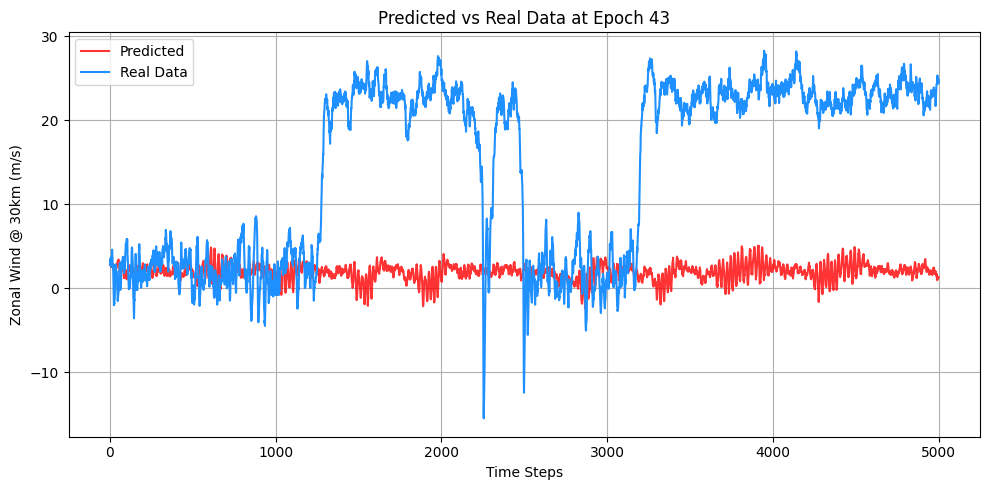

Epoch 45, 
          Reconstrunction Loss: 30.869873046875,
          KL Divergence Loss: 0.18976376950740814
Validation Batch 49, 
        Reconstrunction Loss: 1997.4375,
        KL Divergence Loss: 2.5269603729248047


Mini Inference at Epoch 44: 100%|██████████| 5000/5000 [00:03<00:00, 1485.74it/s]


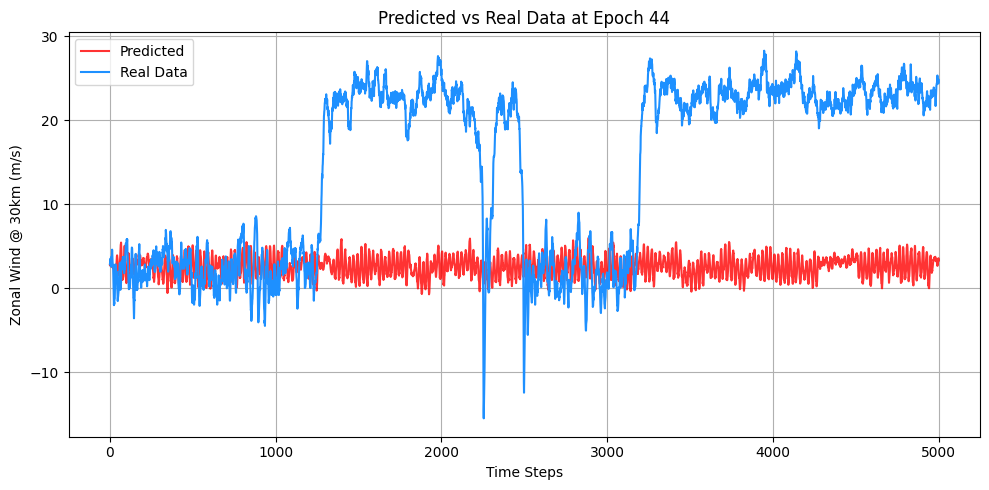

Epoch 46, 
          Reconstrunction Loss: 31.673294067382812,
          KL Divergence Loss: 0.1915767788887024
Validation Batch 49, 
        Reconstrunction Loss: 2048.891845703125,
        KL Divergence Loss: 2.347402572631836


Mini Inference at Epoch 45: 100%|██████████| 5000/5000 [00:03<00:00, 1309.25it/s]


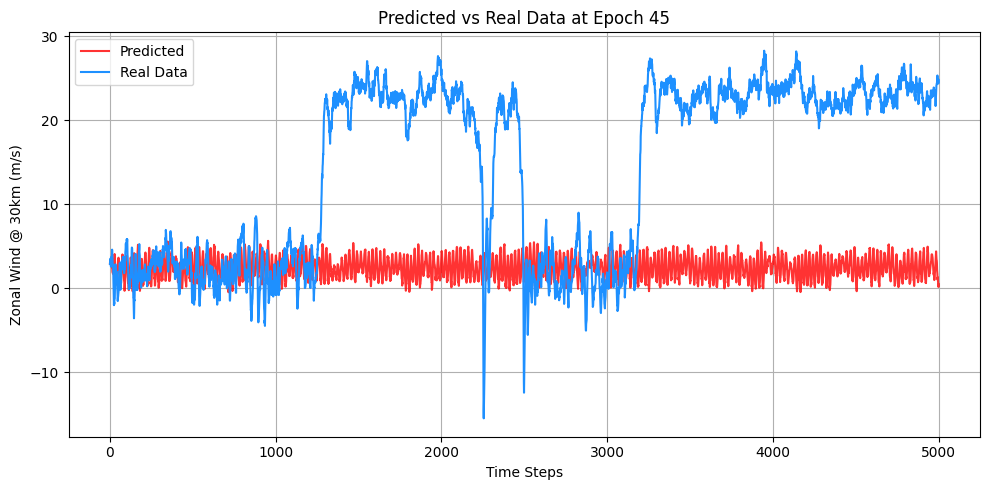

Epoch 47, 
          Reconstrunction Loss: 29.002805709838867,
          KL Divergence Loss: 0.2100212275981903
Validation Batch 49, 
        Reconstrunction Loss: 2055.7451171875,
        KL Divergence Loss: 2.6765553951263428


Mini Inference at Epoch 46: 100%|██████████| 5000/5000 [00:03<00:00, 1370.73it/s]


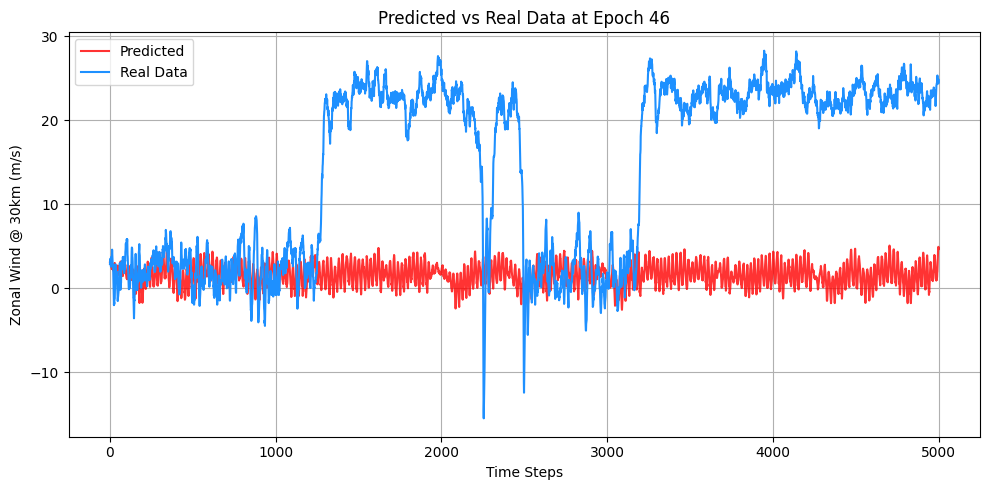

Epoch 48, 
          Reconstrunction Loss: 30.41908073425293,
          KL Divergence Loss: 0.1891411989927292
Validation Batch 49, 
        Reconstrunction Loss: 2059.49462890625,
        KL Divergence Loss: 2.5270986557006836


Mini Inference at Epoch 47: 100%|██████████| 5000/5000 [00:03<00:00, 1361.59it/s]


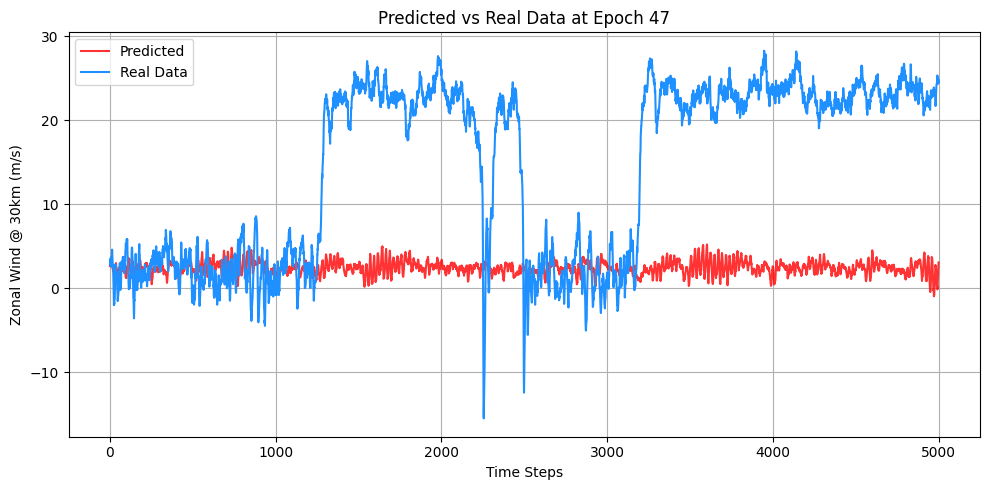

Epoch 49, 
          Reconstrunction Loss: 30.89401626586914,
          KL Divergence Loss: 0.13510292768478394
Validation Batch 49, 
        Reconstrunction Loss: 2075.1796875,
        KL Divergence Loss: 1.8485698699951172


Mini Inference at Epoch 48: 100%|██████████| 5000/5000 [00:03<00:00, 1323.29it/s]


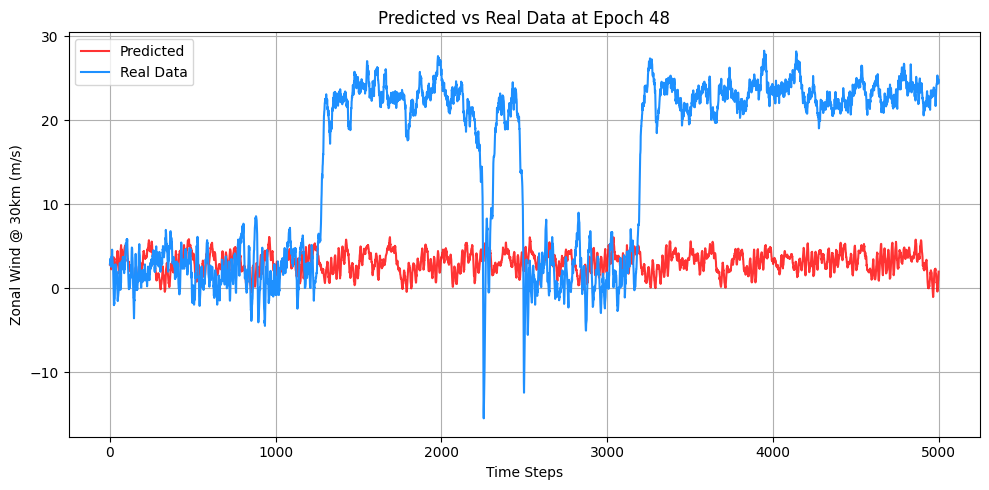

Epoch 50, 
          Reconstrunction Loss: 29.76742172241211,
          KL Divergence Loss: 0.21303880214691162
Validation Batch 49, 
        Reconstrunction Loss: 2053.904541015625,
        KL Divergence Loss: 3.8986778259277344


Mini Inference at Epoch 49: 100%|██████████| 5000/5000 [00:03<00:00, 1334.41it/s]


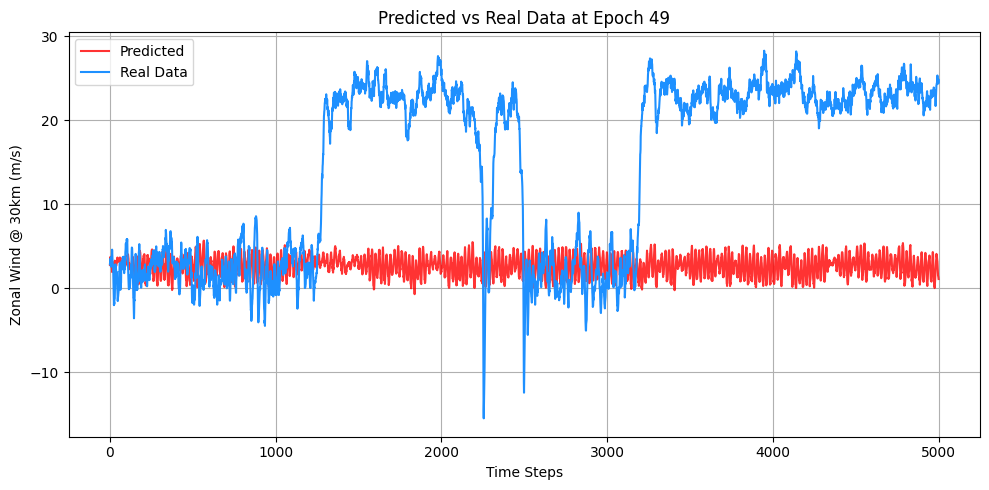

Epoch 51, 
          Reconstrunction Loss: 29.12281036376953,
          KL Divergence Loss: 0.17852455377578735
Validation Batch 49, 
        Reconstrunction Loss: 2017.895751953125,
        KL Divergence Loss: 2.302190065383911


Mini Inference at Epoch 50: 100%|██████████| 5000/5000 [00:03<00:00, 1349.56it/s]


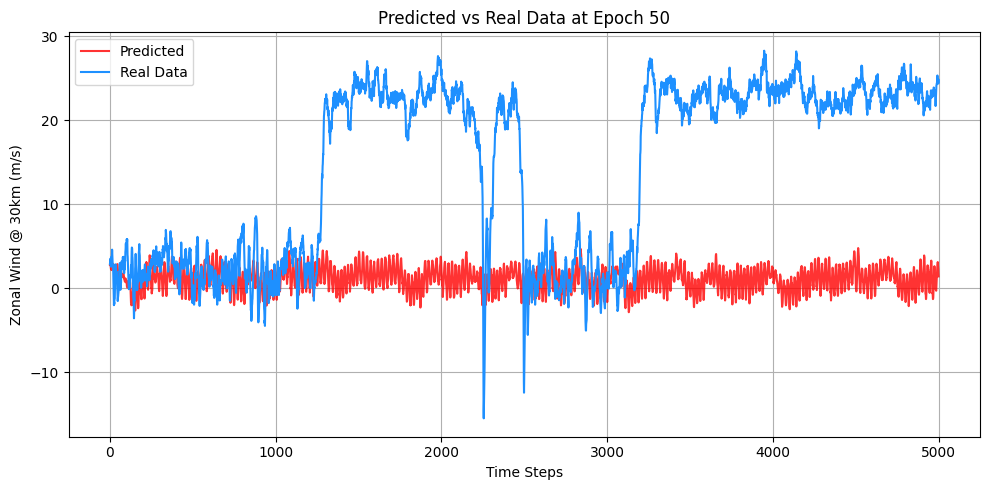

Epoch 52, 
          Reconstrunction Loss: 30.10992431640625,
          KL Divergence Loss: 0.1793694645166397
Validation Batch 49, 
        Reconstrunction Loss: 2009.686767578125,
        KL Divergence Loss: 2.6224334239959717


Mini Inference at Epoch 51: 100%|██████████| 5000/5000 [00:03<00:00, 1315.94it/s]


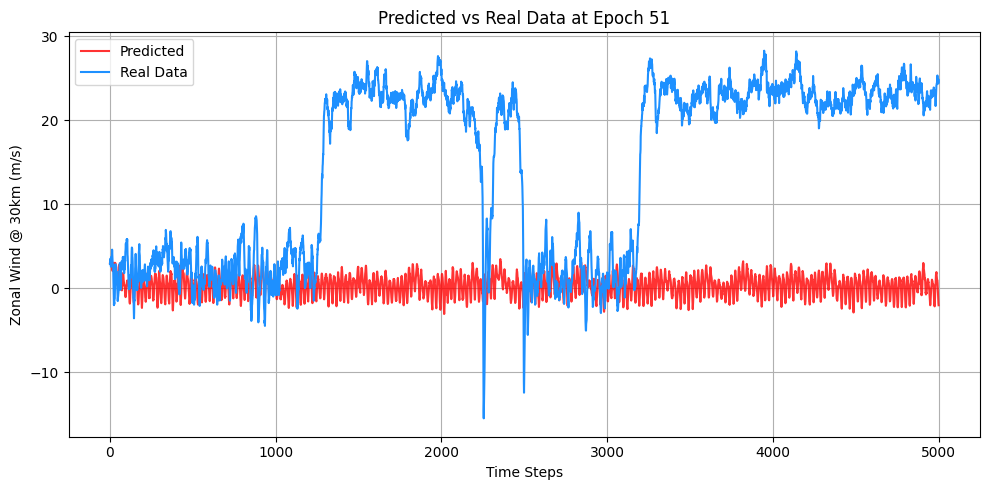

Epoch 53, 
          Reconstrunction Loss: 29.238237380981445,
          KL Divergence Loss: 0.16699060797691345
Validation Batch 49, 
        Reconstrunction Loss: 2025.338623046875,
        KL Divergence Loss: 2.694342613220215


Mini Inference at Epoch 52: 100%|██████████| 5000/5000 [00:03<00:00, 1301.86it/s]


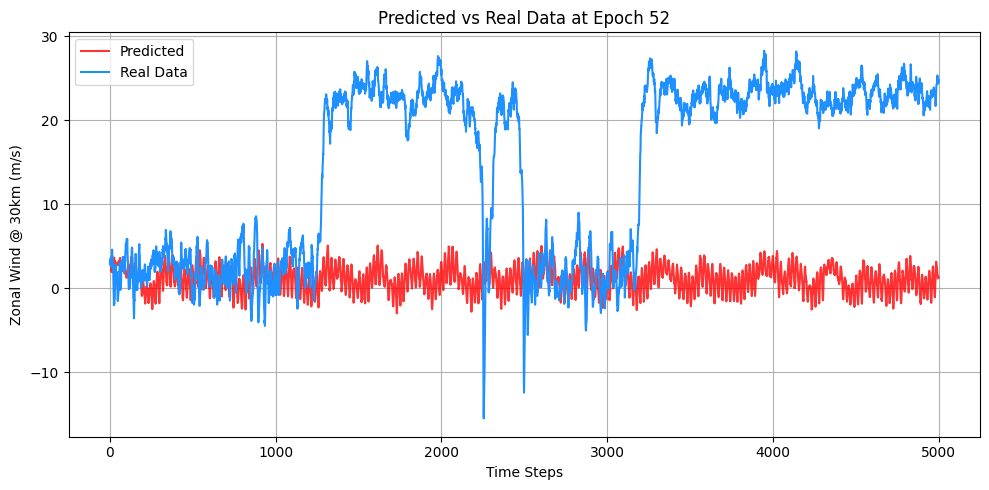

Epoch 54, 
          Reconstrunction Loss: 29.708707809448242,
          KL Divergence Loss: 0.1620628535747528
Validation Batch 49, 
        Reconstrunction Loss: 1995.5400390625,
        KL Divergence Loss: 2.0023303031921387


Mini Inference at Epoch 53: 100%|██████████| 5000/5000 [00:03<00:00, 1359.27it/s]


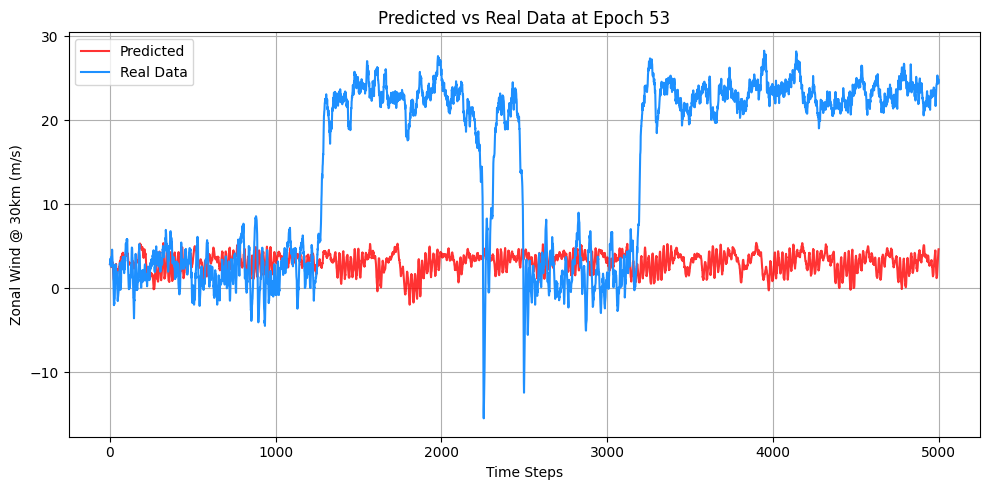

Epoch 55, 
          Reconstrunction Loss: 29.648605346679688,
          KL Divergence Loss: 0.14804133772850037
Validation Batch 49, 
        Reconstrunction Loss: 2054.672119140625,
        KL Divergence Loss: 1.781834363937378


Mini Inference at Epoch 54: 100%|██████████| 5000/5000 [00:03<00:00, 1353.84it/s]


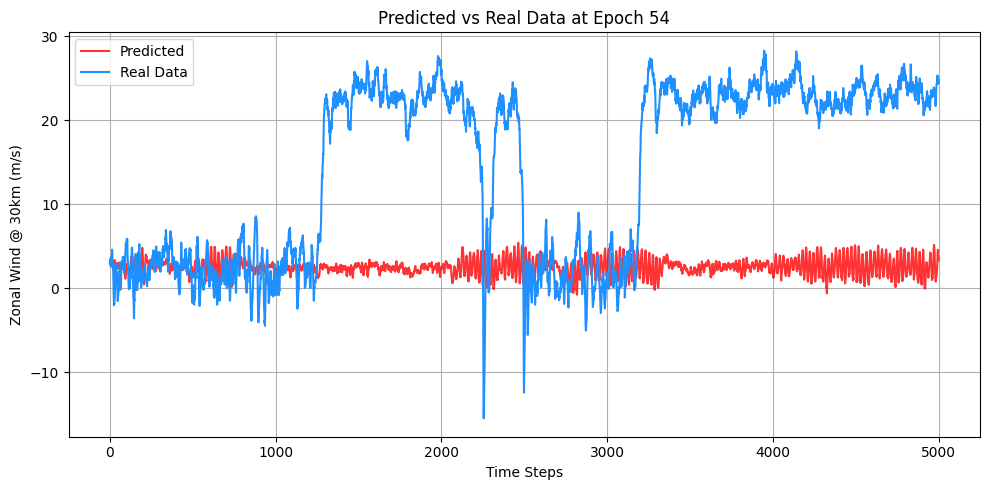

Epoch 56, 
          Reconstrunction Loss: 29.460866928100586,
          KL Divergence Loss: 0.212837815284729
Validation Batch 49, 
        Reconstrunction Loss: 2052.28271484375,
        KL Divergence Loss: 3.1575868129730225


Mini Inference at Epoch 55: 100%|██████████| 5000/5000 [00:03<00:00, 1350.33it/s]


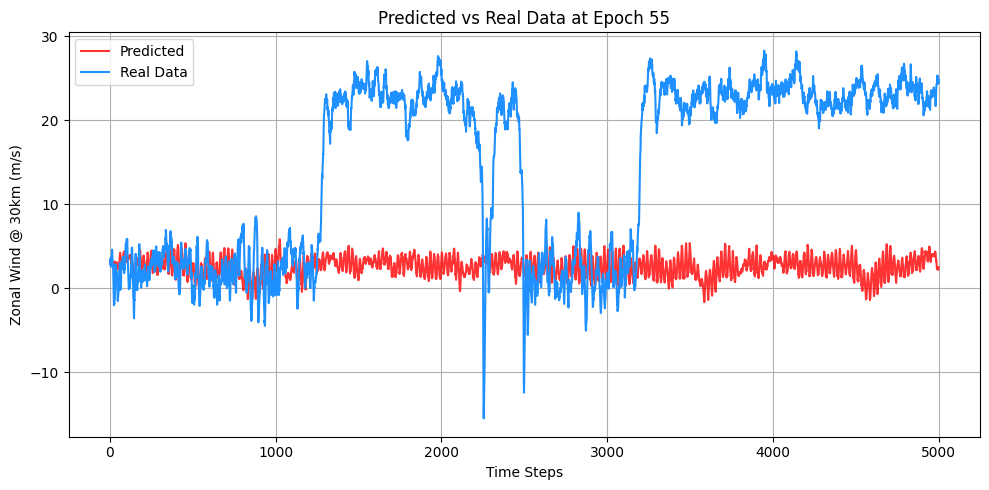

Epoch 57, 
          Reconstrunction Loss: 29.963401794433594,
          KL Divergence Loss: 0.08385483920574188
Validation Batch 49, 
        Reconstrunction Loss: 2031.8160400390625,
        KL Divergence Loss: 0.985630452632904


Mini Inference at Epoch 56: 100%|██████████| 5000/5000 [00:03<00:00, 1350.73it/s]


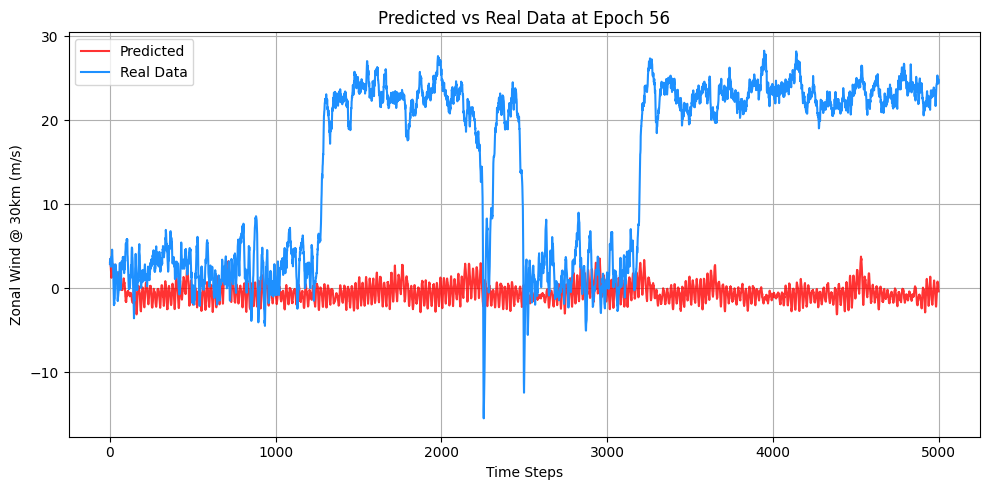

Epoch 58, 
          Reconstrunction Loss: 29.207611083984375,
          KL Divergence Loss: 0.2684876024723053
Validation Batch 49, 
        Reconstrunction Loss: 2068.36376953125,
        KL Divergence Loss: 3.6594107151031494


Mini Inference at Epoch 57: 100%|██████████| 5000/5000 [00:03<00:00, 1402.64it/s]


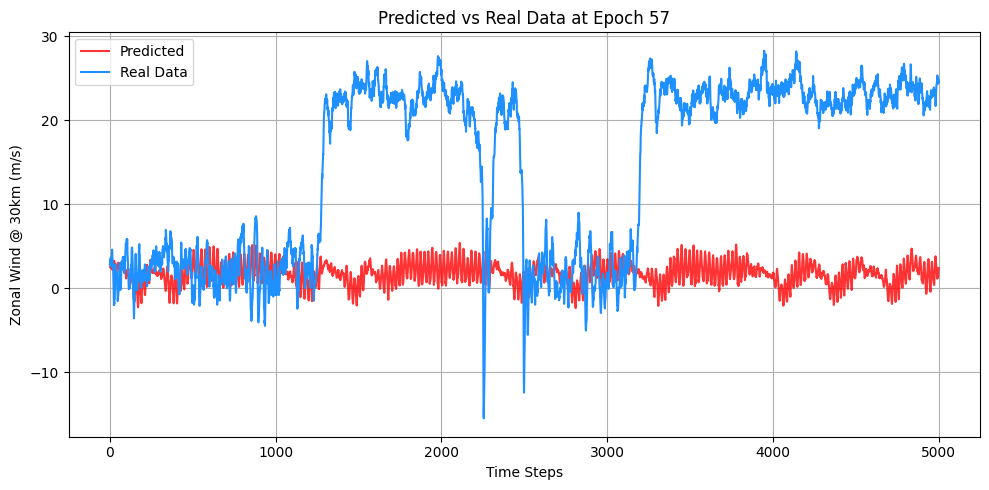

Epoch 59, 
          Reconstrunction Loss: 28.780555725097656,
          KL Divergence Loss: 0.07591994851827621
Validation Batch 49, 
        Reconstrunction Loss: 2014.9306640625,
        KL Divergence Loss: 0.8859401941299438


Mini Inference at Epoch 58: 100%|██████████| 5000/5000 [00:03<00:00, 1358.91it/s]


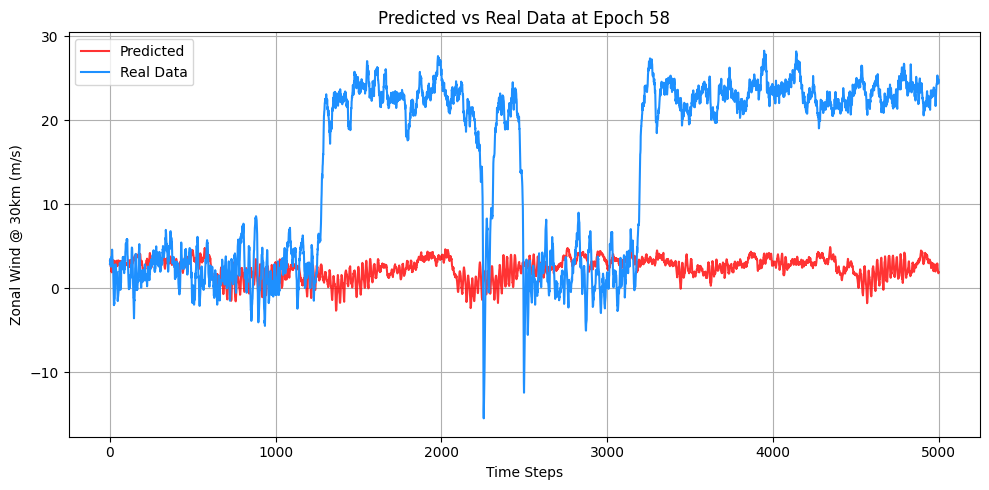

Epoch 60, 
          Reconstrunction Loss: 29.911277770996094,
          KL Divergence Loss: 0.23438027501106262
Validation Batch 49, 
        Reconstrunction Loss: 1973.1351318359375,
        KL Divergence Loss: 3.488445281982422


Mini Inference at Epoch 59: 100%|██████████| 5000/5000 [00:03<00:00, 1446.69it/s]


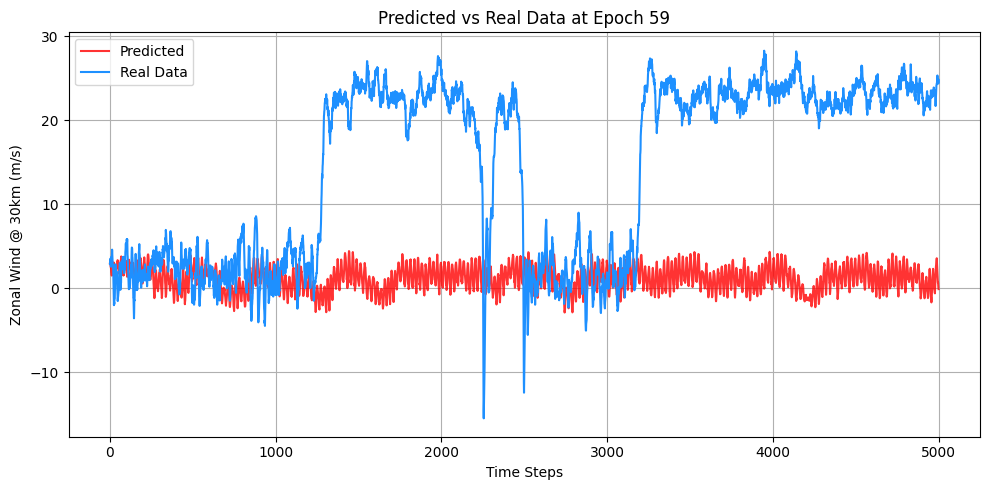

Epoch 61, 
          Reconstrunction Loss: 28.763980865478516,
          KL Divergence Loss: 0.09909962862730026
Validation Batch 49, 
        Reconstrunction Loss: 2067.695556640625,
        KL Divergence Loss: 1.2906142473220825


Mini Inference at Epoch 60: 100%|██████████| 5000/5000 [00:03<00:00, 1332.53it/s]


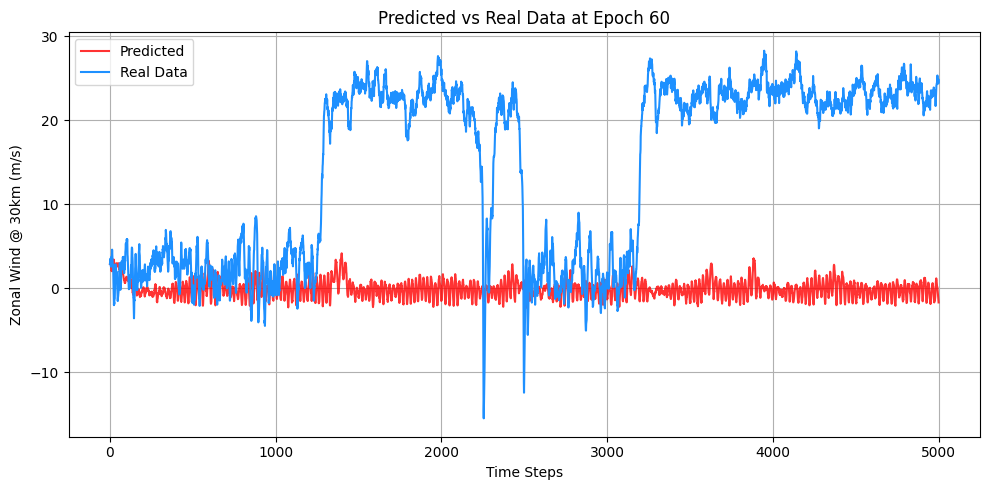

Epoch 62, 
          Reconstrunction Loss: 28.57938575744629,
          KL Divergence Loss: 0.13275043666362762
Validation Batch 49, 
        Reconstrunction Loss: 1976.6209716796875,
        KL Divergence Loss: 2.257356882095337


Mini Inference at Epoch 61: 100%|██████████| 5000/5000 [00:03<00:00, 1477.75it/s]


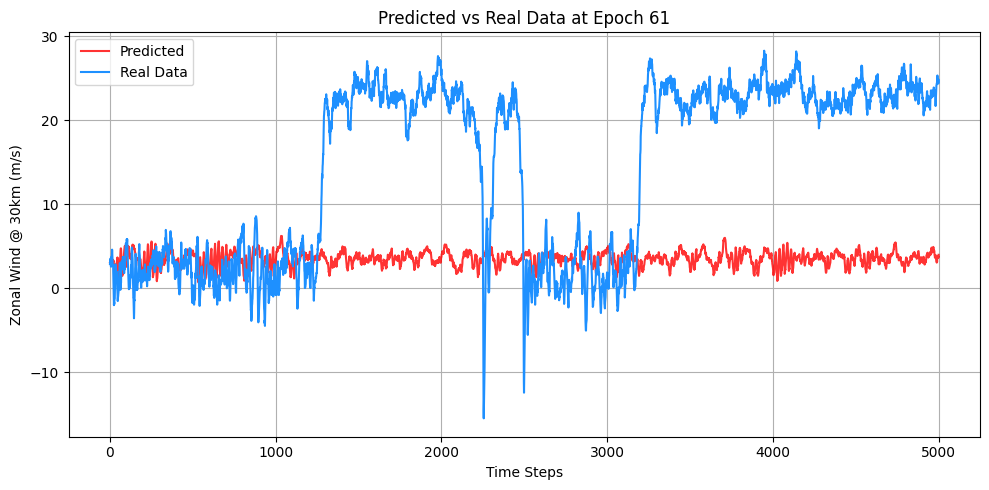

Epoch 63, 
          Reconstrunction Loss: 27.741432189941406,
          KL Divergence Loss: 0.13758957386016846
Validation Batch 49, 
        Reconstrunction Loss: 2037.31689453125,
        KL Divergence Loss: 1.9611831903457642


Mini Inference at Epoch 62: 100%|██████████| 5000/5000 [00:03<00:00, 1331.80it/s]


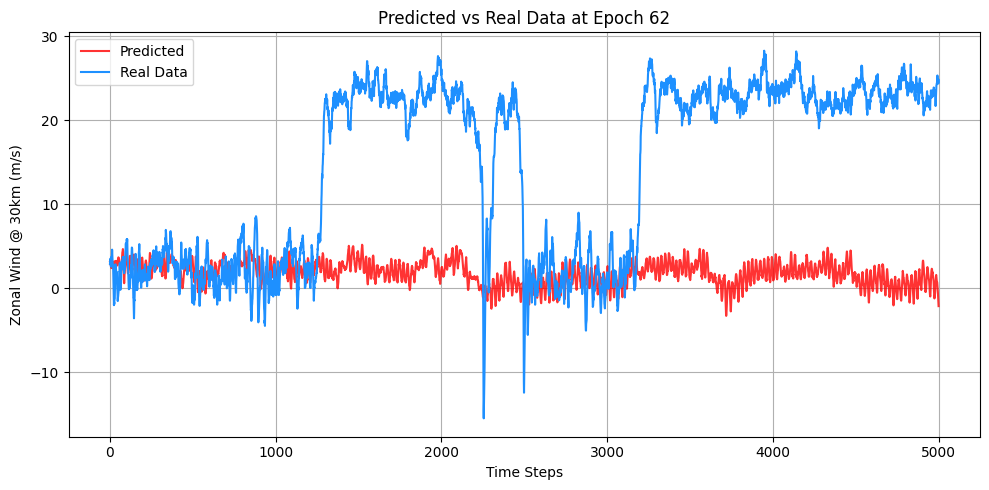

Epoch 64, 
          Reconstrunction Loss: 27.442155838012695,
          KL Divergence Loss: 0.1776641607284546
Validation Batch 49, 
        Reconstrunction Loss: 2022.705810546875,
        KL Divergence Loss: 1.808274269104004


Mini Inference at Epoch 63: 100%|██████████| 5000/5000 [00:03<00:00, 1404.24it/s]


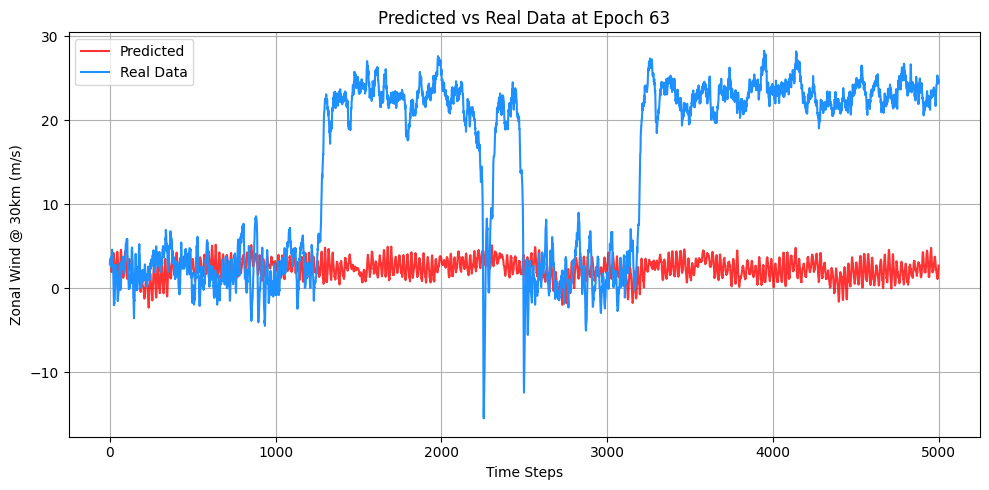

Epoch 65, 
          Reconstrunction Loss: 28.359508514404297,
          KL Divergence Loss: 0.10864175856113434
Validation Batch 49, 
        Reconstrunction Loss: 1998.153564453125,
        KL Divergence Loss: 1.516808032989502


Mini Inference at Epoch 64: 100%|██████████| 5000/5000 [00:03<00:00, 1366.14it/s]


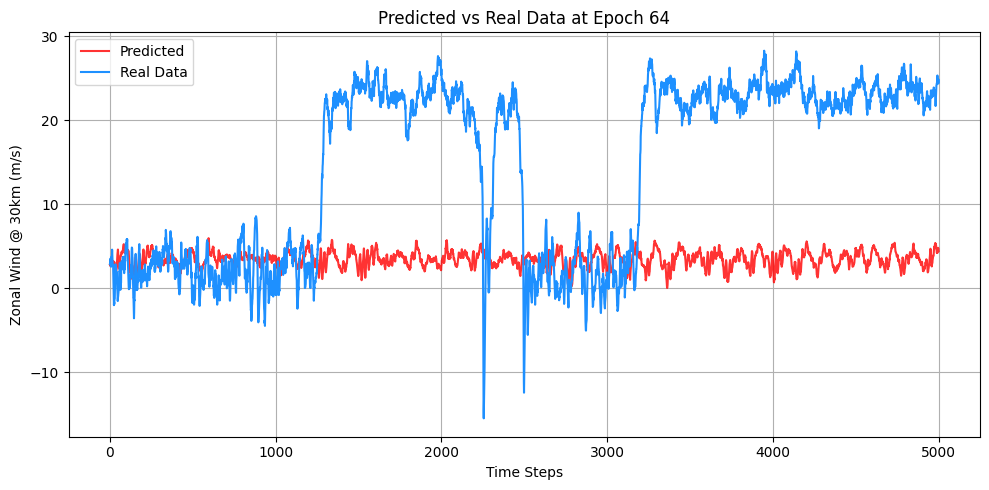

Epoch 66, 
          Reconstrunction Loss: 27.970523834228516,
          KL Divergence Loss: 0.10504525899887085
Validation Batch 49, 
        Reconstrunction Loss: 2027.30078125,
        KL Divergence Loss: 1.4230430126190186


Mini Inference at Epoch 65: 100%|██████████| 5000/5000 [00:03<00:00, 1380.54it/s]


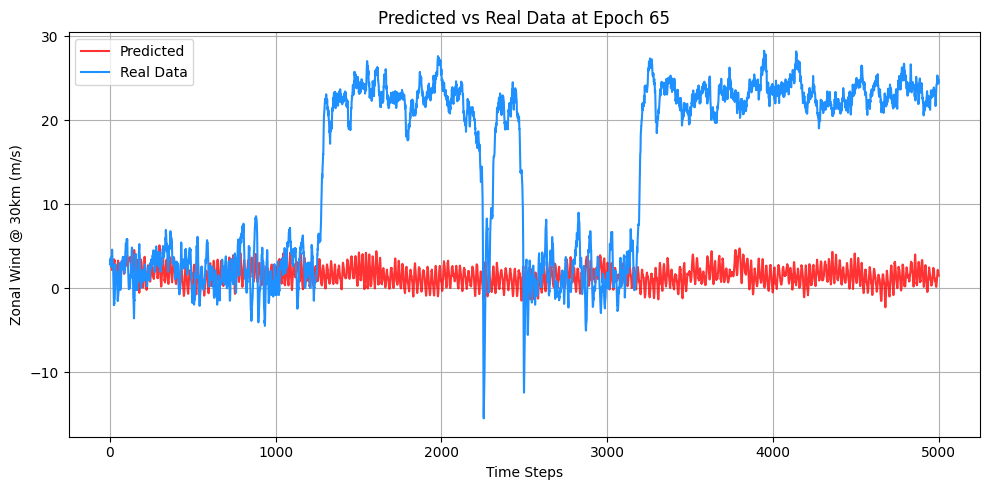

Epoch 67, 
          Reconstrunction Loss: 27.04104232788086,
          KL Divergence Loss: 0.09178020060062408
Validation Batch 49, 
        Reconstrunction Loss: 1954.1240234375,
        KL Divergence Loss: 1.661564588546753


Mini Inference at Epoch 66: 100%|██████████| 5000/5000 [00:03<00:00, 1354.86it/s]


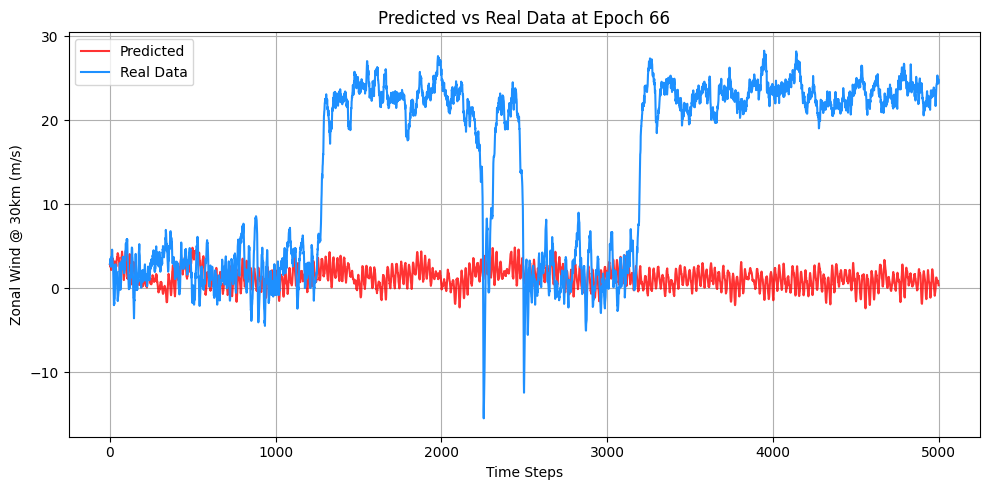

Epoch 68, 
          Reconstrunction Loss: 27.853322982788086,
          KL Divergence Loss: 0.10346654802560806
Validation Batch 49, 
        Reconstrunction Loss: 1995.2392578125,
        KL Divergence Loss: 1.3078477382659912


Mini Inference at Epoch 67: 100%|██████████| 5000/5000 [00:03<00:00, 1341.10it/s]


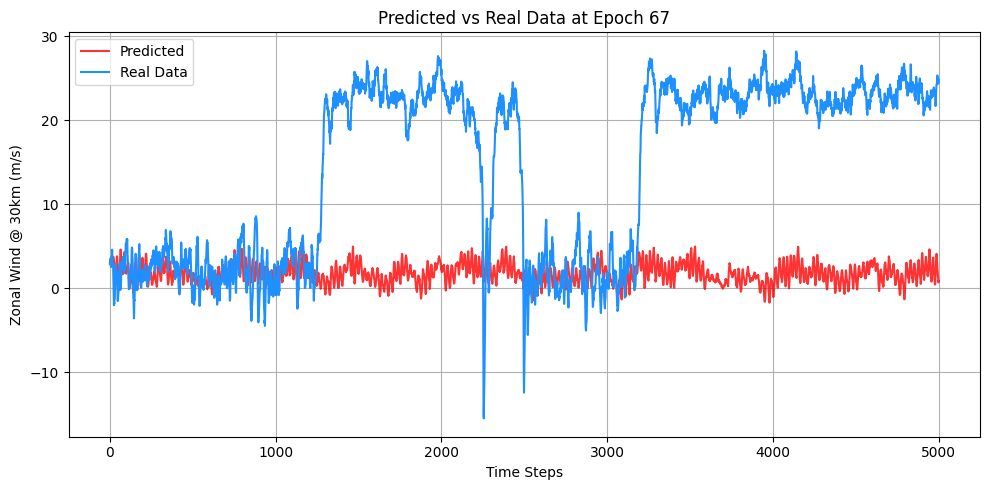

Epoch 69, 
          Reconstrunction Loss: 27.7408447265625,
          KL Divergence Loss: 0.07489032298326492
Validation Batch 49, 
        Reconstrunction Loss: 2028.689453125,
        KL Divergence Loss: 0.9988467693328857


Mini Inference at Epoch 68: 100%|██████████| 5000/5000 [00:03<00:00, 1366.13it/s]


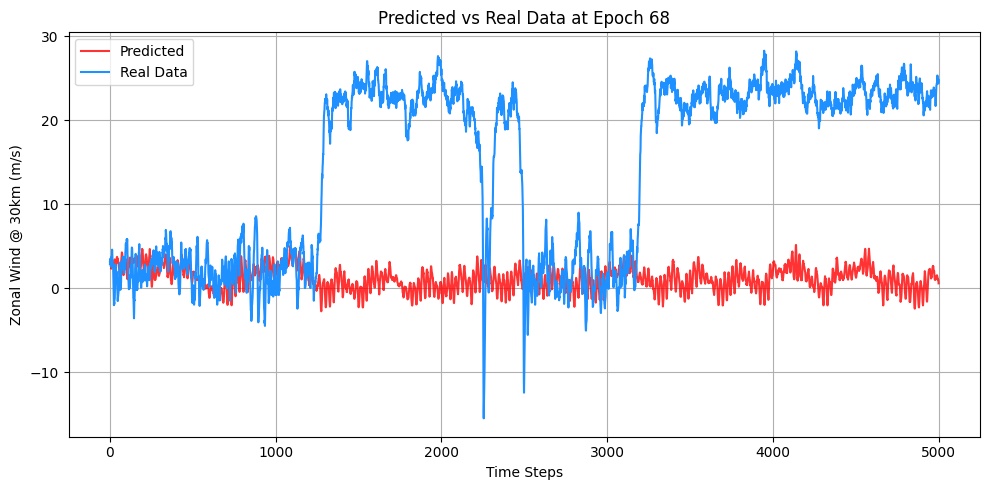

Epoch 70, 
          Reconstrunction Loss: 28.353591918945312,
          KL Divergence Loss: 0.2775074243545532
Validation Batch 49, 
        Reconstrunction Loss: 2019.05859375,
        KL Divergence Loss: 4.350912094116211


Mini Inference at Epoch 69: 100%|██████████| 5000/5000 [00:03<00:00, 1346.18it/s]


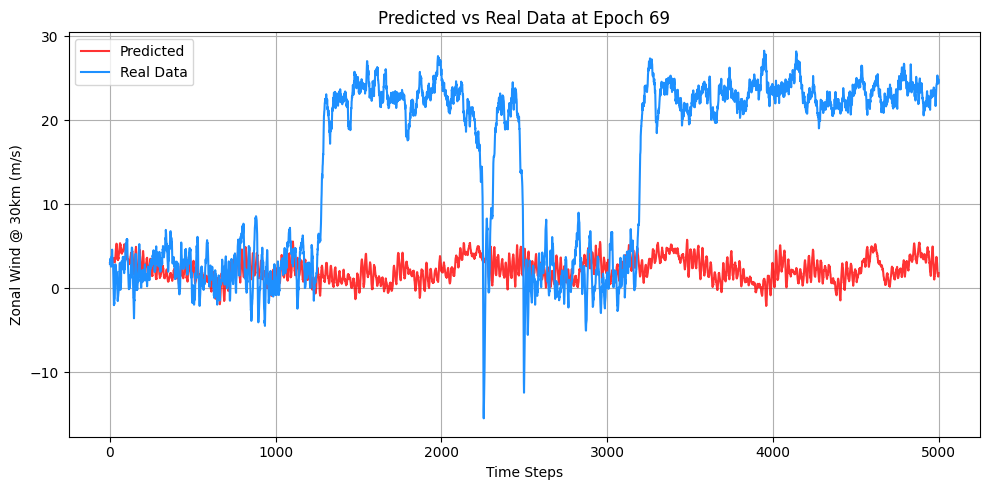

Epoch 71, 
          Reconstrunction Loss: 27.6419734954834,
          KL Divergence Loss: 0.049102332442998886
Validation Batch 49, 
        Reconstrunction Loss: 2051.959228515625,
        KL Divergence Loss: 0.6155238151550293


Mini Inference at Epoch 70: 100%|██████████| 5000/5000 [00:03<00:00, 1425.85it/s]


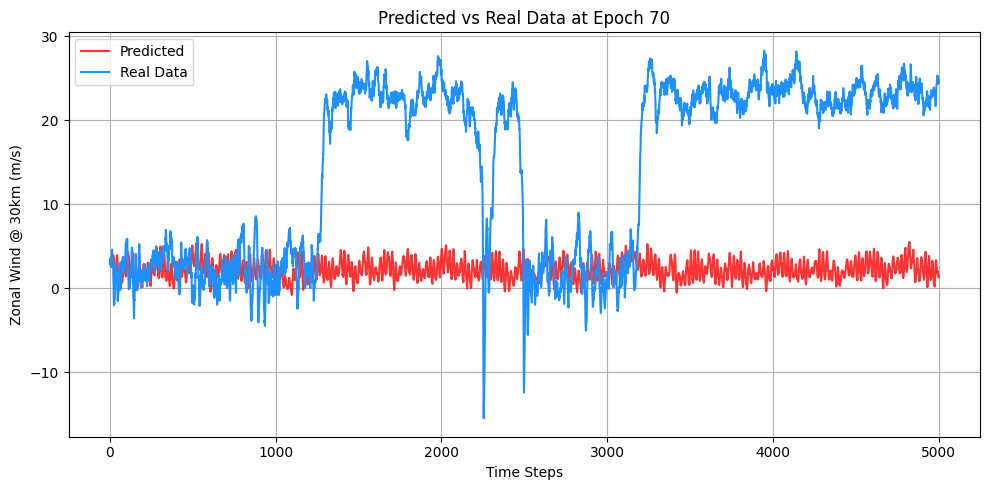

Epoch 72, 
          Reconstrunction Loss: 27.756366729736328,
          KL Divergence Loss: 0.11154457926750183
Validation Batch 49, 
        Reconstrunction Loss: 1980.60986328125,
        KL Divergence Loss: 1.2219200134277344


Mini Inference at Epoch 71: 100%|██████████| 5000/5000 [00:03<00:00, 1368.34it/s]


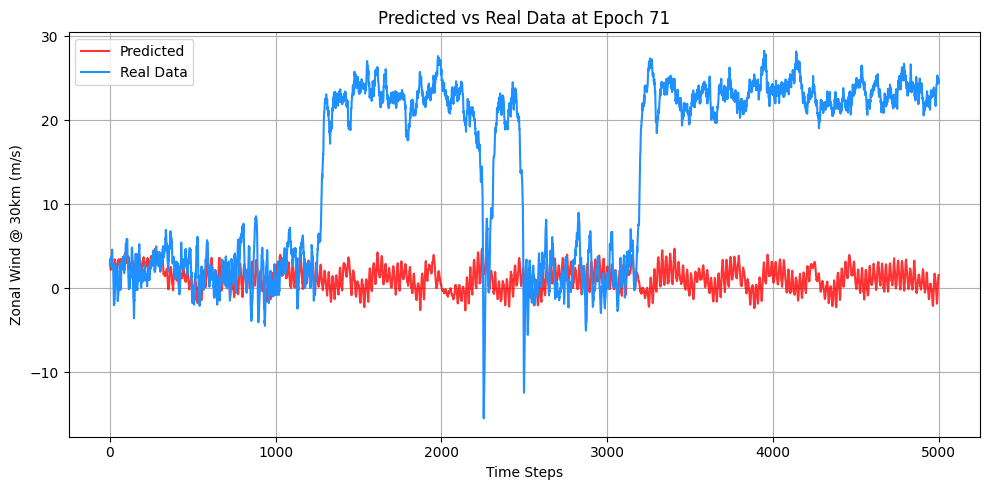

Epoch 73, 
          Reconstrunction Loss: 27.350879669189453,
          KL Divergence Loss: 0.10406418889760971
Validation Batch 49, 
        Reconstrunction Loss: 2013.35009765625,
        KL Divergence Loss: 1.233647346496582


Mini Inference at Epoch 72: 100%|██████████| 5000/5000 [00:03<00:00, 1563.13it/s]


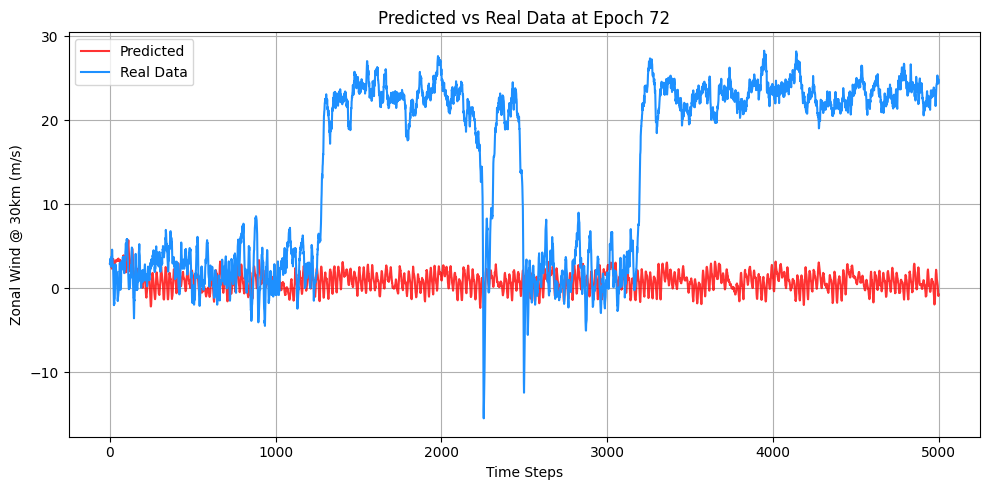

Epoch 74, 
          Reconstrunction Loss: 27.22842788696289,
          KL Divergence Loss: 0.15076078474521637
Validation Batch 49, 
        Reconstrunction Loss: 2042.693115234375,
        KL Divergence Loss: 1.5891737937927246


Mini Inference at Epoch 73: 100%|██████████| 5000/5000 [00:03<00:00, 1376.44it/s]


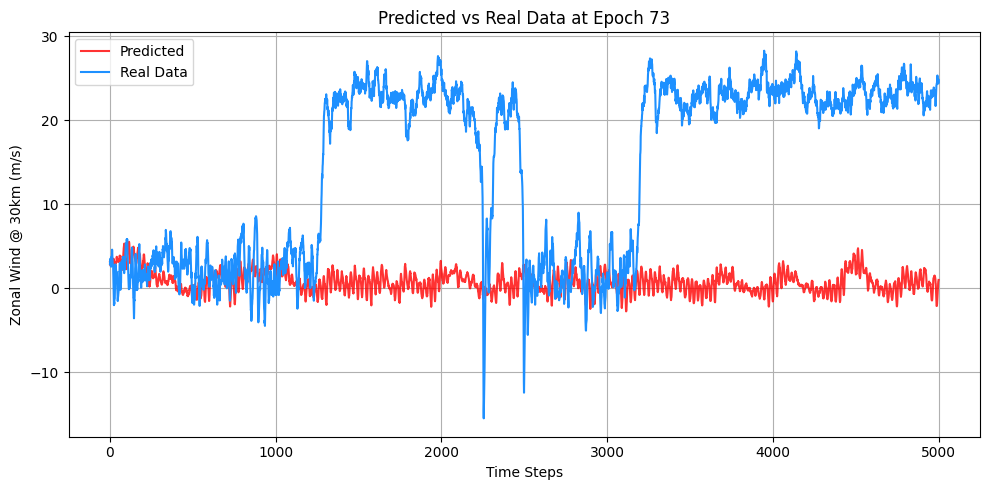

Epoch 75, 
          Reconstrunction Loss: 27.756099700927734,
          KL Divergence Loss: 0.11288698017597198
Validation Batch 49, 
        Reconstrunction Loss: 2014.2720947265625,
        KL Divergence Loss: 1.8211212158203125


Mini Inference at Epoch 74: 100%|██████████| 5000/5000 [00:03<00:00, 1469.67it/s]


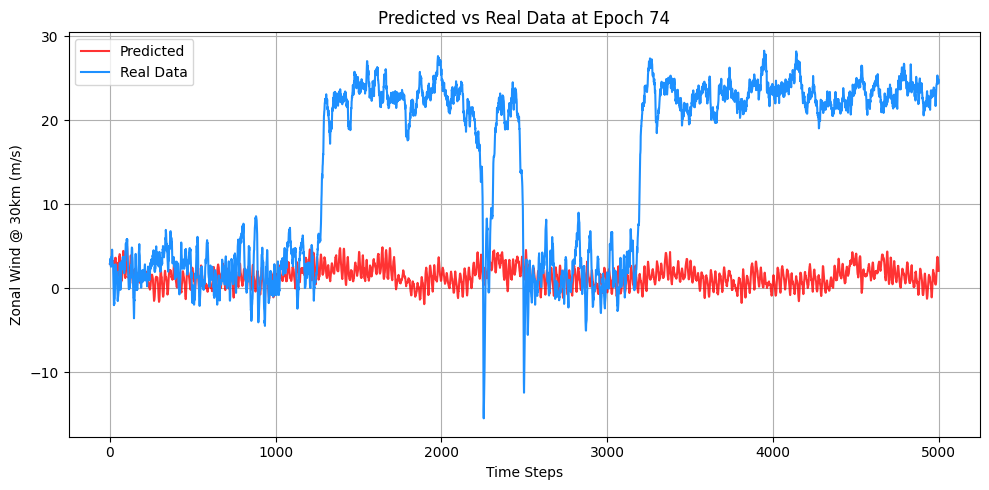

Epoch 76, 
          Reconstrunction Loss: 27.79110336303711,
          KL Divergence Loss: 0.05110088363289833
Validation Batch 49, 
        Reconstrunction Loss: 2004.77392578125,
        KL Divergence Loss: 0.7012298107147217


Mini Inference at Epoch 75: 100%|██████████| 5000/5000 [00:03<00:00, 1334.94it/s]


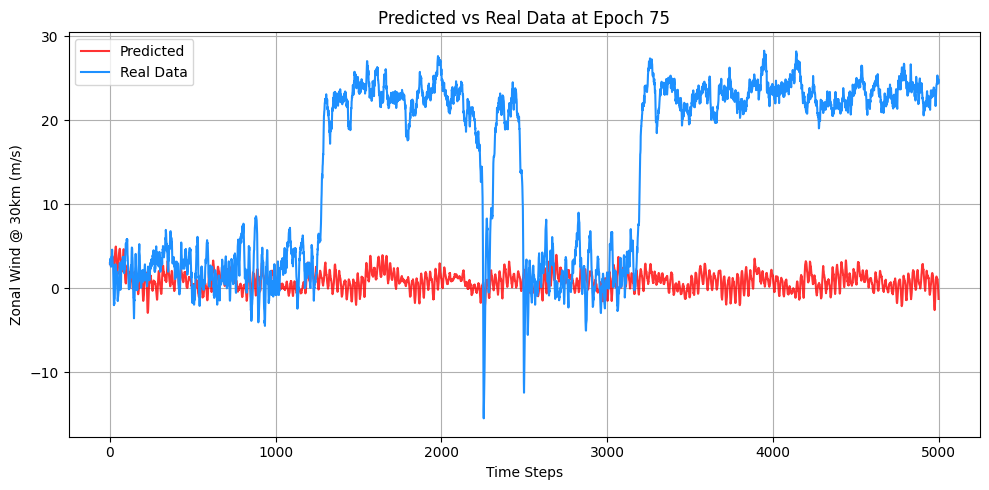

Epoch 77, 
          Reconstrunction Loss: 26.861421585083008,
          KL Divergence Loss: 0.1451054811477661
Validation Batch 49, 
        Reconstrunction Loss: 2048.52001953125,
        KL Divergence Loss: 1.5351159572601318


Mini Inference at Epoch 76: 100%|██████████| 5000/5000 [00:03<00:00, 1336.31it/s]


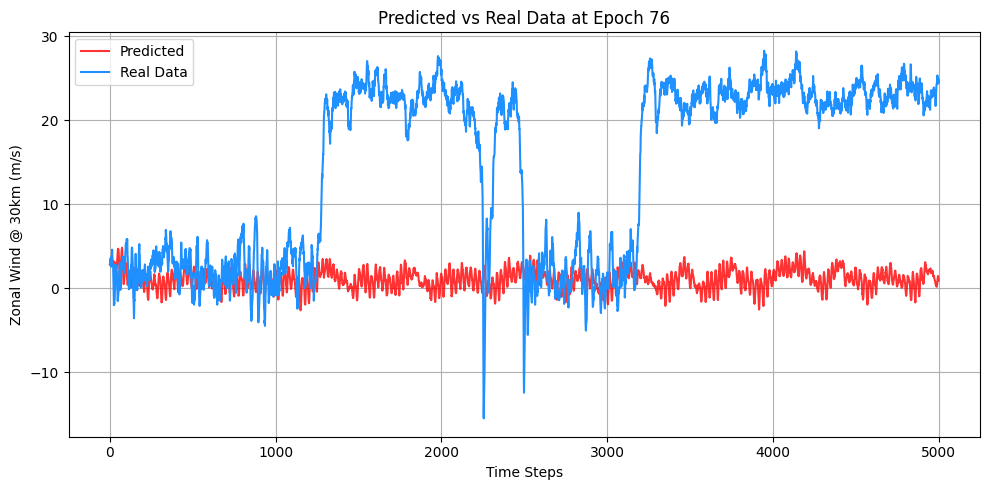

Epoch 78, 
          Reconstrunction Loss: 26.300785064697266,
          KL Divergence Loss: 0.05709393694996834
Validation Batch 49, 
        Reconstrunction Loss: 2021.287841796875,
        KL Divergence Loss: 0.7533135414123535


Mini Inference at Epoch 77: 100%|██████████| 5000/5000 [00:03<00:00, 1295.03it/s]


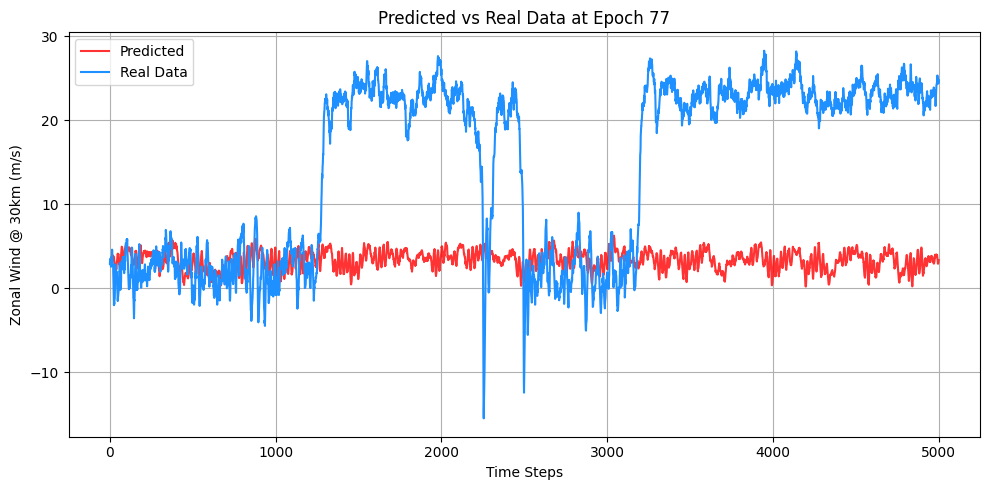

Epoch 79, 
          Reconstrunction Loss: 27.063289642333984,
          KL Divergence Loss: 0.07767515629529953
Validation Batch 49, 
        Reconstrunction Loss: 2022.9710693359375,
        KL Divergence Loss: 1.2045412063598633


Mini Inference at Epoch 78: 100%|██████████| 5000/5000 [00:03<00:00, 1293.53it/s]


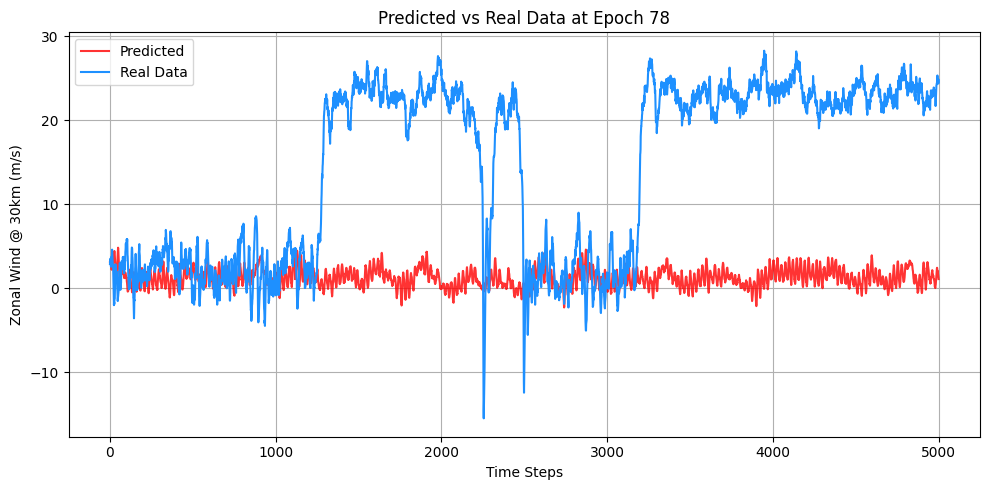

Epoch 80, 
          Reconstrunction Loss: 27.42525291442871,
          KL Divergence Loss: 0.07917021214962006
Validation Batch 49, 
        Reconstrunction Loss: 2047.5172119140625,
        KL Divergence Loss: 1.495457649230957


Mini Inference at Epoch 79: 100%|██████████| 5000/5000 [00:03<00:00, 1323.50it/s]


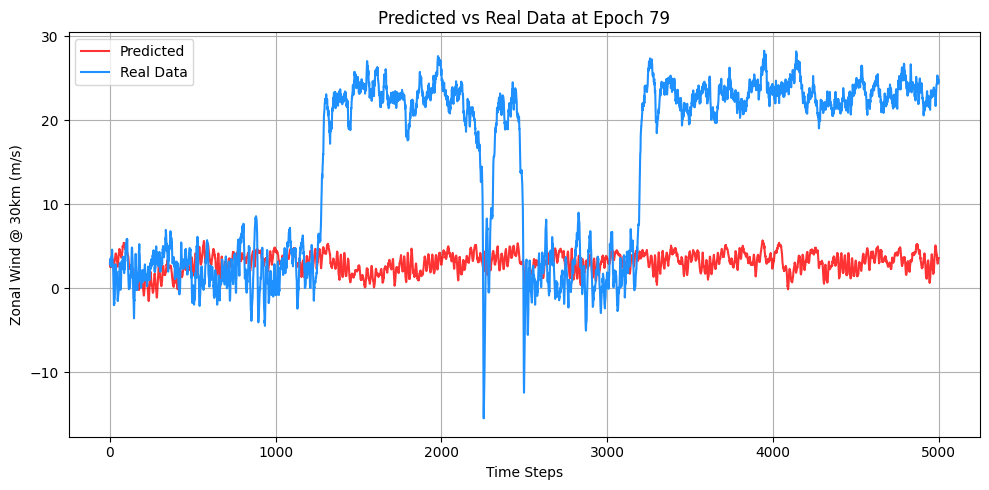

Epoch 81, 
          Reconstrunction Loss: 26.2551326751709,
          KL Divergence Loss: 0.10744578391313553
Validation Batch 49, 
        Reconstrunction Loss: 2014.3505859375,
        KL Divergence Loss: 1.4610800743103027


Mini Inference at Epoch 80: 100%|██████████| 5000/5000 [00:03<00:00, 1318.67it/s]


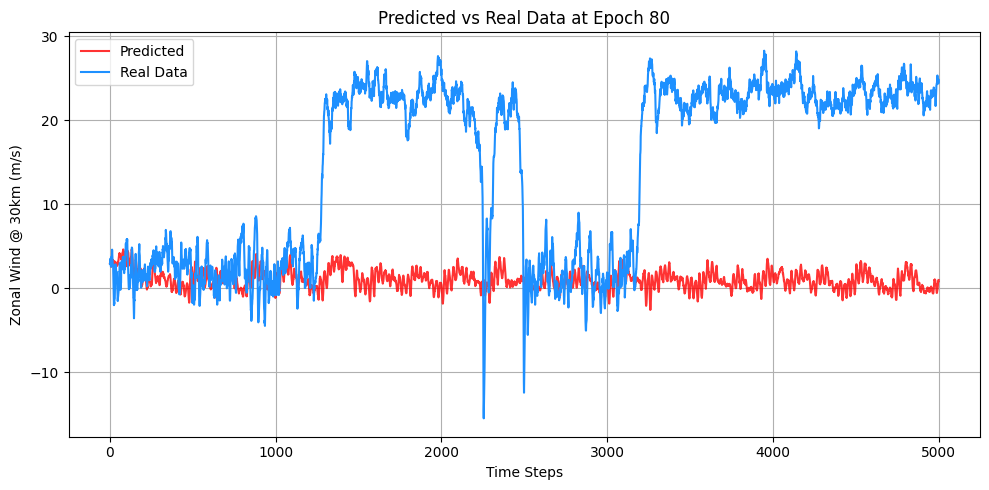

Epoch 82, 
          Reconstrunction Loss: 26.44019317626953,
          KL Divergence Loss: 0.08513510972261429
Validation Batch 49, 
        Reconstrunction Loss: 1990.038330078125,
        KL Divergence Loss: 1.0819333791732788


Mini Inference at Epoch 81: 100%|██████████| 5000/5000 [00:03<00:00, 1400.49it/s]


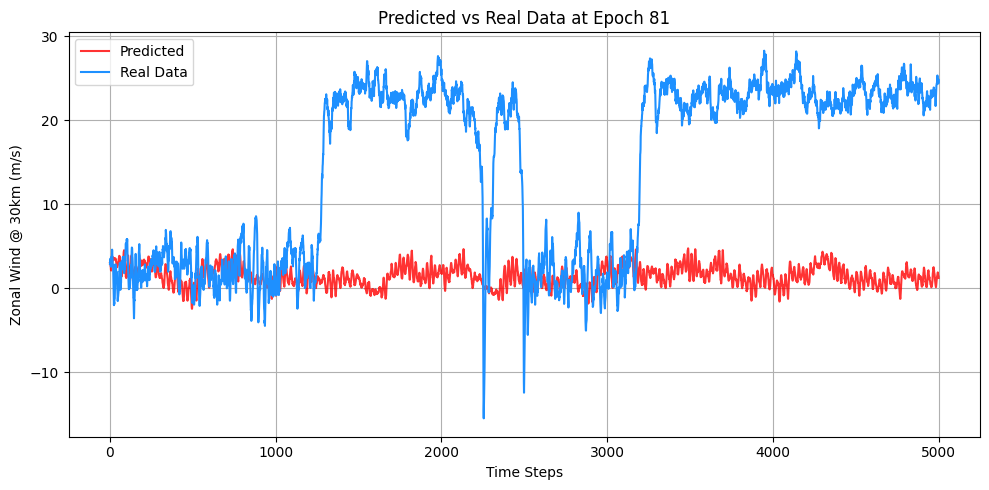

Epoch 83, 
          Reconstrunction Loss: 26.520885467529297,
          KL Divergence Loss: 0.15560048818588257
Validation Batch 49, 
        Reconstrunction Loss: 2034.779296875,
        KL Divergence Loss: 2.6919751167297363


Mini Inference at Epoch 82: 100%|██████████| 5000/5000 [00:03<00:00, 1355.13it/s]


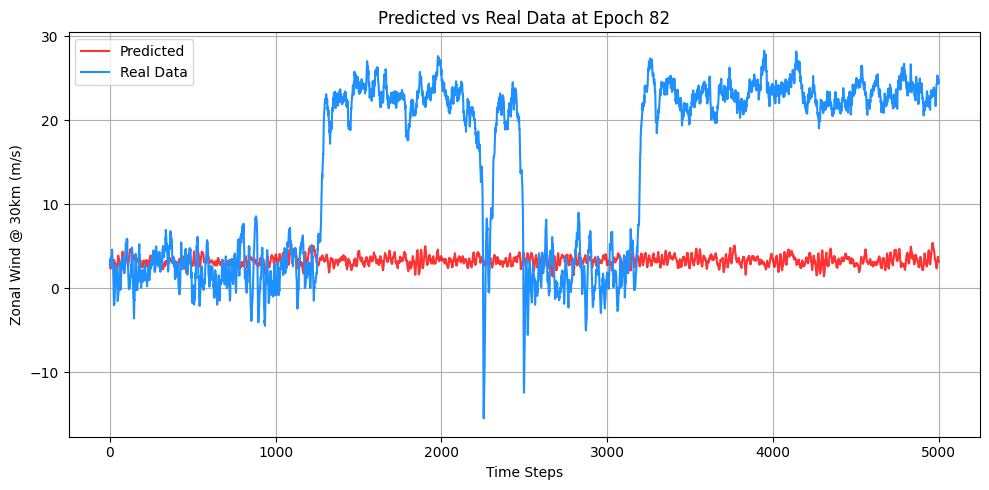

Epoch 84, 
          Reconstrunction Loss: 26.276662826538086,
          KL Divergence Loss: 0.033305149525403976
Validation Batch 49, 
        Reconstrunction Loss: 2053.40869140625,
        KL Divergence Loss: 0.44810912013053894


Mini Inference at Epoch 83: 100%|██████████| 5000/5000 [00:03<00:00, 1519.82it/s]


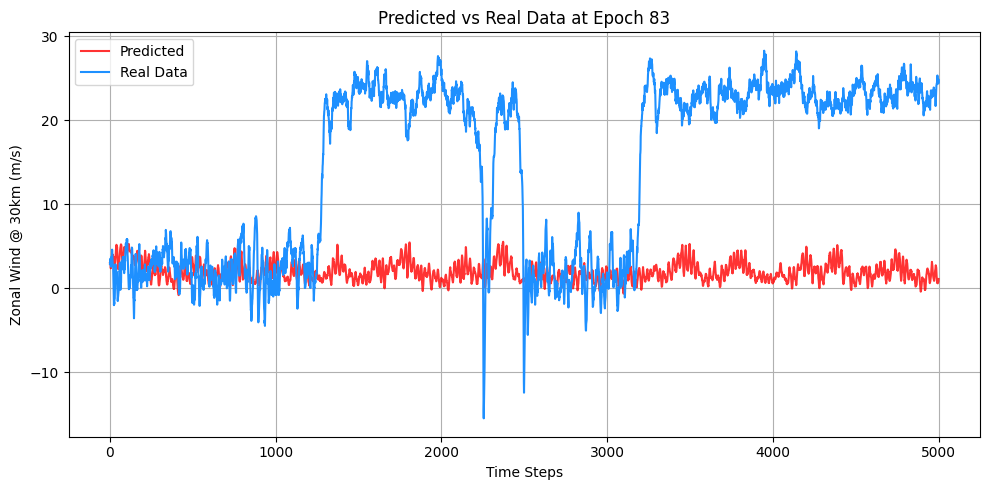

Epoch 85, 
          Reconstrunction Loss: 27.211938858032227,
          KL Divergence Loss: 0.07737446576356888
Validation Batch 49, 
        Reconstrunction Loss: 2030.308349609375,
        KL Divergence Loss: 1.033384084701538


Mini Inference at Epoch 84: 100%|██████████| 5000/5000 [00:03<00:00, 1329.89it/s]


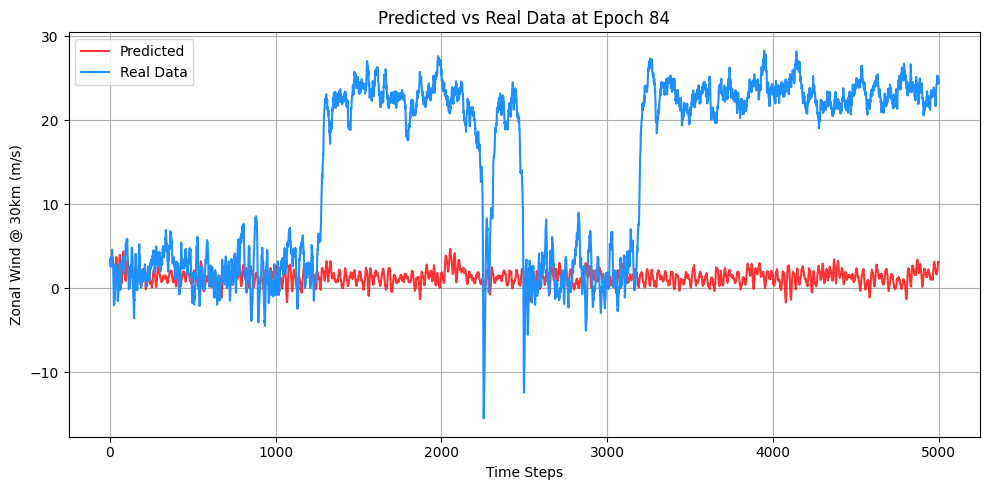

Epoch 86, 
          Reconstrunction Loss: 25.989870071411133,
          KL Divergence Loss: 0.19194091856479645
Validation Batch 49, 
        Reconstrunction Loss: 2009.74853515625,
        KL Divergence Loss: 2.3714613914489746


Mini Inference at Epoch 85: 100%|██████████| 5000/5000 [00:03<00:00, 1448.01it/s]


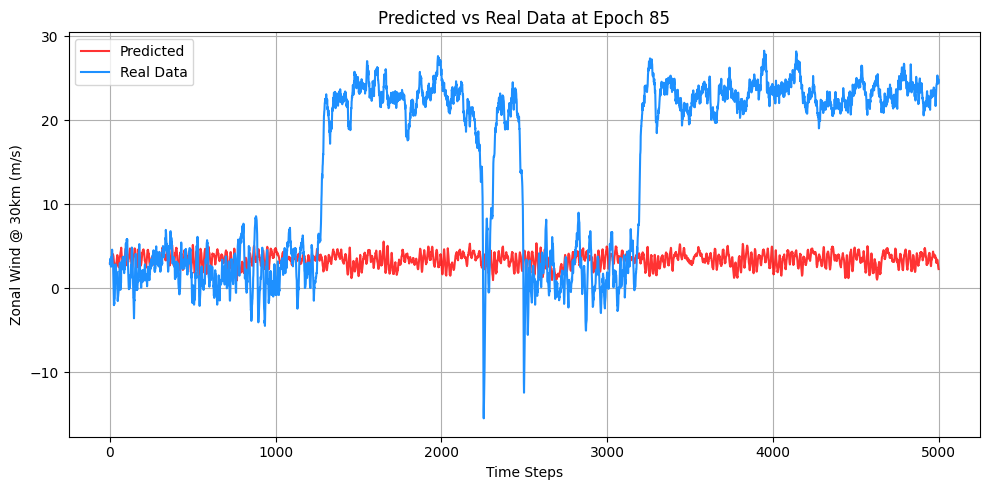

Epoch 87, 
          Reconstrunction Loss: 26.513750076293945,
          KL Divergence Loss: 0.031221555545926094
Validation Batch 49, 
        Reconstrunction Loss: 2009.777587890625,
        KL Divergence Loss: 0.4141303300857544


Mini Inference at Epoch 86: 100%|██████████| 5000/5000 [00:03<00:00, 1347.05it/s]


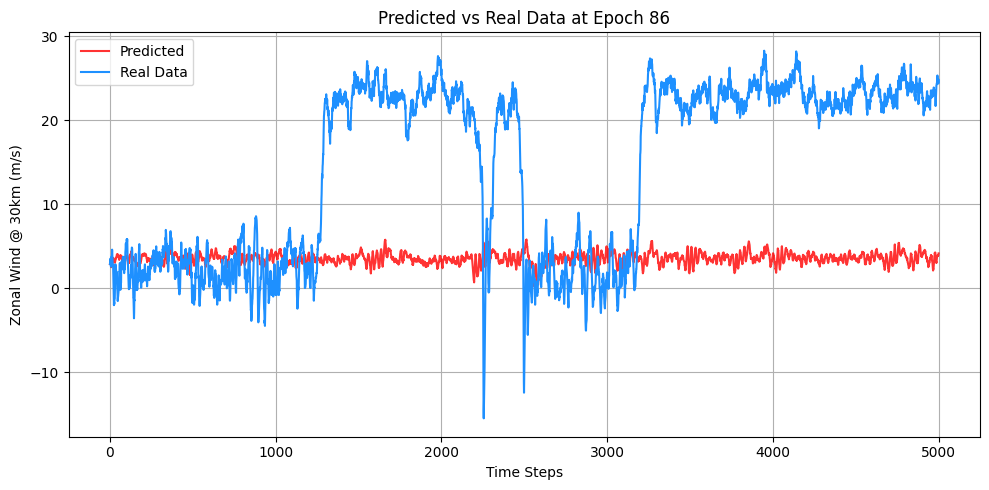

Epoch 88, 
          Reconstrunction Loss: 26.335533142089844,
          KL Divergence Loss: 0.06619326770305634
Validation Batch 49, 
        Reconstrunction Loss: 2017.04248046875,
        KL Divergence Loss: 0.9710260033607483


Mini Inference at Epoch 87: 100%|██████████| 5000/5000 [00:03<00:00, 1327.35it/s]


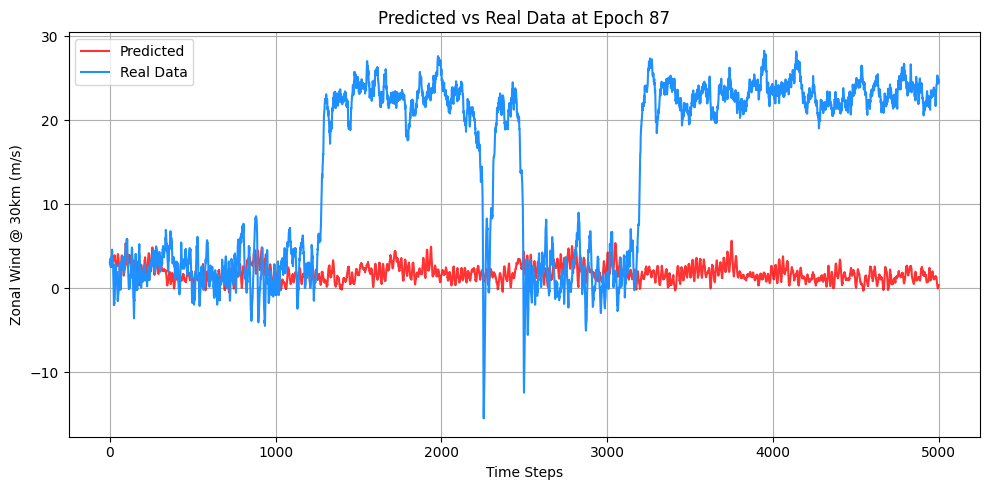

Epoch 89, 
          Reconstrunction Loss: 26.412752151489258,
          KL Divergence Loss: 0.1510157287120819
Validation Batch 49, 
        Reconstrunction Loss: 1990.041015625,
        KL Divergence Loss: 1.6356964111328125


Mini Inference at Epoch 88: 100%|██████████| 5000/5000 [00:03<00:00, 1337.83it/s]


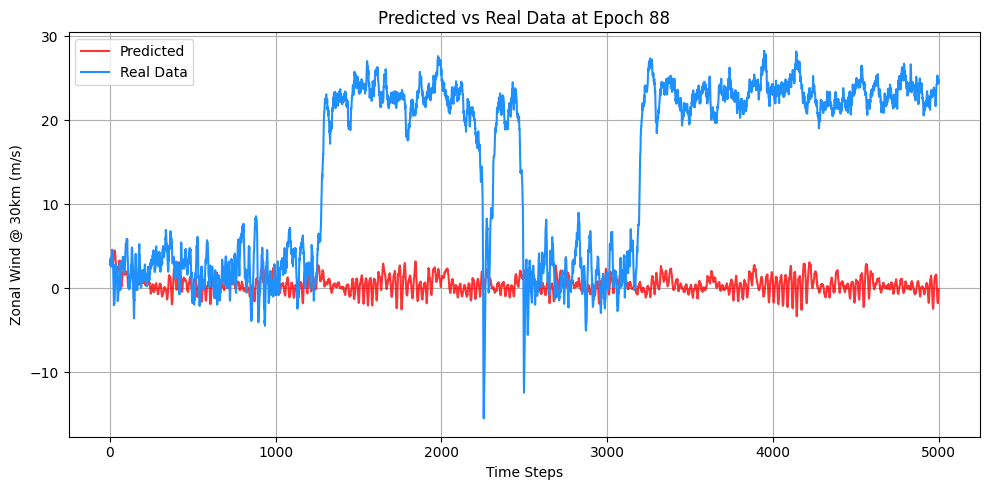

Epoch 90, 
          Reconstrunction Loss: 26.765623092651367,
          KL Divergence Loss: 0.029359733685851097
Validation Batch 49, 
        Reconstrunction Loss: 2058.26806640625,
        KL Divergence Loss: 0.39714673161506653


Mini Inference at Epoch 89: 100%|██████████| 5000/5000 [00:03<00:00, 1334.98it/s]


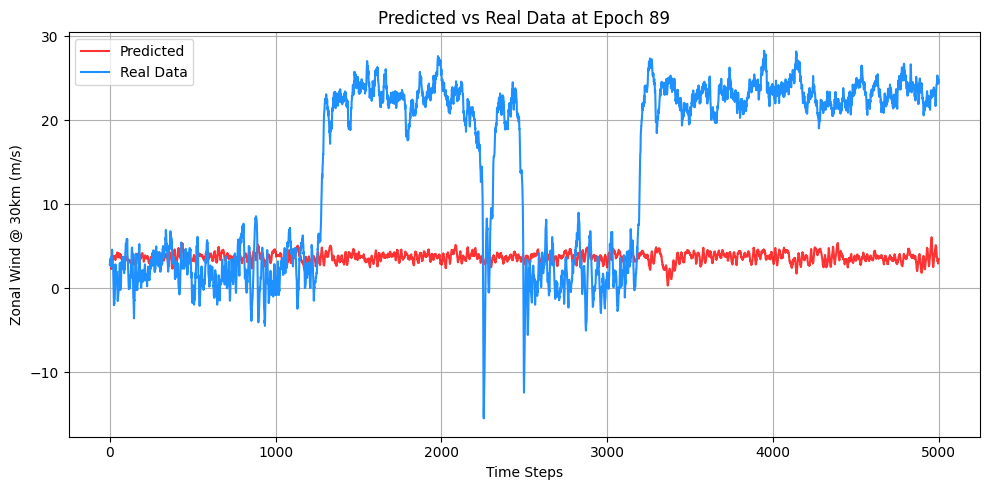

Epoch 91, 
          Reconstrunction Loss: 25.90310287475586,
          KL Divergence Loss: 0.16480687260627747
Validation Batch 49, 
        Reconstrunction Loss: 2021.4661865234375,
        KL Divergence Loss: 2.3738489151000977


Mini Inference at Epoch 90: 100%|██████████| 5000/5000 [00:03<00:00, 1404.27it/s]


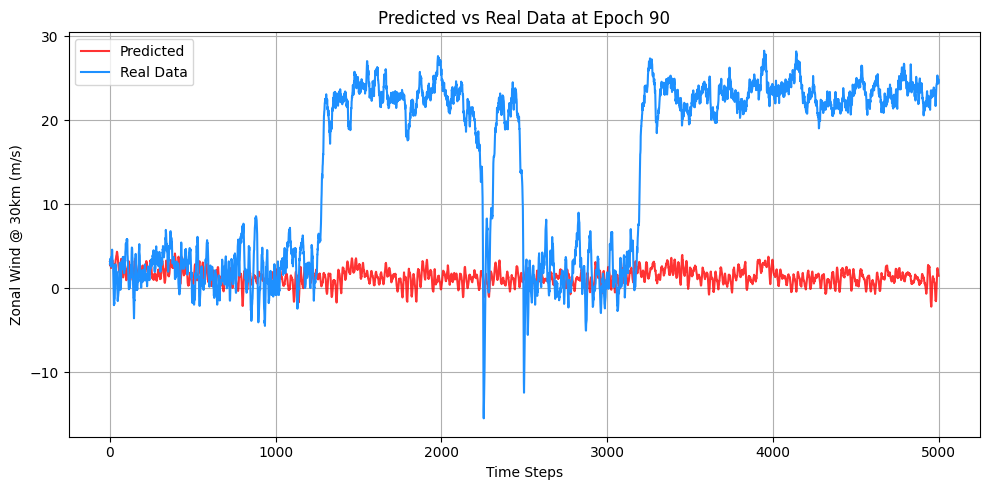

Epoch 92, 
          Reconstrunction Loss: 25.749019622802734,
          KL Divergence Loss: 0.027232952415943146
Validation Batch 49, 
        Reconstrunction Loss: 2008.2357177734375,
        KL Divergence Loss: 0.37149786949157715


Mini Inference at Epoch 91: 100%|██████████| 5000/5000 [00:03<00:00, 1329.90it/s]


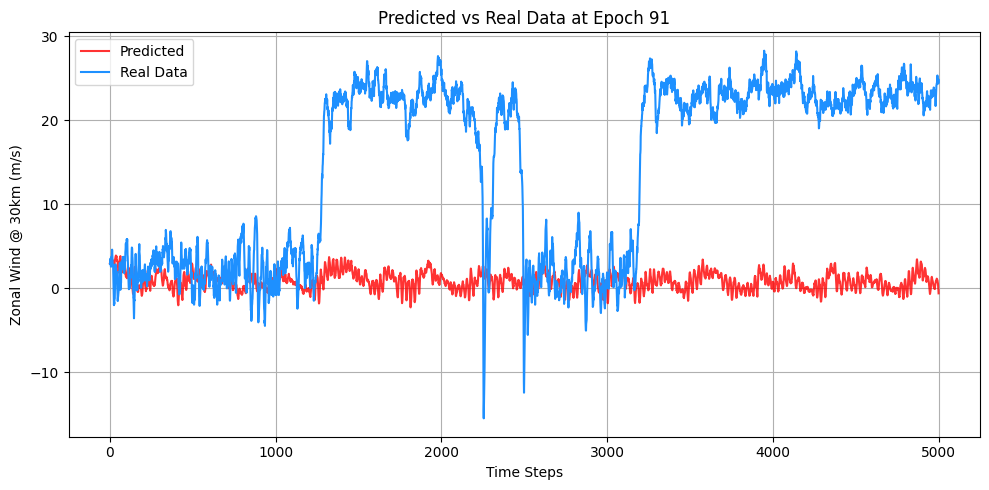

Epoch 93, 
          Reconstrunction Loss: 27.083187103271484,
          KL Divergence Loss: 0.06249607726931572
Validation Batch 49, 
        Reconstrunction Loss: 2053.613525390625,
        KL Divergence Loss: 0.7660057544708252


Mini Inference at Epoch 92: 100%|██████████| 5000/5000 [00:03<00:00, 1475.73it/s]


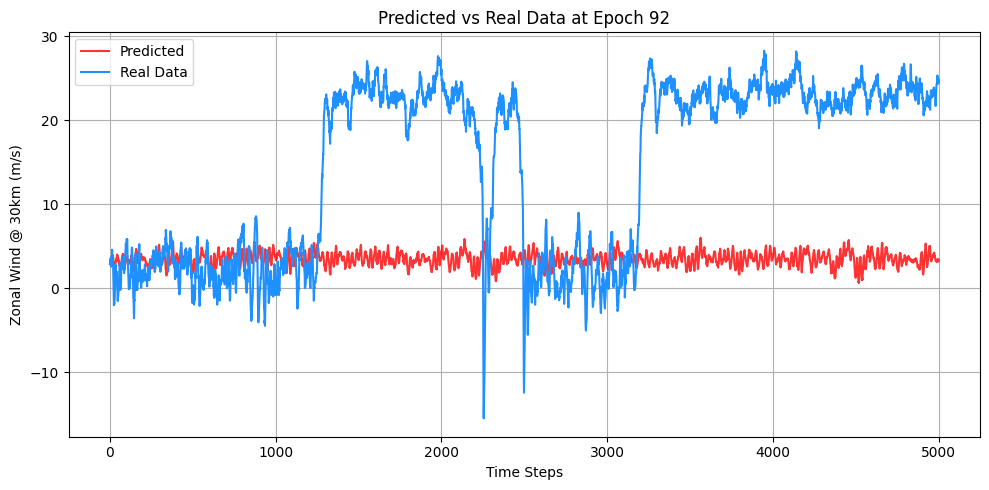

Epoch 94, 
          Reconstrunction Loss: 26.231225967407227,
          KL Divergence Loss: 0.1655074506998062
Validation Batch 49, 
        Reconstrunction Loss: 2013.219970703125,
        KL Divergence Loss: 2.10351300239563


Mini Inference at Epoch 93: 100%|██████████| 5000/5000 [00:03<00:00, 1355.33it/s]


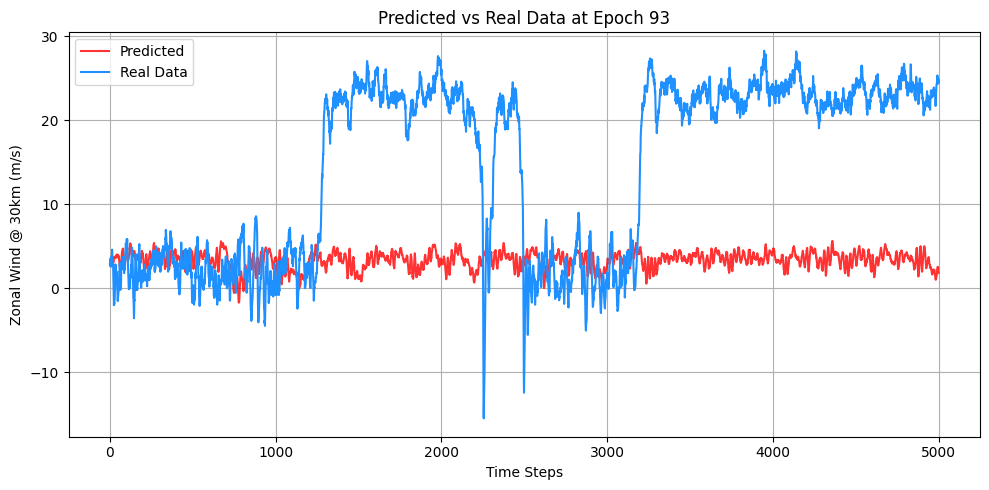

Epoch 95, 
          Reconstrunction Loss: 27.84699058532715,
          KL Divergence Loss: 0.025516076013445854
Validation Batch 49, 
        Reconstrunction Loss: 2061.4423828125,
        KL Divergence Loss: 0.3582315444946289


Mini Inference at Epoch 94: 100%|██████████| 5000/5000 [00:03<00:00, 1410.93it/s]


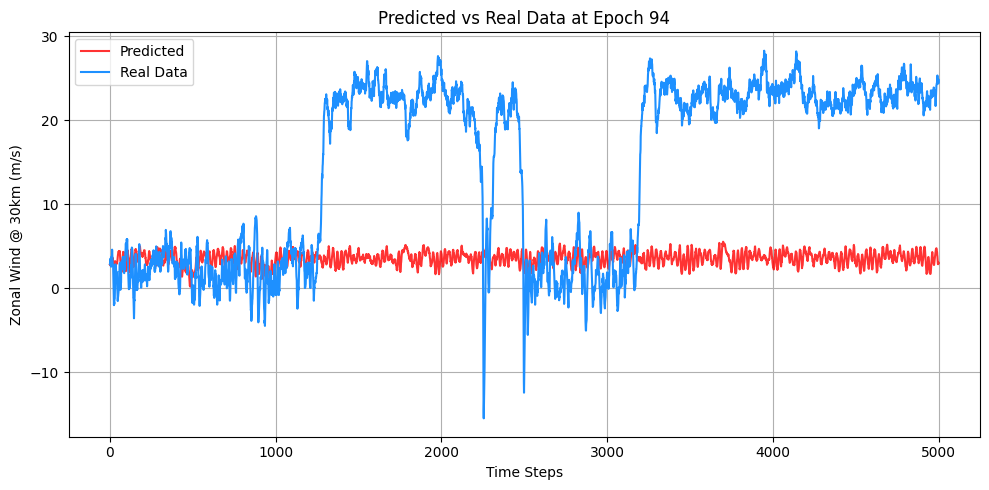

Epoch 96, 
          Reconstrunction Loss: 26.184799194335938,
          KL Divergence Loss: 0.10844457894563675
Validation Batch 49, 
        Reconstrunction Loss: 2021.5301513671875,
        KL Divergence Loss: 1.3880071640014648


Mini Inference at Epoch 95: 100%|██████████| 5000/5000 [00:03<00:00, 1361.49it/s]


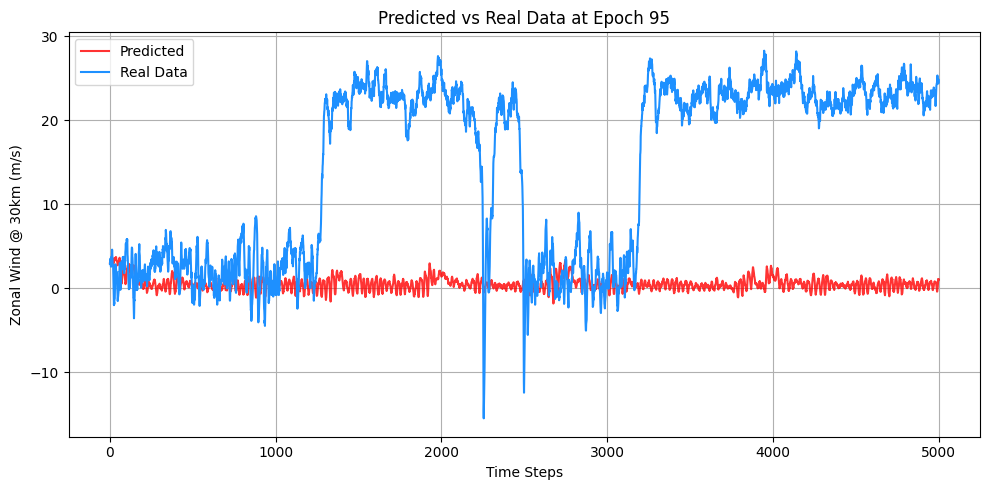

Epoch 97, 
          Reconstrunction Loss: 25.313934326171875,
          KL Divergence Loss: 0.026665953919291496
Validation Batch 49, 
        Reconstrunction Loss: 2016.0172119140625,
        KL Divergence Loss: 0.3646252751350403


Mini Inference at Epoch 96: 100%|██████████| 5000/5000 [00:03<00:00, 1343.21it/s]


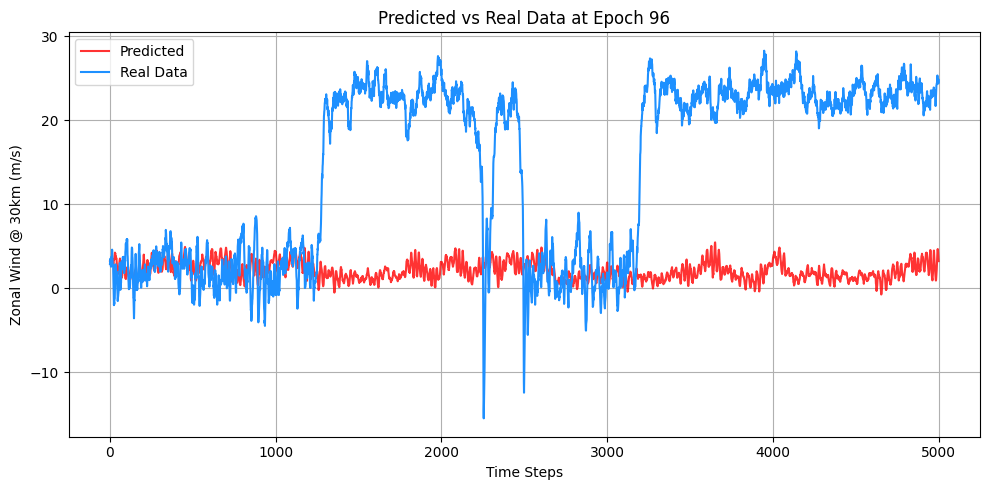

Epoch 98, 
          Reconstrunction Loss: 26.936511993408203,
          KL Divergence Loss: 0.11600328981876373
Validation Batch 49, 
        Reconstrunction Loss: 1990.376953125,
        KL Divergence Loss: 1.5061701536178589


Mini Inference at Epoch 97: 100%|██████████| 5000/5000 [00:03<00:00, 1353.11it/s]


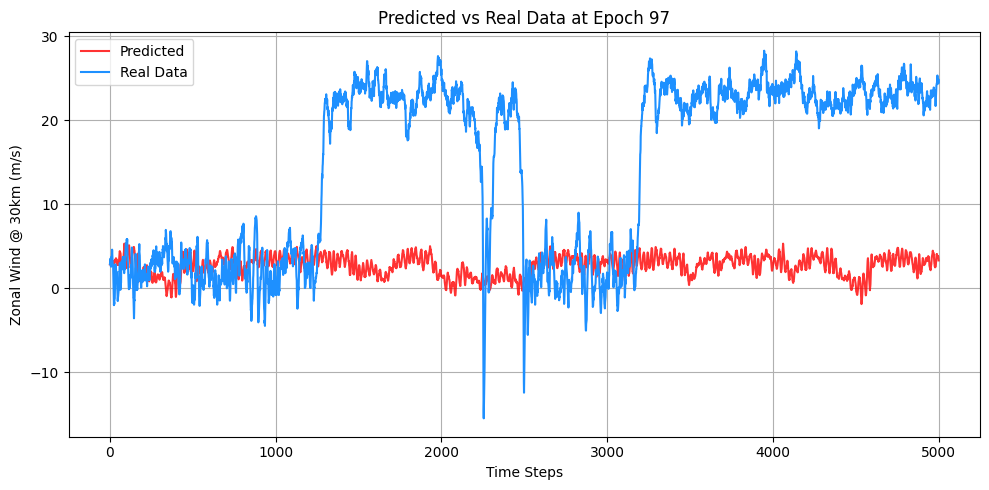

Epoch 99, 
          Reconstrunction Loss: 26.061092376708984,
          KL Divergence Loss: 0.025426629930734634
Validation Batch 49, 
        Reconstrunction Loss: 2023.59912109375,
        KL Divergence Loss: 0.34795352816581726


Mini Inference at Epoch 98: 100%|██████████| 5000/5000 [00:03<00:00, 1344.68it/s]


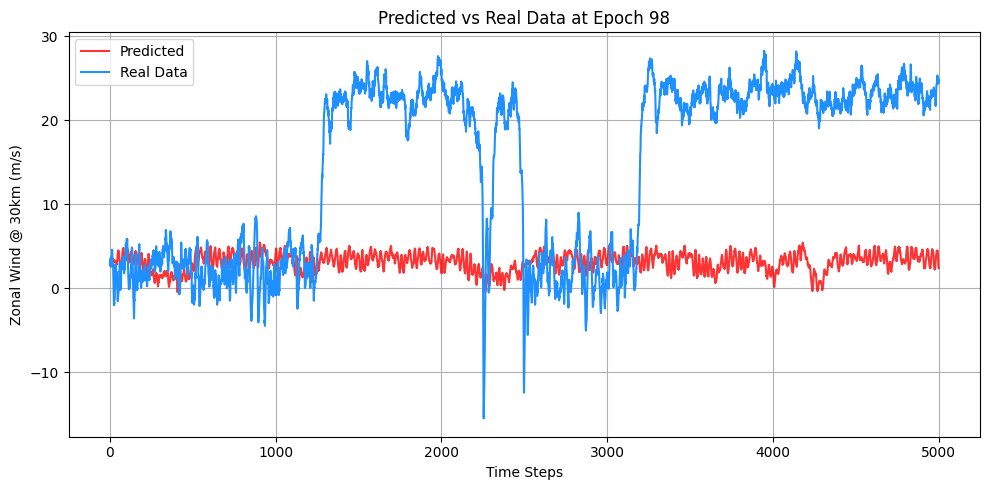

Epoch 100, 
          Reconstrunction Loss: 25.88083267211914,
          KL Divergence Loss: 0.0828368291258812
Validation Batch 49, 
        Reconstrunction Loss: 2083.69921875,
        KL Divergence Loss: 1.3863983154296875


Mini Inference at Epoch 99: 100%|██████████| 5000/5000 [00:03<00:00, 1364.94it/s]


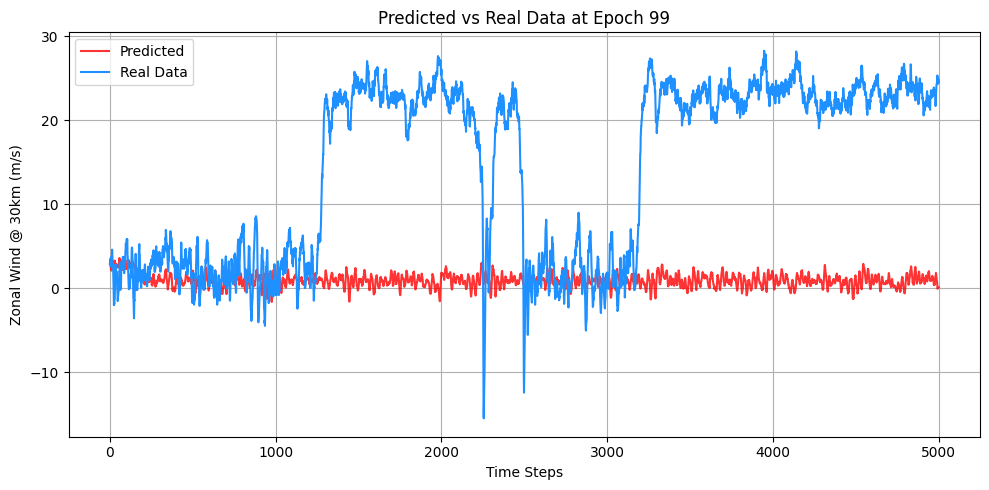

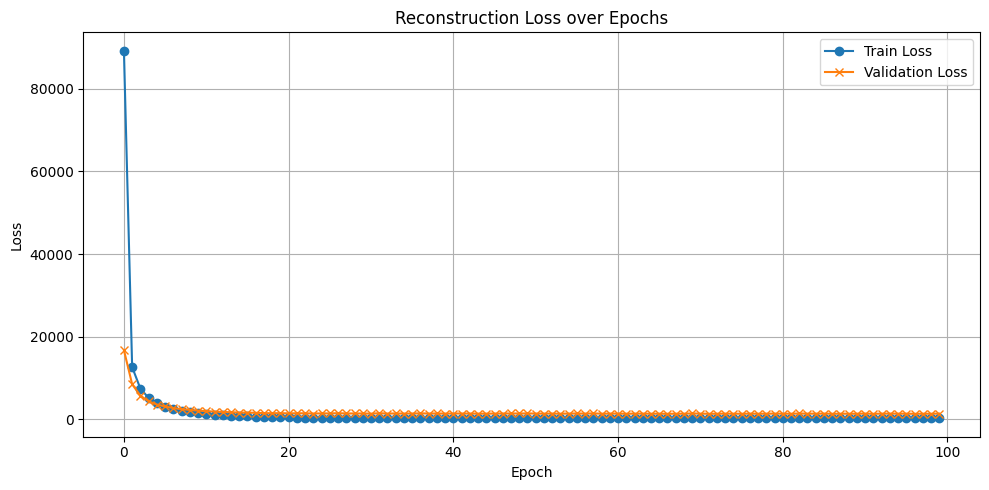

In [6]:
from scipy.stats import linregress
from tqdm import tqdm

real_data = np.load(r"C:\Users\danie\OneDrive\Desktop\work_torch\long_run_310k.npy")

train_losses = []
val_losses = []

for epoch in range(num_epochs):
    total_train_loss = 0.0
    total_val_loss = 0.0
    num_train_batches = 0.0
    num_val_batches = 0.0
    model.train()
    for batch in range(0, trainN, batch_size):
        input_batch = psi_train_input[batch:batch + batch_size]
        label_batch = psi_train_label[batch:batch + batch_size]

        optimizer.zero_grad()

        output, mu, logvar = model(label_batch.float().cuda(), input_batch.float().cuda())
        reconstruction_loss = F.huber_loss(output, label_batch.float().cuda(), reduction="sum")
        kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum()
        loss = reconstruction_loss + 10 * kl_loss

        total_train_loss += loss.item()
        num_train_batches += 1

        loss.backward()
        optimizer.step()

    avg_train_loss = total_train_loss / num_train_batches
    train_losses.append(avg_train_loss)
    print(f"""Epoch {epoch+1}, 
          Reconstrunction Loss: {reconstruction_loss},
          KL Divergence Loss: {kl_loss}""")

    model.eval()
    for batch in range(0, valN, batch_size):
        input_batch = psi_val_input[batch:batch + batch_size]
        label_batch = psi_val_label[batch:batch + batch_size]

        with torch.no_grad():
            output, mu, logvar = model(input_batch.float().cuda(), label_batch.float().cuda())
            reconstruction_loss = F.huber_loss(output, label_batch.float().cuda(), reduction="sum")
            kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum()
            val_loss = reconstruction_loss + 10 * kl_loss
            total_val_loss += val_loss.item()
            num_val_batches += 1


    avg_val_loss = total_val_loss / num_val_batches
    val_losses.append(avg_val_loss)
    print(f"""Validation Batch {batch // batch_size + 1}, 
        Reconstrunction Loss: {reconstruction_loss},
        KL Divergence Loss: {kl_loss}""")
        
    torch.save(model.state_dict(), f"{folder}/model_at_epoch{epoch}")

    # Mini Inference after each epoch
    level = 63
    model.eval()
    z = torch.zeros([1, latent_dim], device=device)
    with torch.no_grad():
        initial_cond = torch.reshape(torch.tensor(psi[0,:], dtype=torch.float32, device=device), [1, 75]).float().cuda()
        time_steps = 5000
        pred = np.zeros([time_steps, 75])
        for k in tqdm(range(0, time_steps), desc = f"Mini Inference at Epoch {epoch}"):
                z = torch.randn_like(z)
                y = (model.decode(z, initial_cond.float().cuda())).detach().cpu().numpy()
                pred[k, :] = y
                initial_cond = torch.tensor(y, dtype=torch.float32, device=device).float().cuda()
    
    pred_mean = pred * std_psi + mean_psi
    plt.figure(figsize=(10, 5))
    plt.plot(pred_mean[:, level], label='Predicted', color='red', alpha=0.8)
    plt.plot(real_data[:time_steps, 1, level], label='Real Data', color='dodgerblue')
    plt.title(f'Predicted vs Real Data at Epoch {epoch}')
    plt.xlabel('Time Steps')
    plt.ylabel('Zonal Wind @ 30km (m/s)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'{folder}/epoch_{epoch}_pred_vs_real.png')
    plt.show()

plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(val_losses, label='Validation Loss', marker='x')
plt.title('Reconstruction Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f'{folder}/loss_plot.png')
plt.show()


    

In [9]:
# Inference for multiple epochs
import datetime
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

time_step = 20000
num_ens = 1

for epoch in range(80,95):
    model_weights_path = rf"C:\Users\danie\OneDrive\Desktop\work_torch\training_only_on_38th_feature\model_at_epoch{epoch}.pth"

    # Initialize model
    model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim)
    model.load_state_dict(torch.load(model_weights_path, map_location=device))
    model = model.to(device)
    model.eval()

    print(f"Model loaded from {model_weights_path}")

    pred = np.zeros([time_step, 75, num_ens])

    initial_cond = torch.tensor(psi[0], dtype=torch.float32, device=device).view(1, -1)
    print(f"Initial condition shape: {initial_cond.shape}")
    z = torch.zeros([1, latent_dim], device=device)

    with torch.no_grad():
        for k in tqdm(range(time_step), desc=f"Epoch {epoch} Inference"):
            for ens in range(num_ens):
                z = torch.randn_like(z)

                cond = initial_cond if k == 0 else torch.tensor(pred[k - 1, ens], dtype=torch.float32, device=device).view(1, -1)
                y = model.decode(z, cond)
                y_cpu = y.squeeze().cpu().numpy()
                pred[k, ens] = y_cpu
                initial_cond = y  # Update for next step

    std_scalar = std_psi[0, 13] if std_psi.ndim > 1 else std_psi[63]
    mean_scalar = mean_psi[0, 13] if mean_psi.ndim > 1 else mean_psi[63]

    pred_mean = pred[:, 0] * std_scalar + mean_scalar  # Assuming pred is shape (time_step, 1)
    actual_values = psi[:time_step] * std_scalar + mean_scalar

    # === Save and Plot ===

    plt.figure(figsize=(16, 6))
    plt.plot(pred_mean, label="Prediction", color='red')      
    plt.plot(actual_values, label="Actual", alpha=0.7)          
    plt.title(f"Predicted vs Actual - Epoch {epoch}")
    plt.xlabel("Time Step")
    plt.ylabel("Zonal Wind @ 30km (m/s)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    plt.close()


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\danie\\OneDrive\\Desktop\\work_torch\\training_only_on_38th_feature\\model_at_epoch80.pth'

# Learning Deterministic States?

Model loaded from C:\Users\danie\OneDrive\Desktop\work_torch\model_at_2025-06-11_09-46-01.645367\model_at_epoch30
Initial conditions shape: (20, 75)


Trajectory Inference:   0%|          | 0/20 [00:00<?, ?it/s]

Initial condition shape for trajectory 1: torch.Size([1, 75])


Trajectory Inference:   5%|▌         | 1/20 [00:00<00:15,  1.25it/s]

Initial condition shape for trajectory 2: torch.Size([1, 75])


Trajectory Inference:  10%|█         | 2/20 [00:01<00:13,  1.34it/s]

Initial condition shape for trajectory 3: torch.Size([1, 75])


Trajectory Inference:  15%|█▌        | 3/20 [00:02<00:12,  1.35it/s]

Initial condition shape for trajectory 4: torch.Size([1, 75])


Trajectory Inference:  20%|██        | 4/20 [00:02<00:11,  1.35it/s]

Initial condition shape for trajectory 5: torch.Size([1, 75])


Trajectory Inference:  25%|██▌       | 5/20 [00:03<00:11,  1.36it/s]

Initial condition shape for trajectory 6: torch.Size([1, 75])


Trajectory Inference:  30%|███       | 6/20 [00:04<00:10,  1.36it/s]

Initial condition shape for trajectory 7: torch.Size([1, 75])


Trajectory Inference:  35%|███▌      | 7/20 [00:05<00:09,  1.37it/s]

Initial condition shape for trajectory 8: torch.Size([1, 75])


Trajectory Inference:  40%|████      | 8/20 [00:05<00:08,  1.36it/s]

Initial condition shape for trajectory 9: torch.Size([1, 75])


Trajectory Inference:  45%|████▌     | 9/20 [00:06<00:08,  1.36it/s]

Initial condition shape for trajectory 10: torch.Size([1, 75])


Trajectory Inference:  50%|█████     | 10/20 [00:07<00:07,  1.36it/s]

Initial condition shape for trajectory 11: torch.Size([1, 75])


Trajectory Inference:  55%|█████▌    | 11/20 [00:08<00:06,  1.35it/s]

Initial condition shape for trajectory 12: torch.Size([1, 75])


Trajectory Inference:  60%|██████    | 12/20 [00:08<00:05,  1.36it/s]

Initial condition shape for trajectory 13: torch.Size([1, 75])


Trajectory Inference:  65%|██████▌   | 13/20 [00:09<00:05,  1.36it/s]

Initial condition shape for trajectory 14: torch.Size([1, 75])


Trajectory Inference:  70%|███████   | 14/20 [00:10<00:04,  1.35it/s]

Initial condition shape for trajectory 15: torch.Size([1, 75])


Trajectory Inference:  75%|███████▌  | 15/20 [00:11<00:03,  1.35it/s]

Initial condition shape for trajectory 16: torch.Size([1, 75])


Trajectory Inference:  80%|████████  | 16/20 [00:11<00:02,  1.35it/s]

Initial condition shape for trajectory 17: torch.Size([1, 75])


Trajectory Inference:  85%|████████▌ | 17/20 [00:12<00:02,  1.35it/s]

Initial condition shape for trajectory 18: torch.Size([1, 75])


Trajectory Inference:  90%|█████████ | 18/20 [00:13<00:01,  1.35it/s]

Initial condition shape for trajectory 19: torch.Size([1, 75])


Trajectory Inference:  95%|█████████▌| 19/20 [00:14<00:00,  1.35it/s]

Initial condition shape for trajectory 20: torch.Size([1, 75])


Trajectory Inference: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


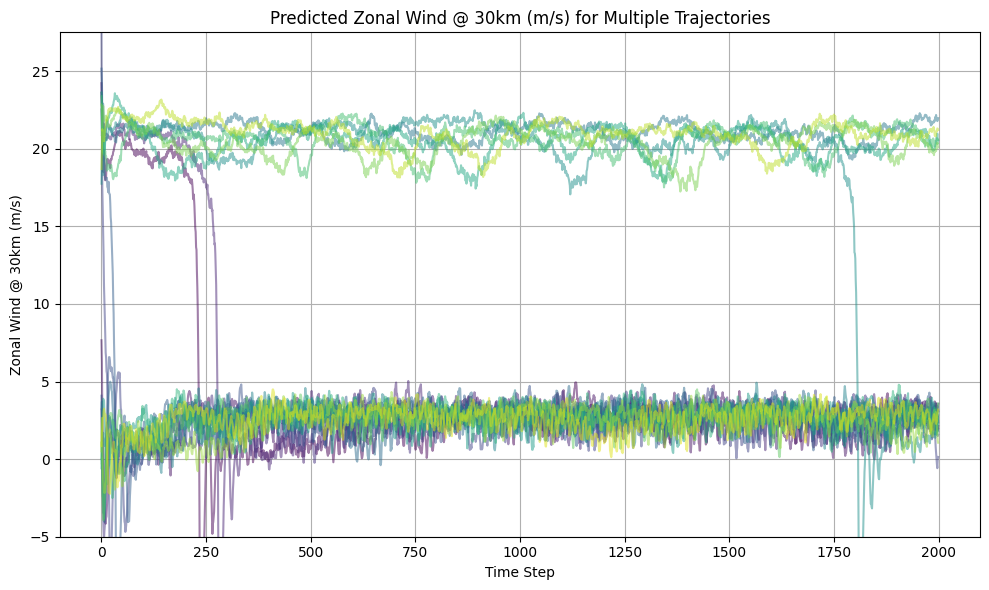

In [5]:
# Inference for multiple epochs
import datetime
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

time_step = 2000
num_ens = 1

model_weights_path = rf"C:\Users\danie\OneDrive\Desktop\work_torch\model_at_2025-06-11_09-46-01.645367\model_at_epoch30"

# Initialize model
model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim)
model.load_state_dict(torch.load(model_weights_path, map_location=device))
model = model.to(device)
model.eval()

print(f"Model loaded from {model_weights_path}")

initial_conditions_path = r"C:\Users\danie\OneDrive\Desktop\SHORT\holton_mass_essentials\du1p0_h38p5\vae_initial_conditions.npy"
x_init_set = np.load(initial_conditions_path)
x_init_set_norm = (x_init_set - mean_psi) / std_psi
x_init_set_norm = x_init_set_norm[:, :]
print(f"Initial conditions shape: {x_init_set_norm.shape}")
z = torch.zeros([1, latent_dim], device=device)
num_trajectories = x_init_set_norm.shape[0]

pred_all = np.zeros([time_step, num_trajectories, 75])
pred = np.zeros([time_step, 75])


with torch.no_grad():
    for k in tqdm(range(num_trajectories), desc=f"Trajectory Inference"):
        initial_cond = torch.tensor(x_init_set_norm[k], dtype=torch.float32, device=device).view(1, -1)
        print(f"Initial condition shape for trajectory {k+1}: {initial_cond.shape}")
        z = torch.zeros([1, latent_dim], device=device)
        traj = []
        for t in tqdm(range(time_step), desc=f"Time Step Inference for Trajectory {k+1}"):
            z = torch.randn_like(z)
            cond = initial_cond if t == 0 else torch.tensor(traj[-1], dtype=torch.float32, device=device).view(1, -1)
            y = model.decode(z, cond)
            traj.append(y.view(-1).cpu().numpy())
        pred_all[:, k, :] = np.stack(traj)

pred_all_denorm = pred_all * std_psi + mean_psi
uref_all = pred_all_denorm[:, :,63]  

t = np.arange(time_step)
fig, ax = plt.subplots(figsize=(10, 6))
for i in range(num_trajectories):
    color = plt.cm.viridis(i / num_trajectories)
    ax.plot(t, uref_all[:, i], label = f"Traj {i+1}", color=color, alpha=0.5)

ax.set_title("Predicted Zonal Wind @ 30km (m/s) for Multiple Trajectories")
ax.set_xlabel("Time Step")
ax.set_ylabel("Zonal Wind @ 30km (m/s)")
ax.set_ylim(-5, 27.5)
ax.grid(True)
plt.tight_layout()
plt.show()


# Inference

Model loaded from C:\Users\danie\OneDrive\Desktop\work_torch\model_at_2025-06-12_11-17-00.343815\model_at_epoch5
Initial condition shape: torch.Size([1, 75])


Mini Inference at Epoch 5: 100%|██████████| 2000/2000 [00:02<00:00, 753.03it/s] 


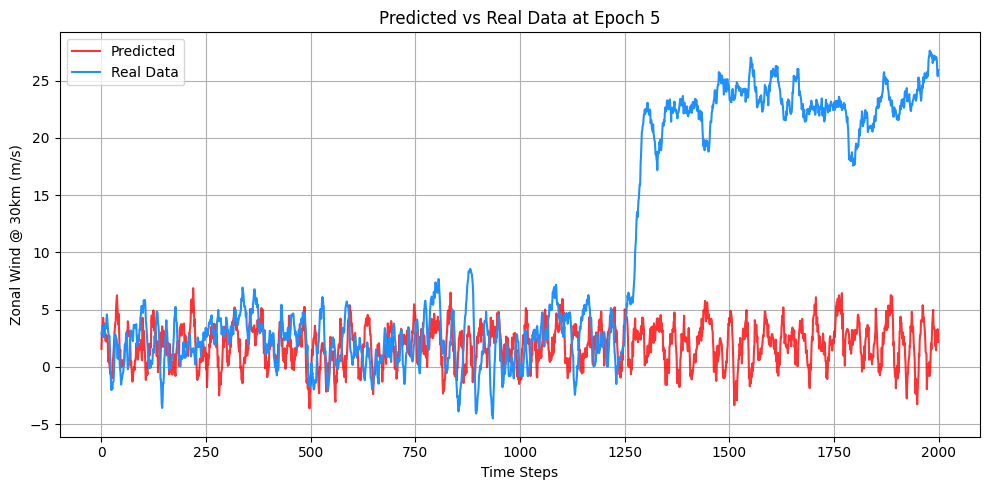

In [23]:
# Inference for multiple epochs
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

epoch = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_weights_path = rf"C:\Users\danie\OneDrive\Desktop\work_torch\model_at_2025-06-12_11-17-00.343815\model_at_epoch{epoch}"

# Initialize model
model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim)
model.load_state_dict(torch.load(model_weights_path, map_location=device))
model = model.to(device)
model.eval()

print(f"Model loaded from {model_weights_path}")

pred = np.zeros([time_step, 75, num_ens])

initial_cond = torch.tensor(psi[0], dtype=torch.float32, device=device).view(1, -1)
print(f"Initial condition shape: {initial_cond.shape}")
z = torch.zeros([1, latent_dim], device=device)

level = 63
model.eval()
z = torch.zeros([1, latent_dim], device=device)
with torch.no_grad():
    initial_cond = torch.reshape(torch.tensor(psi[0,:], dtype=torch.float32, device=device), [1, 75]).float().cuda()
    time_steps = 2000
    pred = np.zeros([time_steps, 75])
    for k in tqdm(range(0, time_steps), desc = f"Mini Inference at Epoch {epoch}"):
            z = torch.randn_like(z)
            y = (model.decode(z, initial_cond.float().cuda())).detach().cpu().numpy()
            pred[k, :] = y
            initial_cond = torch.tensor(y, dtype=torch.float32, device=device).float().cuda()

pred_mean = pred * std_psi + mean_psi
plt.figure(figsize=(10, 5))
plt.plot(pred_mean[:, level], label='Predicted', color='red', alpha=0.8)
plt.plot(real_data[:time_steps, 1, level], label='Real Data', color='dodgerblue')
plt.title(f'Predicted vs Real Data at Epoch {epoch}')
plt.xlabel('Time Steps')
plt.ylabel('Zonal Wind @ 30km (m/s)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f'{folder}/epoch_{epoch}_pred_vs_real.png')
plt.show()


# Inference With Multiple Trajectories

Model weights loaded from C:\Users\danie\OneDrive\Desktop\work_torch\model_at_2025-06-12_13-05-24.558718\model_at_epoch5.


Current Trajectory 5: 100%|██████████| 10000/10000 [00:03<00:00, 2571.43it/s]


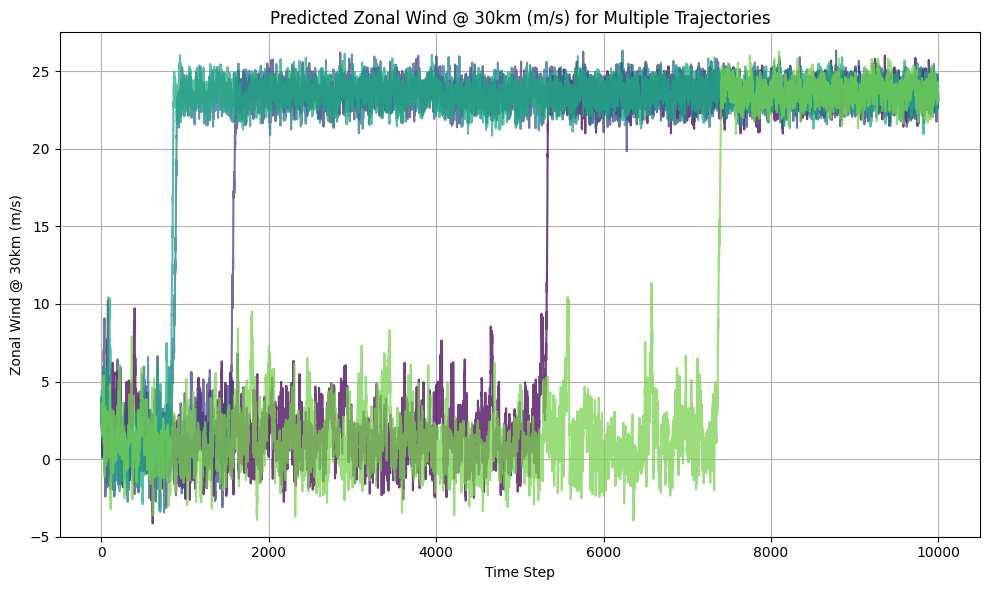

In [9]:
import os
from tqdm import tqdm
# MODIFY THIS LINE FOR MODEL TESTING
model_weights_path = r"C:\Users\danie\OneDrive\Desktop\work_torch\model_at_2025-06-12_13-05-24.558718\model_at_epoch5"
model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim)
model.load_state_dict(torch.load(model_weights_path, map_location=device))
model = model.to(device)
model.eval()
epoch = 5
num_trajectories = 5

if os.path.exists(model_weights_path):
    model.load_state_dict(torch.load(model_weights_path))
    print(f"Model weights loaded from {model_weights_path}.")


time_step = 10000
pred = np.zeros ([time_step, 75])
pred_all = np.zeros([time_step, num_trajectories, 75])

with torch.no_grad():
    for k in range(num_trajectories):
        initial_cond = torch.reshape(torch.tensor(psi[0,:], dtype=torch.float32, device=device), [1, 75]).float().cuda()
        traj = []
        for t in tqdm(range(time_step), desc = f"Current Trajectory {k+1}"):
            z = torch.randn_like(z)
            y = (model.decode(z, initial_cond.float().cuda())).detach().cpu().numpy()
            traj.append(y)
            y_denorm = (y * std_psi[:, :] + mean_psi[:, :])
            initial_cond = torch.tensor((y_denorm - mean_psi[:, :]) / std_psi[:, :])

        traj = np.stack(traj, axis=0).squeeze()  # Also gives (2000, 75)
        pred_all[:, k, :] = traj

        
    pred_all_denorm = pred_all * std_psi + mean_psi
    uref_all = pred_all_denorm[:, :, 63]  

    t = np.arange(time_step)
    fig, ax = plt.subplots(figsize=(10, 6))
    for i in range(num_trajectories):
        color = plt.cm.viridis(i / num_trajectories)
        ax.plot(t, uref_all[:, i], label = f"Traj {i+1}", color=color, alpha=0.75)

    ax.set_title("Predicted Zonal Wind @ 30km (m/s) for Multiple Trajectories")
    ax.set_xlabel("Time Step")
    ax.set_ylabel("Zonal Wind @ 30km (m/s)")
    ax.set_ylim(-5, 27.5)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

# Testing the Predictive Model

## Overview
This section outlines our testing strategy to validate the accuracy, robustness, and reliability of our predictive model. Rigorous testing is critical to ensure that our model performs well under various tests.
Set flags to 1 based on which metric(s) you would like to test.

In the next cell are the flags and some basic parameters.

In [21]:
#FLAGS to determine testing
plot_data = 1
#what level do you want to plot
level = 13
CCDF = 0
Bi_modal_distribution = 1
single_step_profiles = 0
#for the single_step_profiles
NUM_SAMPLES = 5
#what weights do you want to use?
MODEL_PATH = r"C:\Users\danie\OneDrive\Desktop\work_torch\training_only_on_74th_feature\model_at_epoch5.pth"
LEVEL = 13

There are two paths here that you will manually set. One to the physical data and the other to the predictions. 
# WARNING
Unless you're running new tests...
Do not run this cell multiple times after testing as it will create a new folder based on your current time!

In [23]:
#Initialize Data
import numpy as np
import matplotlib.pyplot as plt
import datetime
import os

# Load the data; shape = (300000, 2, 75)
real_data = np.load(r"C:\Users\danie\OneDrive\Desktop\work_torch\long_run_310k.npy")
predictions = np.load(r"C:\Users\danie\OneDrive\Desktop\work_torch\prediction_for_single_feature_13.npy")
predictions = predictions.reshape(300000, 1)  # Reshape to (300000, 75, 1)
#reshape the predictions so that it matches the real_data shape
print(real_data.shape)
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S.%f")
folder = f"testing_at_{timestamp}"
os.mkdir(folder)
subfolders = ['timeseries', 'CCDF', 'bi_modal_distribution', 'single_step_profiles']
# Create each subdirectory inside the main folder
for subfolder in subfolders:
    path = os.path.join(folder, subfolder)
    os.mkdir(path)
    print(f"Created subfolder: {path}")
SAVE_DIR = os.path.join(folder, "single_step_profiles")

(309700, 2, 75)
Created subfolder: testing_at_2025-06-03_16-39-32.075062\timeseries
Created subfolder: testing_at_2025-06-03_16-39-32.075062\CCDF
Created subfolder: testing_at_2025-06-03_16-39-32.075062\bi_modal_distribution
Created subfolder: testing_at_2025-06-03_16-39-32.075062\single_step_profiles


In [9]:
# CCDF Error bars

import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import linregress
import seaborn as sns

CCDF_sum = 0

import datetime
import os


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# MODIFY THIS LINE FOR MODEL TESTING
model_weights_path = r"C:\Users\danie\OneDrive\Desktop\work_torch\training_only_on_63rd_feature\model_at_epoch4.pth"

#Initialize model
model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim)
model.load_state_dict(torch.load(model_weights_path, map_location=device))
model = model.to(device)
model.eval()

print(f"Model loaded from {model_weights_path}")
time_step = 300000
num_ens = 1
pred = np.zeros([time_step, 75, num_ens])


initial_cond = torch.tensor(psi[0], dtype=torch.float32, device=device).view(1, -1)
print(f"Initial condition shape: {initial_cond.shape}")
z = torch.zeros([1, latent_dim], device=device)

with torch.no_grad():
    for k in tqdm(range(time_step), desc=f"Epoch {4} Inference"):
        for ens in range(num_ens):
            z = torch.randn_like(z)

            cond = initial_cond if k == 0 else torch.tensor(pred[k - 1, ens], dtype=torch.float32, device=device).view(1, -1)
            y = model.decode(z, cond)
            y_cpu = y.squeeze().cpu().numpy()
            pred[k, ens] = y_cpu
            initial_cond = y  # Update for next step

single_feature = 63
std_scalar = std_psi[0, single_feature] if std_psi.ndim > 1 else std_psi[single_feature]
mean_scalar = mean_psi[0, single_feature] if mean_psi.ndim > 1 else mean_psi[single_feature]

pred_mean = pred[:, 0] * std_scalar + mean_scalar  # Assuming pred is shape (time_step, 1)
actual_values = psi[:time_step] * std_scalar + mean_scalar

single_feature = 63
std_scalar = std_psi[0, single_feature] if std_psi.ndim > 1 else std_psi[single_feature]
mean_scalar = mean_psi[0, single_feature] if mean_psi.ndim > 1 else mean_psi[single_feature]

pred_mean = pred[:, 0] * std_scalar + mean_scalar  # Assuming pred is shape (time_step, 1)
actual_values = psi[:time_step] * std_scalar + mean_scalar
np.save(f"prediction_for_single_feature_{single_feature}", pred_mean)

# Load the data; shape = (300000, 2, 75)
real_data = np.load(r"C:\Users\danie\OneDrive\Desktop\work_torch\long_run_310k.npy")
predictions = pred_mean.reshape(300000, 1)

if (CCDF):
    real_data_1d = real_data[:, 1, 63]  # Now shape is (309700,)
    predictions_1d = predictions[:, 0, 63]  # shape (300000,)

    # Define bounds (assuming they apply to both datasets)
    upper_bound = 53.8 / 2.8935
    lower_bound = 1.75 / 2.8935

    # Function to calculate transition durations
    def calculate_transition_durations(y_values, upper_bound, lower_bound):
        times_between_transitions = []
        transition_start = None
        above_upper = False
        below_lower = False

        for i in range(1, len(y_values)):
            if y_values[i] < lower_bound:  
                below_lower = True
                above_upper = False
            elif y_values[i] > upper_bound:  
                if below_lower and transition_start is not None:
                    times_between_transitions.append(i - transition_start)
                    transition_start = None  
                above_upper = True
                below_lower = False

            if below_lower and transition_start is None:
                transition_start = i

        return times_between_transitions

    # Compute transition durations for real data
    real_durations = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)

    # Compute transition durations for predictions data
    pred_durations = calculate_transition_durations(predictions_1d, upper_bound, lower_bound)

    # Plot setup
    plt.figure(figsize=(10, 6))

    def bootstrap_ci(data, num_bootstraps=1000, confidence_level=0.95):
        sample_size = len(data)
        bootstrap_means = np.zeros(num_bootstraps)
        
        for i in range(num_bootstraps):
            bootstrap_sample = np.random.choice(data, size=sample_size, replace=True)
            bootstrap_means[i] = np.mean(bootstrap_sample)
        
        ci_lower = np.percentile(bootstrap_means, (1 - confidence_level) / 2 * 100)
        ci_upper = np.percentile(bootstrap_means, (1 + confidence_level) / 2 * 100)
        
        return np.mean(data), ci_lower, ci_upper

    # === REAL DATA CCDF AND FIT ===
    if len(real_durations) == 0:
        print("No transitions detected in real data with current bounds!")
    else:
        real_data_sorted = np.sort(real_durations)
        ccdf_real = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)

        valid_indices_real = ccdf_real > 0
        x_fit_real = real_data_sorted[valid_indices_real]
        y_fit_real = np.log(ccdf_real[valid_indices_real])

        slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)

        x_line_real = np.linspace(min(x_fit_real), max(x_fit_real), 40)
        y_line_real = np.exp(slope_real * x_line_real + intercept_real)

        # Create a grid of x values (time steps / durations)

        bootstrap_mean = []
        ci_lower_vals = []
        ci_upper_vals = []

        for x in x_line_real:
            valid_indices = (real_durations > x).astype(float)
            mean_val, lower, upper = bootstrap_ci(valid_indices)
            bootstrap_mean.append(mean_val)
            ci_lower_vals.append(lower)
            ci_upper_vals.append(upper)

        bootstrap_mean = np.array(bootstrap_mean)
        ci_lower_vals = np.array(ci_lower_vals)
        ci_upper_vals = np.array(ci_upper_vals)

        # Calculate error bars (difference from the bootstrap mean)
        error_lower = bootstrap_mean - ci_lower_vals
        error_upper = ci_upper_vals - bootstrap_mean

        plt.step(real_data_sorted, ccdf_real, where='post', label='Real Data CCDF', linewidth=2, linestyle='--')
        plt.errorbar(x_line_real, bootstrap_mean, yerr=[error_lower, error_upper],
                fmt='o', color='blue', capsize=3, ecolor='blue', label='Real Bootstrap 95% CI')
        plt.plot(x_line_real, y_line_real, 'b-', label=f'Real Exp Fit (slope={slope_real:.4f})', linewidth=2)

    # === PREDICTIONS CCDF AND FIT ===
    if len(pred_durations) == 0:
        print("No transitions detected in predictions with current bounds!")
    else:
        pred_data_sorted = np.sort(pred_durations)
        ccdf_pred = 1 - np.arange(1, len(pred_data_sorted) + 1) / len(pred_data_sorted)

        valid_indices_pred = ccdf_pred > 0
        x_fit_pred = pred_data_sorted[valid_indices_pred]
        y_fit_pred = np.log(ccdf_pred[valid_indices_pred])

        slope_pred, intercept_pred, *_ = linregress(x_fit_pred, y_fit_pred)

        x_line_pred = np.linspace(min(x_fit_pred), max(x_fit_pred), 40)
        y_line_pred = np.exp(slope_pred * x_line_pred + intercept_pred)

        # Create a grid of x values (time steps / durations)

        bootstrap_mean = []
        ci_lower_vals = []
        ci_upper_vals = []

        for x in x_line_pred:
            valid_indices = (pred_durations > x).astype(float)
            mean_val, lower, upper = bootstrap_ci(valid_indices)
            bootstrap_mean.append(mean_val)
            ci_lower_vals.append(lower)
            ci_upper_vals.append(upper)

        bootstrap_mean = np.array(bootstrap_mean)
        ci_lower_vals = np.array(ci_lower_vals)
        ci_upper_vals = np.array(ci_upper_vals)

        # Calculate error bars (difference from the bootstrap mean)
        error_lower = bootstrap_mean - ci_lower_vals
        error_upper = ci_upper_vals - bootstrap_mean

        plt.step(pred_data_sorted, ccdf_pred, where='post', label='Predictions CCDF', linewidth=2, linestyle='-.', color='red')
        plt.errorbar(x_line_pred, bootstrap_mean, yerr=[error_lower, error_upper],
                fmt='o', color='red', capsize=3, ecolor='red', label='Pred Bootstrap 95% CI')
        plt.plot(x_line_pred, y_line_pred, 'r-', label=f'Pred Exp Fit (slope={slope_pred:.4f})', linewidth=2)

        CCDF_sum += slope_pred

    # Plot labels and formatting
    plt.xlabel('Time Duration (Steps)')
    plt.ylabel('CCDF')
    plt.title('CCDF of Time Between B->A and A->B Transitions (Exponential Fit)')
    plt.yscale("log")  # y-axis log scale
    plt.xscale("linear")  # x-axis linear scale
    plt.grid()
    plt.legend()
    plt.tight_layout()
    save_path = os.path.join(folder, "CCDF")
    save_path = os.path.join(save_path, f"CCDF_plot{i}")
    plt.savefig(save_path)
    plt.show()


Model loaded from C:\Users\danie\OneDrive\Desktop\work_torch\training_only_on_63rd_feature\model_at_epoch4.pth
Initial condition shape: torch.Size([1, 1])


Epoch 4 Inference:   1%|          | 2844/300000 [00:05<08:47, 563.47it/s]

: 

c:\USERS\DANIE\ONEDRIVE\DESKTOP\WORK_TORCH\.VENV\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\USERS\DANIE\ONEDRIVE\DESKTOP\WORK_TORCH\.VENV\Lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Reference Real Data average_transition_time: 678.8783068783068
Reference Prediction Data average_transition_time: nan


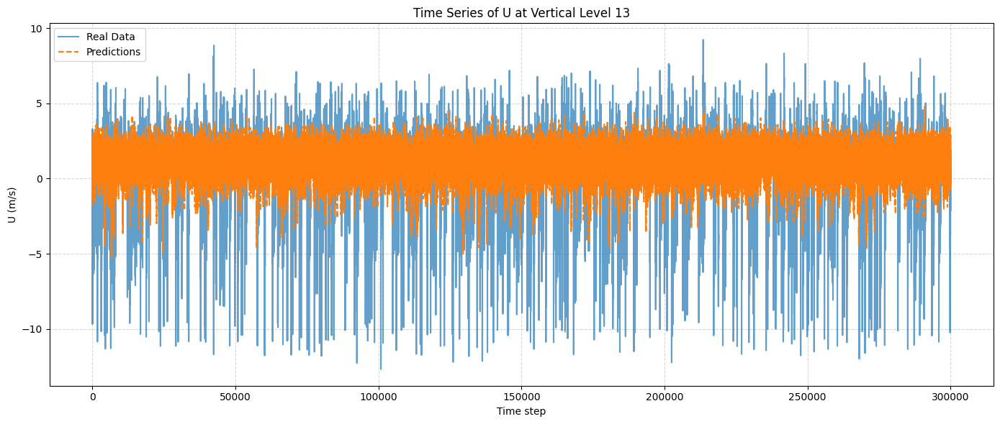

Shape of zonal_wind_data_real: (309700,)
Shape of zonal_wind_data_predictions: (300000, 1)


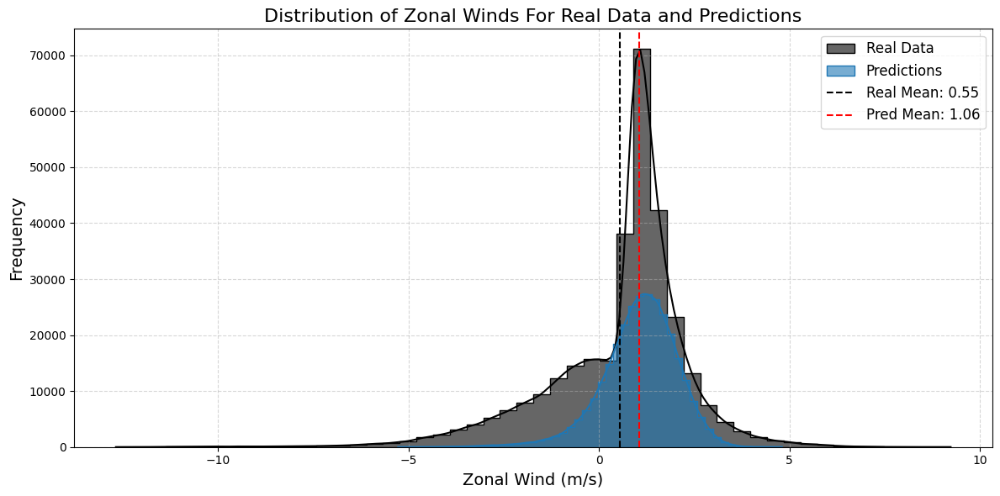

In [24]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import linregress
import seaborn as sns
import random

# Function to calculate transition durations
def calculate_transition_durations(y_values, upper_bound, lower_bound):
    times_between_transitions = []
    transition_start = None
    above_upper = False
    below_lower = False

    for i in range(1, len(y_values)):
        if y_values[i] < lower_bound:  
            below_lower = True
            above_upper = False
        elif y_values[i] > upper_bound:  
            if below_lower and transition_start is not None:
                times_between_transitions.append(i - transition_start)
                transition_start = None  
            above_upper = True
            below_lower = False

        if below_lower and transition_start is None:
            transition_start = i

    return times_between_transitions

UPPER_BOUND = 53.8 / 2.8935
LOWER_BOUND = 7.41
#print out avarega transition times
real_data_1d = real_data[:, 0, 63]
real_durations = calculate_transition_durations(real_data_1d, UPPER_BOUND, LOWER_BOUND)
real_data_sorted = np.sort(real_durations)
slope_real = np.mean(real_data_sorted)
prediction_data_1d = predictions[:]
prediction_durations = calculate_transition_durations(prediction_data_1d, UPPER_BOUND, LOWER_BOUND)
prediction_data_sorted = np.sort(prediction_durations)
slope_prediction = np.mean(prediction_data_sorted)
print(f"Reference Real Data average_transition_time: {slope_real}")
print(f"Reference Prediction Data average_transition_time: {slope_prediction}")

if (plot_data):
    #note that the value 300000 will have to change depending on the real and predictions data length
    u_profile_real = real_data[:300000, 0, level]  # Match time length with predictions
    u_profile_pred = predictions[:]
    time_steps = np.arange(len(u_profile_pred))

    # === Plot ===
    plt.figure(figsize=(14, 6))

    plt.plot(time_steps, u_profile_real, label='Real Data', alpha=0.7)
    plt.plot(time_steps, u_profile_pred, label='Predictions', linestyle='--')


    # Labels, legend, and formatting
    plt.xlabel('Time step')
    plt.ylabel('U (m/s)')
    plt.title(f'Time Series of U at Vertical Level {level}')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    save_path = os.path.join(folder, "timeseries")
    save_path = os.path.join(save_path, "real_prediction_plot")
    plt.savefig(save_path)
    plt.show()

if (CCDF):
    real_data_1d = real_data[:, 0, 61]  # Now shape is (309700,)
    predictions_1d = predictions[:, 0, 61]  # shape (300000,)

    # Define bounds (assuming they apply to both datasets)
    upper_bound = 53.8 / 2.8935
    lower_bound = 7.41


    # Compute transition durations for real data
    real_durations = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)

    # Compute transition durations for predictions data
    pred_durations = calculate_transition_durations(predictions_1d, upper_bound, lower_bound)

    # Plot setup
    plt.figure(figsize=(10, 6))

    # === REAL DATA CCDF AND FIT ===
    if len(real_durations) == 0:
        print("No transitions detected in real data with current bounds!")
    else:
        real_data_sorted = np.sort(real_durations)
        ccdf_real = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)

        valid_indices_real = ccdf_real > 0
        x_fit_real = real_data_sorted[valid_indices_real]
        y_fit_real = np.log(ccdf_real[valid_indices_real])

        slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)

        x_line_real = np.linspace(min(x_fit_real), max(x_fit_real), 100)
        y_line_real = np.exp(slope_real * x_line_real + intercept_real)

        plt.step(real_data_sorted, ccdf_real, where='post', label='Real Data CCDF', linewidth=2, linestyle='--')
        plt.plot(x_line_real, y_line_real, 'b-', label=f'Real Exp Fit (slope={slope_real:.4f})', linewidth=2)

    # === PREDICTIONS CCDF AND FIT ===
    if len(pred_durations) == 0:
        print("No transitions detected in predictions with current bounds!")
    else:
        pred_data_sorted = np.sort(pred_durations)
        ccdf_pred = 1 - np.arange(1, len(pred_data_sorted) + 1) / len(pred_data_sorted)

        valid_indices_pred = ccdf_pred > 0
        x_fit_pred = pred_data_sorted[valid_indices_pred]
        y_fit_pred = np.log(ccdf_pred[valid_indices_pred])

        slope_pred, intercept_pred, *_ = linregress(x_fit_pred, y_fit_pred)

        x_line_pred = np.linspace(min(x_fit_pred), max(x_fit_pred), 100)
        y_line_pred = np.exp(slope_pred * x_line_pred + intercept_pred)

        plt.step(pred_data_sorted, ccdf_pred, where='post', label='Predictions CCDF', linewidth=2, linestyle='-.', color='red')
        plt.plot(x_line_pred, y_line_pred, 'r-', label=f'Pred Exp Fit (slope={slope_pred:.4f})', linewidth=2)

    # Plot labels and formatting
    plt.xlabel('Time Duration (Steps)')
    plt.ylabel('CCDF')
    plt.title('CCDF of Time Between B->A and A->B Transitions (Exponential Fit)')
    plt.yscale("log")  # y-axis log scale
    plt.xscale("linear")  # x-axis linear scale
    plt.grid()
    plt.legend()
    plt.tight_layout()
    save_path = os.path.join(folder, "CCDF")
    save_path = os.path.join(save_path, "CCDF_plot")
    plt.savefig(save_path)
    plt.show()
if (Bi_modal_distribution):
    zonal_wind_data_real = real_data[:, 0, 13]  # variable index 1 (e.g., zonal wind), level 60
    zonal_wind_data_predictions = predictions[:]  # variable index 0 (predictions), level 60

    print(f"Shape of zonal_wind_data_real: {zonal_wind_data_real.shape}")
    print(f"Shape of zonal_wind_data_predictions: {zonal_wind_data_predictions.shape}")

    # Plot the bimodal histogram
    plt.figure(figsize=(12, 6))

    # Create histograms (overlaid)
    sns.histplot(zonal_wind_data_real, bins=50, kde=True, color='black', alpha=0.6, element='step', label='Real Data')
    sns.histplot(zonal_wind_data_predictions, bins=50, kde=True, color='red', alpha=0.6, element='step', label='Predictions')

    # Customize plot labels and title
    plt.title('Distribution of Zonal Winds For Real Data and Predictions', fontsize=16)
    plt.xlabel('Zonal Wind (m/s)', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)

    # Add vertical lines at means
    plt.axvline(np.mean(zonal_wind_data_real), color='black', linestyle='--', label=f'Real Mean: {np.mean(zonal_wind_data_real):.2f}')
    plt.axvline(np.mean(zonal_wind_data_predictions), color='red', linestyle='--', label=f'Pred Mean: {np.mean(zonal_wind_data_predictions):.2f}')

    # Final plot settings
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    save_path = os.path.join(folder, "bi_modal_distribution")
    save_path = os.path.join(save_path, "bi_modal_distribution_plot")
    plt.savefig(save_path)
    plt.show()
if (single_step_profiles):
    # Ensure save directory exists
    os.makedirs(SAVE_DIR, exist_ok=True)

    # === Load model weights ===
    model.load_state_dict(torch.load(MODEL_PATH))
    model.eval()

    # === Randomly sample time points from real data ===
    time_indices = random.sample(range(0, real_data.shape[0] - 2), NUM_SAMPLES)
    print(f"Randomly sampled time steps: {time_indices}")

    # === Time series visualization ===
    real_data_timeseries = real_data[:, 1, LEVEL]
    time_steps_all = np.arange(len(real_data_timeseries))

    plt.figure(figsize=(12, 6))
    plt.plot(time_steps_all, real_data_timeseries, label="Real Data at Level 61", color='blue')

    # Mark sample points
    for idx_num, idx in enumerate(time_indices):
        plt.axvline(x=idx, color='green', linestyle='--', linewidth=2)
    if len(time_indices) > 0:
        plt.axvline(x=time_indices[0], color='green', linestyle='--', linewidth=2, label='Sampled Points')

    plt.title("Real Data Time Series with Sampled Points Highlighted")
    plt.xlabel("Time Step")
    plt.ylabel("U (m/s) at Level 61")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    save_path = os.path.join(SAVE_DIR, "real_data_timeseries_with_samples.png")
    plt.savefig(save_path)
    plt.show()

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    # === Iterate over each sampled time point ===
    for i, time_step in enumerate(time_indices):
        next_time_step = time_step + 1

        # === Real data: current and next ===
        real_current = real_data[time_step, 1, :]       
        real_next = real_data[next_time_step, 1, :]      

        # === Normalize real_current and make prediction for next step ===
        initial_condition_normalized = (real_current.reshape(1, 75, 1) - mean_psi.reshape(1, -1, 1)) / std_psi.reshape(1, -1, 1)
        current_input = torch.tensor(initial_condition_normalized, dtype=torch.float32).to(device)

        with torch.no_grad():
            z = torch.randn_like(z)
            print(z.shape, initial_cond.shape)
            y = (model.decode(z.float().cuda(),initial_cond.float().cuda())).detach().cpu().numpy()

        # === Denormalize predicted next ===
        pred_next_denorm = y.squeeze() * std_psi.squeeze() + mean_psi.squeeze()

        # === Extract U, Re(Psi), Im(Psi) components ===
        # U profiles
        U_current_real = real_current[51:74]
        U_next_real = real_next[51:74]
        U_next_pred = pred_next_denorm[51:74]

        # Re(Psi) profiles
        RePsi_current_real = real_current[0:24]
        RePsi_next_real = real_next[0:24]
        RePsi_next_pred = pred_next_denorm[0:24]

        # Im(Psi) profiles
        ImPsi_current_real = real_current[25:50]
        ImPsi_next_real = real_next[25:50]
        ImPsi_next_pred = pred_next_denorm[25:50]

        # === Differences ===
        U_diff_real = U_next_real - U_current_real
        U_diff_pred = U_next_pred - U_current_real

        RePsi_diff_real = RePsi_next_real - RePsi_current_real
        RePsi_diff_pred = RePsi_next_pred - RePsi_current_real

        ImPsi_diff_real = ImPsi_next_real - ImPsi_current_real
        ImPsi_diff_pred = ImPsi_next_pred - ImPsi_current_real

        # === Create a single figure with 3 rows (U, Re(Psi), Im(Psi)) ===
        fig, axes = plt.subplots(3, 2, figsize=(16, 18))  # 3 rows, 2 columns (Profile and Difference)

        z_levels_U = np.linspace(0, 70, 23)
        z_levels_RePsi = np.linspace(0, 70, 24)
        z_levels_ImPsi = np.linspace(0, 70, 25)

        # --- U ---
        axes[0, 0].plot(U_current_real, z_levels_U, 'x-', label="Real Current")
        axes[0, 0].plot(U_next_real, z_levels_U, 'd-', label="Real Next")
        axes[0, 0].plot(U_next_pred, z_levels_U, 's--', label="Predicted Next")
        axes[0, 0].set_title(f"U Profiles @ Step {time_step}")
        axes[0, 0].set_xlabel("U (m/s)")
        axes[0, 0].set_ylabel("Vertical Levels (km)")
        axes[0, 0].legend()

        axes[0, 1].plot(U_diff_real, z_levels_U, 'xb', label="Real Δ (Next - Current)")
        axes[0, 1].plot(U_diff_pred, z_levels_U, 'o--r', label="Pred Δ (Next - Current)")
        axes[0, 1].set_title("U Difference (Next - Current)")
        axes[0, 1].set_xlabel("ΔU (m/s)")
        axes[0, 1].legend()

        # --- Re(Psi) ---
        axes[1, 0].plot(RePsi_current_real, z_levels_RePsi, 'x-', label="Real Current")
        axes[1, 0].plot(RePsi_next_real, z_levels_RePsi, 'd-', label="Real Next")
        axes[1, 0].plot(RePsi_next_pred, z_levels_RePsi, 's--', label="Predicted Next")
        axes[1, 0].set_title(f"Re(Psi) Profiles @ Step {time_step}")
        axes[1, 0].set_xlabel("Re(Psi)")
        axes[1, 0].set_ylabel("Vertical Levels (km)")
        axes[1, 0].legend()

        axes[1, 1].plot(RePsi_diff_real, z_levels_RePsi, 'xb', label="Real Δ (Next - Current)")
        axes[1, 1].plot(RePsi_diff_pred, z_levels_RePsi, 'o--r', label="Pred Δ (Next - Current)")
        axes[1, 1].set_title("Re(Psi) Difference (Next - Current)")
        axes[1, 1].set_xlabel("ΔRe(Psi)")
        axes[1, 1].legend()

        # --- Im(Psi) ---
        axes[2, 0].plot(ImPsi_current_real, z_levels_ImPsi, 'x-', label="Real Current")
        axes[2, 0].plot(ImPsi_next_real, z_levels_ImPsi, 'd-', label="Real Next")
        axes[2, 0].plot(ImPsi_next_pred, z_levels_ImPsi, 's--', label="Predicted Next")
        axes[2, 0].set_title(f"Im(Psi) Profiles @ Step {time_step}")
        axes[2, 0].set_xlabel("Im(Psi)")
        axes[2, 0].set_ylabel("Vertical Levels (km)")
        axes[2, 0].legend()

        axes[2, 1].plot(ImPsi_diff_real, z_levels_ImPsi, 'xb', label="Real Δ (Next - Current)")
        axes[2, 1].plot(ImPsi_diff_pred, z_levels_ImPsi, 'o--r', label="Pred Δ (Next - Current)")
        axes[2, 1].set_title("Im(Psi) Difference (Next - Current)")
        axes[2, 1].set_xlabel("ΔIm(Psi)")
        axes[2, 1].legend()

        # === Finalize and Save ===
        plt.suptitle(f"Single Step Profile Comparisons at Time Step {time_step}", fontsize=18)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])

        save_path = os.path.join(SAVE_DIR, f"Profile_Summary_point_{time_step}.png")
        plt.savefig(save_path)
        plt.show()

        print(f"Combined plot saved for sampled point {time_step}")

    # Final debug
    print("Finished processing all sampled points.")
    print(real_data.shape)

# Representing the Latent Space

(309700, 75)
True
True
torch.Size([249999, 50])
torch.Size([249999, 75])
torch.Size([50000, 50])
torch.Size([50000, 75])


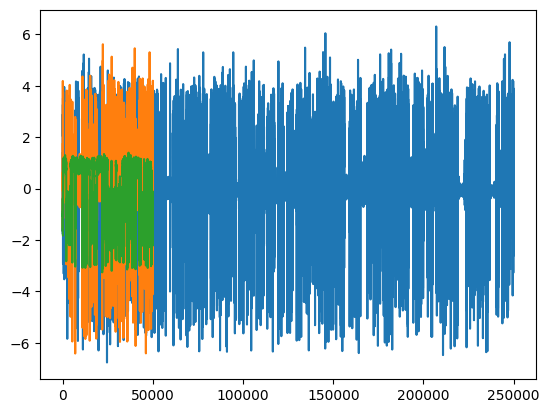

In [6]:
psi = np.load('long_run_310k.npy')

psi = psi[:,1,:]

# Normalization
mean_psi = np.mean(psi, axis=0, keepdims=True)
std_psi = np.std(psi, axis=0, keepdims=True)
psi = (psi - mean_psi) / std_psi

# Pre-processing
lead = 1

trainN = 250000
valN = 50000
index = 63

variable_range = [(0,24), (25, 49), (50, 74), (0, 49), (0,74)]

# Select the variable: 0 for real perturbation, 1 for imaginary perturbation, 2 for zonal winds
variable = 3
num_variables = variable_range[variable][1] - variable_range[variable][0] + 1

print(psi.shape)

np_psi_train_input = psi[0:trainN, variable_range[variable][0]:variable_range[variable][1]+1]
plt.plot(np_psi_train_input[:, -1])

np_psi_train_label = psi[lead:trainN+lead, :]

psi_train_input = torch.tensor(np_psi_train_input)
psi_train_label =  torch.tensor(np_psi_train_label)

# Make sure input and label lengths match
assert psi_train_input.shape[0] == psi_train_label.shape[0], "Input and label length mismatch"

#shuffle and map indices\
valid_indices = np.arange(0, trainN - lead)
np.random.seed(42)  # Optional for reproducibility
shuffled_indices = np.random.permutation(valid_indices)

np_psi_train_input = psi[shuffled_indices, variable_range[variable][0]:variable_range[variable][1]+1]
np_psi_train_label = psi[shuffled_indices + lead, :]

psi_train_input = torch.tensor(np_psi_train_input)
psi_train_label = torch.tensor(np_psi_train_label)

t = shuffled_indices[0]
print(torch.allclose(psi_train_input[0], torch.tensor(psi[t, variable_range[variable][0]:variable_range[variable][1]+1])))
print(torch.allclose(psi_train_label[0], torch.tensor(psi[t + 1])))

np_psi_val_input = psi[trainN:trainN+valN, variable_range[variable][0]:variable_range[variable][1]+1]
np_psi_val_label = psi[trainN+lead:trainN+valN+lead, :]
psi_val_input = torch.tensor(np_psi_val_input)
psi_val_label =  torch.tensor(np_psi_val_label)

print(psi_train_input.shape)
print(psi_train_label.shape)
print(psi_val_input.shape)
print(psi_val_label.shape)
plt.plot(np_psi_val_input[:,-1])
plt.plot(np_psi_val_label[:,-1])
plt.show()
# plt.plot(psi_val_input[0:50000,63])

In [11]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import plotly.express as px
import pandas as pd

# Load data
data = np.load("long_run_310k.npy")
zonal_wind = data[:, 0, 63]
upper, lower = 53.8 / 2.8935, 7.41

# Detect transitions
def detect_ssw_transitions(u_series, upper, lower):
    transitions = []
    in_A = False
    for i in range(1, len(u_series)):
        if u_series[i] < lower:
            in_A = True
        elif in_A and u_series[i] > upper:
            transitions.append(i)
            in_A = False
    return np.array(transitions)

# Extract states A and B
state_A = data[:, 0, :75]
state_B = data[:, 1, :75]

# Apply SSW transition detection to both
zonal_wind_A = data[:, 0, 63]
zonal_wind_B = data[:, 1, 63]
ssw_indices_A = detect_ssw_transitions(zonal_wind_A, upper, lower)
ssw_indices_B = detect_ssw_transitions(zonal_wind_B, upper, lower)

# Sample non-SSW from each
non_ssw_indices_A = np.setdiff1d(np.arange(len(data)), ssw_indices_A)
non_ssw_sample_A = np.random.choice(non_ssw_indices_A, size=len(ssw_indices_A), replace=False)

non_ssw_indices_B = np.setdiff1d(np.arange(len(data)), ssw_indices_B)
non_ssw_sample_B = np.random.choice(non_ssw_indices_B, size=len(ssw_indices_B), replace=False)

# Stack data
X = np.vstack([
    state_A[ssw_indices_A],
    state_A[non_ssw_sample_A],
    state_B[ssw_indices_B],
    state_B[non_ssw_sample_B]
]).astype(np.float32)

# Create 4-class labels
labels = (
    ["A_SSW"] * len(ssw_indices_A) +
    ["A_NoSSW"] * len(ssw_indices_A) +
    ["B_SSW"] * len(ssw_indices_B) +
    ["B_NoSSW"] * len(ssw_indices_B)
)


model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim).cuda()
model.load_state_dict(torch.load(
    r"C:\Users\danie\OneDrive\Desktop\work_torch\checkpoint_785.pth",
    map_location=torch.device('cpu')
))
model.eval()

# Encode data
with torch.no_grad():
    mu, _ = model.encode(torch.tensor(X, dtype=torch.float32).cuda())
    latent_3d = PCA(n_components=3).fit_transform(mu.cpu().numpy())

# Build DataFrame
df = pd.DataFrame(latent_3d, columns=["PC1", "PC2", "PC3"])
df["Category"] = labels

# Plot 3D PCA
fig = px.scatter_3d(df, x="PC1", y="PC2", z="PC3", color="Category",
                    opacity=0.75,
                    title="Latent Space Projection: 4-Way Classification, mu",
                    width=1200, height=800)
fig.show()


# Visualizing the State Space of the Physical and Predictive Data

In [ ]:
import numpy as np
import torch
import plotly.express as px
import pandas as pd

# Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_weights_path = r"C:\Users\danie\OneDrive\Desktop\work_torch\checkpoint_785.pth"
model = ConditionalVAE(input_dim, latent_dim, output_dim, condition_dim)
model.load_state_dict(torch.load(model_weights_path, map_location=device))
model = model.to(device)
model.eval()

# Feature indices to visualize
feature_indices = [14, 38, 64]
num_examples = 25

records = []

index = 0
for t in range(num_examples):
    initial_cond_raw = psi[index, :]
    true_next_state = psi[index + 1, :]
    index += 1

    # Normalize initial condition
    initial_cond_norm = (initial_cond_raw - mean_psi[:, 0]) / std_psi[:, 0]
    initial_cond_norm = initial_cond_norm[:50]
    initial_cond_tensor = torch.tensor(initial_cond_norm, dtype=torch.float32, device=device).view(1, -1)

    # Predict next state
    with torch.no_grad():
        z = torch.randn(1, latent_dim).to(device)
        pred_norm = model.decode(z, initial_cond_tensor)
        pred_norm = pred_norm.squeeze().cpu().numpy()
        pred_denorm = pred_norm * std_psi[:, 0] + mean_psi[:, 0]

    # Denormalize ground truth
    true_next_denorm = true_next_state * std_psi[:, 0] + mean_psi[:, 0]
    initial_cond_denorm = initial_cond_raw

    # Extract feature triplets
    ic_feats = initial_cond_denorm[feature_indices]
    pred_feats = pred_denorm[feature_indices]
    true_feats = true_next_denorm[feature_indices]

    # Add to records
    records.append({"Trajectory": f"Traj {t}", "label": "Initial Condition", "x": ic_feats[0], "y": ic_feats[1], "z": ic_feats[2]})
    records.append({"Trajectory": f"Traj {t}", "label": "Prediction", "x": pred_feats[0], "y": pred_feats[1], "z": pred_feats[2]})
    records.append({"Trajectory": f"Traj {t}", "label": "Ground Truth", "x": true_feats[0], "y": true_feats[1], "z": true_feats[2]})

# DataFrame for plotting
df = pd.DataFrame(records)

# Plot with Plotly
fig = px.scatter_3d(
    df, x="x", y="y", z="z", color="label", symbol="label",
    title="Initial → Prediction vs Ground Truth (3D Feature Space)",
    width=1400, height=600
)
fig.update_traces(marker=dict(size=4))
fig.update_layout(scene=dict(
    xaxis_title=f"Feature {feature_indices[0]}",
    yaxis_title=f"Feature {feature_indices[1]}",
    zaxis_title=f"Feature {feature_indices[2]}"
))
fig.show()